# EDA on GRN temporal dynamics

- Last updated: 4/5/2024
- Author: Yang-Joon Kim

Description/notes:
- Exploratry data analysis on GRNs from different timepoints/pseudotimes.

- Analyses where we'd like to see how the GRN evolves over time/development.
    - 1) for a trajectory of cell-types, how does the GRN evolves during the differentiation (pseudotime axis) - focus on the NMP trajectories.
    - [Dictys] Optionally, for the same dev stage, how does the GRN evolves over the developmental trajectories (mesoderm/neuroectoderm trajectories, for example). 
    
    - 2) for the same cell-type (progenitor, or in intermediate fate), how does the GRN evolves over the developmental stages (real-time).

    - From these analyses, can we learn a transient key driver genes/TFs that were unidentifiable from "static" GRNs?

- Note that the datasets that we're using are not "finalized", therefore our goal is not relying too much on the end product, but rather establishing a conceptual framework for which analyses would be relevant for "finalized" data.

In [1]:
# 0. Import

import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

import scipy.sparse as sp
from itertools import combinations

In [2]:
import celloracle as co
co.__version__

/home/yang-joon.kim/.conda/envs/celloracle_env/lib/python3.8/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/home/yang-joon.kim/.conda/envs/celloracle_env/lib/python3.8/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def dna_to_twobit(dna: str

'0.14.0'

In [3]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 600

In [145]:
import logging

# Set the logging level to WARN, filtering out informational messages
logging.getLogger().setLevel(logging.WARNING)

import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault) #Reset rcParams to default

# Set the default font to Arial
mpl.rcParams['font.family'] = 'Arial'

# If Arial is not available on your system, you might need to specify an alternative or ensure Arial is installed.
# On some systems, you might need to use 'font.sans-serif' as a fallback option:
# mpl.rcParams['font.sans-serif'] = 'Arial'

# Editable text and proper LaTeX fonts in illustrator
# matplotlib.rcParams['ps.useafm'] = True
# Editable fonts. 42 is the magic number for editable text in PDFs
mpl.rcParams['pdf.fonttype'] = 42
sns.set(style='whitegrid', context='paper')

# Plotting style function (run this before plotting the final figure)
def set_plotting_style():
    plt.style.use('seaborn-paper')
    plt.rc('axes', labelsize=12)
    plt.rc('axes', titlesize=12)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.rc('legend', fontsize=10)
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('xtick.major', pad=2)
    plt.rc('ytick.major', pad=2)
    plt.rc('mathtext', fontset='stixsans', sf='sansserif')
    plt.rc('figure', figsize=[10,9])
    plt.rc('svg', fonttype='none')

    # Override any previously set font settings to ensure Arial is used
    plt.rc('font', family='Arial')

In [163]:
set_plotting_style()

In [5]:
figpath = "/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/zebrahub-multiome-analysis/figures/EDA_GRN_dynamics_timepoints/"
os.makedirs(figpath, exist_ok=True)

## Step 0. Import the GRNs (Links object)

In [5]:
# # import the GRNs (Links objects)
# TDR118_GRN = co.load_hdf5("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/sequencing_ver1/TDR118_cicero_output/08_TDR118_celltype_GRNs.celloracle.links")
# TDR119_GRN = co.load_hdf5("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/sequencing_ver1/TDR119_cicero_output/08_TDR119_celltype_GRNs.celloracle.links")

In [8]:
# # Import the GRNs from all 6 timepoints
# # Note that we chose TDR118 for 15somites
# GRN_16hpf = co.load_hdf5("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/sequencing_ver1/TDR118_cicero_output/08_TDR118_celltype_GRNs.celloracle.links")
# GRN_19hpf = co.load_hdf5("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/sequencing_ver1/TDR125_cicero_output/08_TDR125_celltype_GRNs.celloracle.links")
# GRN_24hpf = co.load_hdf5("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/sequencing_ver1/TDR124_cicero_output/08_TDR124_celltype_GRNs.celloracle.links")

In [6]:
# define the master directory for all Links objects (GRN objects from CellOracle)
oracle_base_dir = "/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/03_celloracle_celltype_GRNs/"

# extract the dataset names
list_files = os.listdir(oracle_base_dir)
list_files = [x for x in list_files if x.startswith("TDR")]
list_files

['TDR126',
 'TDR127',
 'TDR119reseq',
 'TDR125reseq',
 'TDR124reseq',
 'TDR118reseq',
 'TDR128']

In [7]:
# define an empty dictionary
dict_links = {}

# for loop to import all Links objects
for dataset in list_files:
    file_name = f"{dataset}/08_{dataset}_celltype_GRNs.celloracle.links"
    file_path = os.path.join(oracle_base_dir, file_name)
    dict_links[dataset] = co.load_hdf5(file_path)
    
    print("importing ", dataset)
    
dict_links

importing  TDR126
importing  TDR127
importing  TDR119reseq
importing  TDR125reseq
importing  TDR124reseq
importing  TDR118reseq
importing  TDR128


{'TDR126': <celloracle.network_analysis.links_object.Links at 0x149a09e134c0>,
 'TDR127': <celloracle.network_analysis.links_object.Links at 0x149a09e131f0>,
 'TDR119reseq': <celloracle.network_analysis.links_object.Links at 0x149b4ac72640>,
 'TDR125reseq': <celloracle.network_analysis.links_object.Links at 0x149b4ac72c10>,
 'TDR124reseq': <celloracle.network_analysis.links_object.Links at 0x149b4ac72790>,
 'TDR118reseq': <celloracle.network_analysis.links_object.Links at 0x149b4aecb5b0>,
 'TDR128': <celloracle.network_analysis.links_object.Links at 0x149b4ac729a0>}

In [105]:
# for dataset in dict_links.keys():
#     # extract the useful fields and save as nested dictionaries
#     dict_links[dataset]["filtered_links"] = dict_links[dataset].filtered_links
#     dict_links[dataset]["merged_score"] = dict_links[dataset].merged_score


In [8]:
# import the filtered_links from each GRN, and save them into another dictionary
dict_filtered_GRNs = {}

# for loop to import all filtered_GRN dataframes
for dataset in dict_links.keys():
    # extract the filtered links
    dict_filtered_GRNs[dataset] = dict_links[dataset].filtered_links
    
    print("importing filtered GRNs", dataset)
    
# dict_filtered_GRNs

importing filtered GRNs TDR126
importing filtered GRNs TDR127
importing filtered GRNs TDR119reseq
importing filtered GRNs TDR125reseq
importing filtered GRNs TDR124reseq
importing filtered GRNs TDR118reseq
importing filtered GRNs TDR128


In [10]:
# import the merged_scores from each GRN, and save them into another dictionary
dict_merged_score = {}

# for loop to import all filtered_GRN dataframes
for dataset in dict_links.keys():
    # extract the filtered links
    dict_merged_score[dataset] = dict_links[dataset].merged_score
    
    print("importing ", dataset)
    
# dict_merged_score

importing  TDR126
importing  TDR127
importing  TDR119reseq
importing  TDR125reseq
importing  TDR124reseq
importing  TDR118reseq
importing  TDR128


### NOTES: we have imported three dictionaries (nested with the dataset as the primary key, and the celltype as the secondary key).

- dict_links (all CellOracle objects, called Links)
- dict_filtered_GRNs (all filterd GRNs, 2000 edges per celltype, for all timepoints)
- dict_merged_score (all network topology metrics from the filtered GRN above)


In [11]:
dict_filtered_GRNs["TDR118reseq"].keys()

dict_keys(['Adaxial_Cells', 'Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites', 'unassigned'])

In [12]:
dict_merged_score["TDR118reseq"].head()

,degree_all,degree_in,degree_out,clustering_coefficient,clustering_coefficient_weighted,degree_centrality_all,degree_centrality_in,degree_centrality_out,betweenness_centrality,closeness_centrality,eigenvector_centrality,page_rank,assortative_coefficient,average_path_length,community_random_walk,module,connectivity,participation,role,cluster
sox6,45,19,26,0.068687,0.082993,0.089109,0.037624,0.051485,5328,0.055978,0.862911,0.005471,-0.203425,0.086435,9,1,2.997185,0.686420,Connector Hub,Adaxial_Cells
irx7,19,0,19,0.046784,0.034386,0.037624,0.000000,0.037624,0,0.059211,0.164289,0.001328,-0.203425,0.086435,1,1,1.482037,0.504155,Peripheral,Adaxial_Cells
fosb,11,0,11,0.072727,0.083214,0.021782,0.000000,0.021782,0,0.040092,0.307674,0.001328,-0.203425,0.086435,9,1,0.345676,0.545455,Peripheral,Adaxial_Cells
mxi1,3,0,3,0.000000,0.000000,0.005941,0.000000,0.005941,0,0.229753,0.053423,0.001328,-0.203425,0.086435,11,4,-0.690635,0.666667,Connector,Adaxial_Cells
nfatc3a,12,0,12,0.000000,0.000000,0.023762,0.000000,0.023762,0,0.223022,0.084059,0.001328,-0.203425,0.086435,11,4,0.930326,0.513889,Peripheral,Adaxial_Cells


In [13]:
dict_merged_score["TDR118reseq"][dict_merged_score["TDR118reseq"].cluster=="NMPs"].head()

,degree_all,degree_in,degree_out,clustering_coefficient,clustering_coefficient_weighted,degree_centrality_all,degree_centrality_in,degree_centrality_out,betweenness_centrality,closeness_centrality,eigenvector_centrality,page_rank,assortative_coefficient,average_path_length,community_random_walk,module,connectivity,participation,role,cluster
hmga1a,49,22,27,0.102837,0.109775,0.116390,0.052257,0.064133,3410,0.082154,0.392232,0.004191,-0.175368,0.06905,3,2,5.028762,0.389757,Connector Hub,NMPs
tbx16,43,16,27,0.110976,0.144091,0.102138,0.038005,0.064133,2857,0.085374,0.781098,0.003702,-0.175368,0.06905,1,4,2.671039,0.437835,Connector Hub,NMPs
msx1b,19,2,17,0.040936,0.036690,0.045131,0.004751,0.040380,244,0.069276,0.153921,0.002141,-0.175368,0.06905,2,3,0.723754,0.493075,Peripheral,NMPs
sox5,39,14,25,0.155556,0.185998,0.092637,0.033254,0.059382,3137,0.105114,0.926831,0.003871,-0.175368,0.06905,1,4,1.711334,0.513889,Peripheral,NMPs
lef1,31,9,22,0.189655,0.205158,0.073634,0.021378,0.052257,2395,0.095336,0.671438,0.002395,-0.175368,0.06905,1,4,1.831297,0.354340,Peripheral,NMPs


## Step 1. Visualize the GRNs using heatmap 

(note that there will be lots of zeros for the source:target pair that is absent from the GRN)

In [14]:
df = dict_filtered_GRNs["TDR126"]["NMPs"]

df_counts = df.pivot(index="target", columns="source", values="coef_mean").fillna(0)

# mtx = df_counts.to_numpy()

# sparse_mtx = sp.csr_matrix(mtx)




In [39]:
# sp.csr_matrix(df_counts.values)

<229x219 sparse matrix of type '<class 'numpy.float32'>'
	with 2000 stored elements in Compressed Sparse Row format>

In [44]:
df_counts.index
df_counts.columns

Index(['alx4a', 'arxb', 'ascl1a', 'barhl1a', 'barhl2', 'bcl11ab', 'cdx4',
       'creb5b', 'ctcf', 'dbx1a',
       ...
       'ved', 'vent', 'vox', 'xbp1', 'zbtb18', 'zgc:101100', 'zic1', 'zic2a',
       'zic2b', 'zic3'],
      dtype='object', name='source', length=219)

<Figure size 1200x800 with 0 Axes>

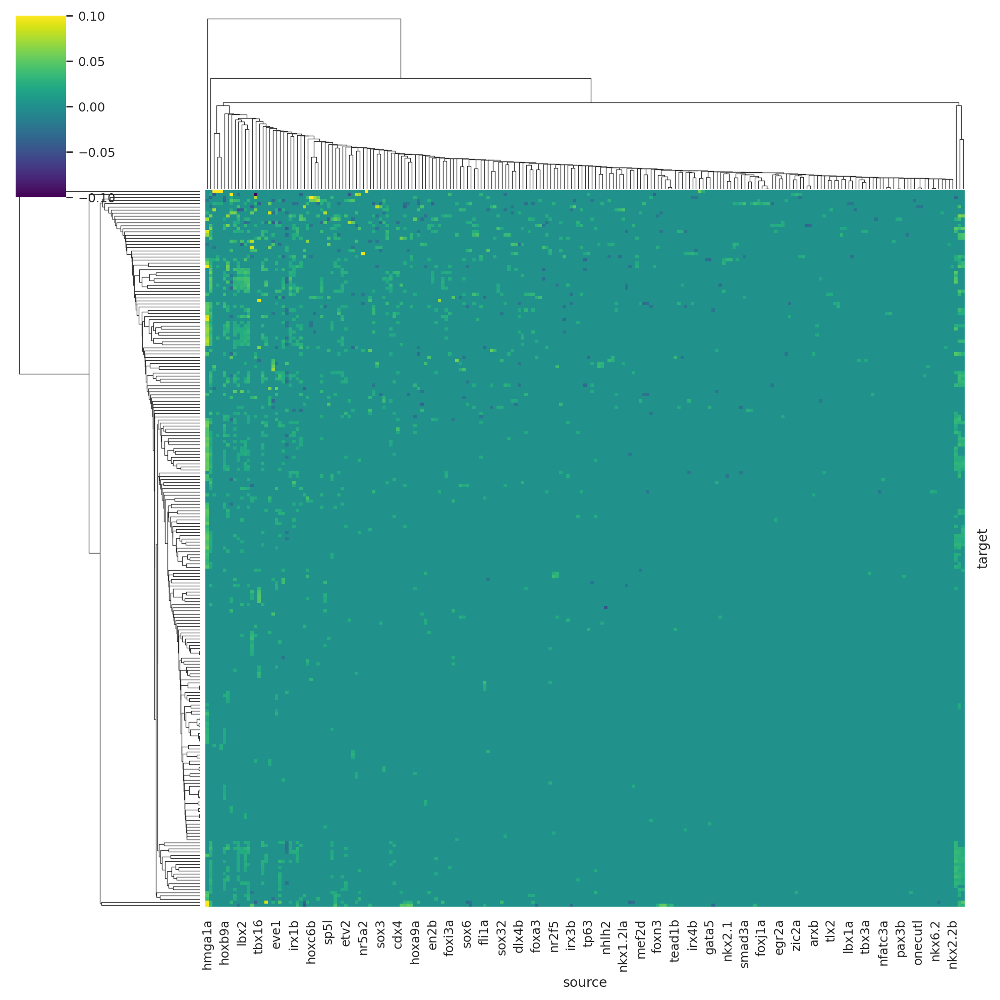

In [17]:
# Create a heatmap with hierarchical clustering
plt.figure(figsize=(12, 8))
g = sns.clustermap(df_counts, method='average', metric='euclidean', cmap='viridis', standard_scale=None,
               row_cluster=True, col_cluster=True, yticklabels=False, vmax=0.1, vmin=-0.1)

# reordered_labels = df_counts.index[g.dendrogram_row.reordered_ind].tolist()
# use_labels = ["myf5","sox2","tbxta",
#               "meox1","tbx16","hes6",
#               "hbbe1.1","hbae3","hbbe3","rps16",
#               "lrrc24","krt96"]
# use_ticks = [reordered_labels.index(label) + .5 for label in use_labels]
# g.ax_heatmap.set(yticks=use_ticks, yticklabels=use_labels)
# g.savefig(figpath + "clustered_heatmap_GRN_test.png")
# g.savefig(figpath + "clustered_heatmap_GRN_test.pdf")
plt.show()

In [38]:
# For loop to plot the GRNs over timepoints
# Choose one celltype
celltype = "PSM"

# for all the rest of the timepoints (0-30 somites)
timepoints = ["TDR126", "TDR127", "TDR128", "TDR118reseq", "TDR125reseq", "TDR124reseq"]

# Step 1. collect all sources and targets across all timepoints
all_sources = set()
all_targets = set()

for timepoint in timepoints:
    df = dict_filtered_GRNs[timepoint][celltype]
    all_sources.update(df['source'].unique())
    all_targets.update(df['target'].unique())
    
# Step 2: Recreate each df_counts DataFrame
df_counts_union = {}

for timepoint in timepoints:
    df = dict_filtered_GRNs[timepoint][celltype]
    # Pivot the original DataFrame
    df_pivot = df.pivot(index='target', columns='source', values='coef_mean').reindex(index=all_targets, columns=all_sources).fillna(0)
    df_counts_union[timepoint] = df_pivot
    
# Assuming df_counts_union is your dictionary of adjusted count matrices
timepoints = list(df_counts_union.keys())


In [35]:
df_counts_union.keys()

dict_keys(['TDR126', 'TDR127', 'TDR128', 'TDR118reseq', 'TDR125reseq', 'TDR124reseq'])

In [39]:
df_counts_union["TDR126"]

source,lhx4,sox11a,klf2a,lmx1ba,samd11,lhx6,jun,foxc1a,ebf3a,sox32,...,six1b,foxp2,foxi2,foxf2a,etv1,pax6a,tcf7l2,tbx1,foxn3,olig2
target,,,,,,,,,,,,,,,,,,,,,
sox11a,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.025552,0.0,0.0,0.00000,0.0
rplp0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0
ncor2,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0
col15a1b,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0
cirbpa,0.0,0.024127,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pcdh10b,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0
bcam,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.02409,0.0
wif1,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.00000,0.0


In [106]:
# Choose one celltype
celltype = "PSM"

# extract the celltype specific GRN at one timepoint
df_sample = dict_merged_score["TDR118reseq"][dict_merged_score["TDR118reseq"].cluster==celltype]

df_sample.sort_values("degree_centrality_all", ascending=False)

,degree_all,degree_in,degree_out,clustering_coefficient,clustering_coefficient_weighted,degree_centrality_all,degree_centrality_in,degree_centrality_out,betweenness_centrality,closeness_centrality,eigenvector_centrality,page_rank,assortative_coefficient,average_path_length,community_random_walk,module,connectivity,participation,role,cluster
meox1,94,26,68,0.045665,0.056520,0.178707,0.049430,0.129278,7736,0.049777,0.774171,0.006923,-0.147367,0.121187,4,4,6.235879,0.676730,Connector Hub,PSM
meis1b,86,16,70,0.077989,0.087777,0.163498,0.030418,0.133080,13022,0.046116,0.922707,0.003075,-0.147367,0.121187,4,0,4.534902,0.625223,Connector Hub,PSM
rxraa,61,21,40,0.130519,0.161634,0.115970,0.039924,0.076046,7808,0.045778,1.000000,0.005234,-0.147367,0.121187,4,0,2.493060,0.681760,Connector,PSM
mef2d,60,19,41,0.047925,0.055508,0.114068,0.036122,0.077947,5356,0.034146,0.362839,0.003805,-0.147367,0.121187,6,4,5.392485,0.510198,Connector Hub,PSM
meis1a,52,4,48,0.078431,0.082908,0.098859,0.007605,0.091255,3132,0.046399,0.436413,0.002108,-0.147367,0.121187,4,0,2.132735,0.675894,Connector,PSM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hand2,1,0,1,0.000000,0.000000,0.001901,0.000000,0.001901,0,30.432837,0.011654,0.001262,-0.147367,0.121187,4,2,-0.714037,0.000000,Ultra peripheral,PSM
tal1,1,0,1,0.000000,0.000000,0.001901,0.000000,0.001901,0,26.804521,0.014506,0.001262,-0.147367,0.121187,4,4,-0.511266,0.000000,Ultra peripheral,PSM
spi1b,1,0,1,0.000000,0.000000,0.001901,0.000000,0.001901,0,26.482418,0.008060,0.001262,-0.147367,0.121187,1,2,-0.714037,0.000000,Ultra peripheral,PSM
atf3,1,0,1,0.000000,0.000000,0.001901,0.000000,0.001901,0,26.040546,0.004076,0.001262,-0.147367,0.121187,4,4,-0.511266,0.000000,Ultra peripheral,PSM


In [115]:
list_top_genes = df_sample.sort_values("degree_centrality_all", ascending=False).index[0:30]
list_top_genes

Index(['meox1', 'meis1b', 'rxraa', 'mef2d', 'meis1a', 'hoxb3a', 'sox5',
       'tbx16', 'nr2f5', 'rxrab', 'hmga1a', 'foxp4', 'rarab', 'sox13', 'rarga',
       'raraa', 'sox6', 'cdx4', 'zbtb16a', 'robo1', 'gli2a', 'hoxd3a',
       'sox11a', 'tenm4', 'irx3a', 'lef1', 'myf5', 'myod1', 'hoxb6b',
       'efnb2b'],
      dtype='object')

In [114]:
# list_top_genes = ['meox1', 'meis1b', 'rxraa', 'mef2d', 'meis1a', 'hoxb3a', 'sox5',
#                    'tbx16', 'rxrab', 'hmga1a', 'foxp4', 'sox13', 
#                    'raraa', 'sox6', 'cdx4', 'zbtb16a', 'robo1', 'gli2a', 'hoxd3a',
#                    'sox11a', 'lef1', 'myf5', 'myod1', 'hoxb6b']

In [110]:
list_top_sources = df_sample.sort_values("degree_centrality_out", ascending=False).index[0:30]
list_top_sources

Index(['meis1b', 'meox1', 'meis1a', 'nr2f5', 'mef2d', 'rxraa', 'rxrab',
       'rarga', 'rarab', 'sox5', 'hmga1a', 'raraa', 'hoxb3a', 'sox13',
       'sox11a', 'irx3a', 'myf5', 'tbx16', 'sox3', 'myod1', 'foxp4', 'meis2a',
       'hoxd3a', 'nr2f1b', 'lef1', 'sox6', 'gbx1', 'etv4', 'irx1b', 'rfx4'],
      dtype='object')

In [109]:
list_top_targets = df_sample.sort_values("degree_centrality_in", ascending=False).index[0:30]
list_top_targets

Index(['zbtb16a', 'robo1', 'tenm4', 'meox1', 'qkia', 'efnb2b', 'apoc1',
       'kcnd2', 'cntfr', 'nucks1a', 'rxraa', 'dag1', 'cdx4', 'col18a1a',
       'gli2a', 'sox6', 'mef2d', 'foxp4', 'fbn2b', 'trps1', 'apoeb', 'tbx16',
       'gse1', 'cirbpa', 'fgfr2', 'hoxc3a', 'msgn1', 'cdon', 'nrp2b', 'agrn'],
      dtype='object')

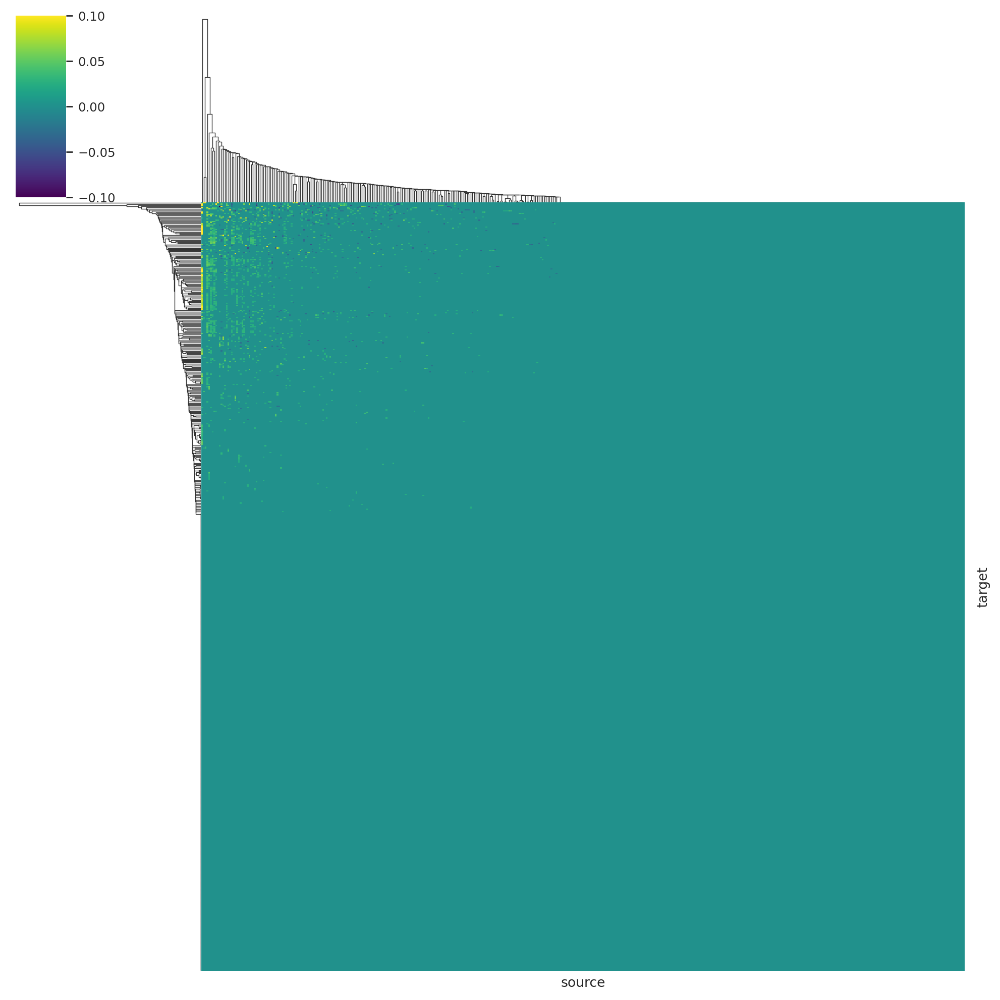

In [129]:
# first timepoint (0 somite/budstage)
df_counts = df_counts_union["TDR126"]

g1 = sns.clustermap(df_counts, method='average', metric='euclidean', cmap='viridis', standard_scale=None,
                row_cluster=True, col_cluster=True, 
                xticklabels=False, yticklabels=False, 
                figsize=(10, 10),  # Adjust the figsize to fit your data
                vmax=0.1, vmin=-0.1)

# Access the axes for annotation
heatmap_ax = g1.ax_heatmap

# Determine the size of the heatmap for proper annotation placement
heatmap_size = heatmap_ax.get_window_extent().transformed(plt.gcf().dpi_scale_trans.inverted())

plt.show()

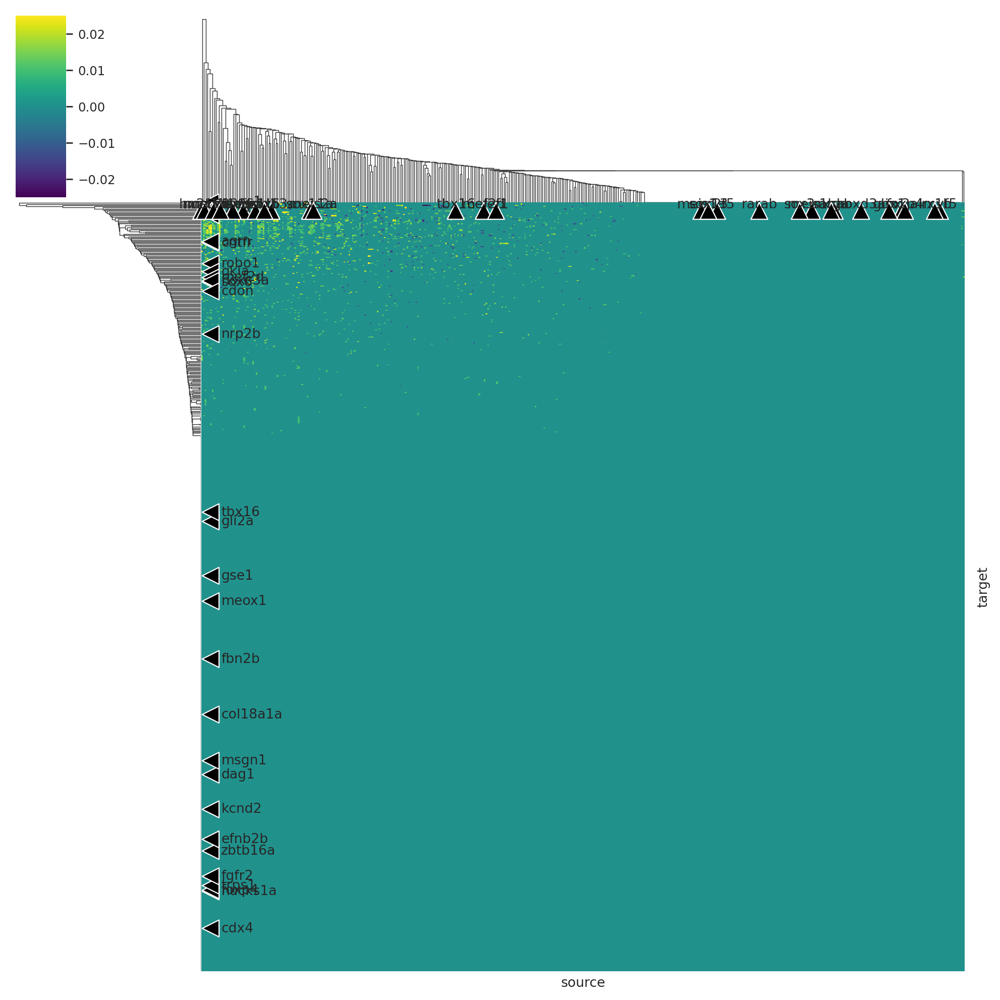

In [167]:
# Assuming df_counts is already defined and ready for plotting
g1 = sns.clustermap(df_counts, method='average', metric='euclidean', cmap='viridis',
                    standard_scale=None, row_cluster=True, col_cluster=True,
                    xticklabels=False, yticklabels=False,
                    figsize=(10, 10),  # Adjusted figure size
                    vmax=0.025, vmin=-0.025)

# Access the axes for annotation
heatmap_ax = g1.ax_heatmap

# Determine the size of the heatmap for proper annotation placement
heatmap_size = heatmap_ax.get_window_extent().transformed(plt.gcf().dpi_scale_trans.inverted())

# Define offsets based on the heatmap size
x_offset = heatmap_size.width * 0.5  # offset for x-axis annotations, adjusted for smaller size
y_offset = heatmap_size.height * 0.5  # offset for y-axis annotations, adjusted for smaller size

# Define annotations with appropriate offsets
for idx, gene in enumerate(list_top_targets):
    if gene in g1.data2d.index:  # Check if gene is in the row labels after clustering
        gene_idx = g1.data2d.index.tolist().index(gene)
        heatmap_ax.annotate(gene, xy=(0, gene_idx), xycoords='data',
                            xytext=(heatmap_size.width + x_offset, gene_idx), textcoords='data',
                            arrowprops=dict(facecolor='black', shrink=0.05, width=1),
                            ha='left', va='center')

for idx, tf in enumerate(list_top_sources):
    if tf in g1.data2d.columns:  # Check if tf is in the column labels after clustering
        tf_idx = g1.data2d.columns.tolist().index(tf)
        heatmap_ax.annotate(tf, xy=(tf_idx, 0), xycoords='data',
                            xytext=(tf_idx, -y_offset), textcoords='data',
                            arrowprops=dict(facecolor='black', shrink=0.05, width=1),
                            ha='center', va='top')

g1.savefig(figpath + f"GRN_heatmap_{celltype}_{stage}_dendrogram_gene_labels.pdf")

plt.show()

In [141]:
stages = ["0somites", "5somites", "10somites","15somites","20somites","30somites"]
stages

['0somites', '5somites', '10somites', '15somites', '20somites', '30somites']

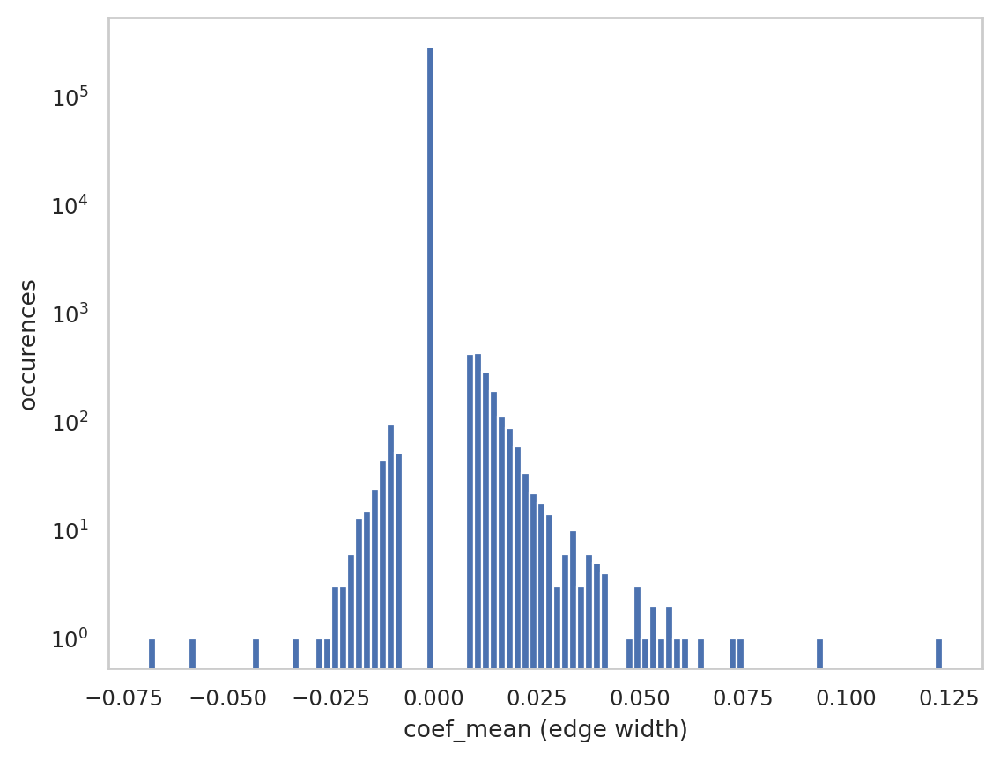

In [165]:
plt.hist(df_counts.values.flatten(), bins=100)
plt.yscale("log")
plt.xlabel("coef_mean (edge width)")
plt.ylabel("occurences")
plt.grid(False)
plt.show()

### NOTES: OK, let's generate the GRN heatmaps for all timepoints (for one celltype, PSM)

### Fine-tuning the GRN visualization (using the linkages from both the first and the last timepoints)

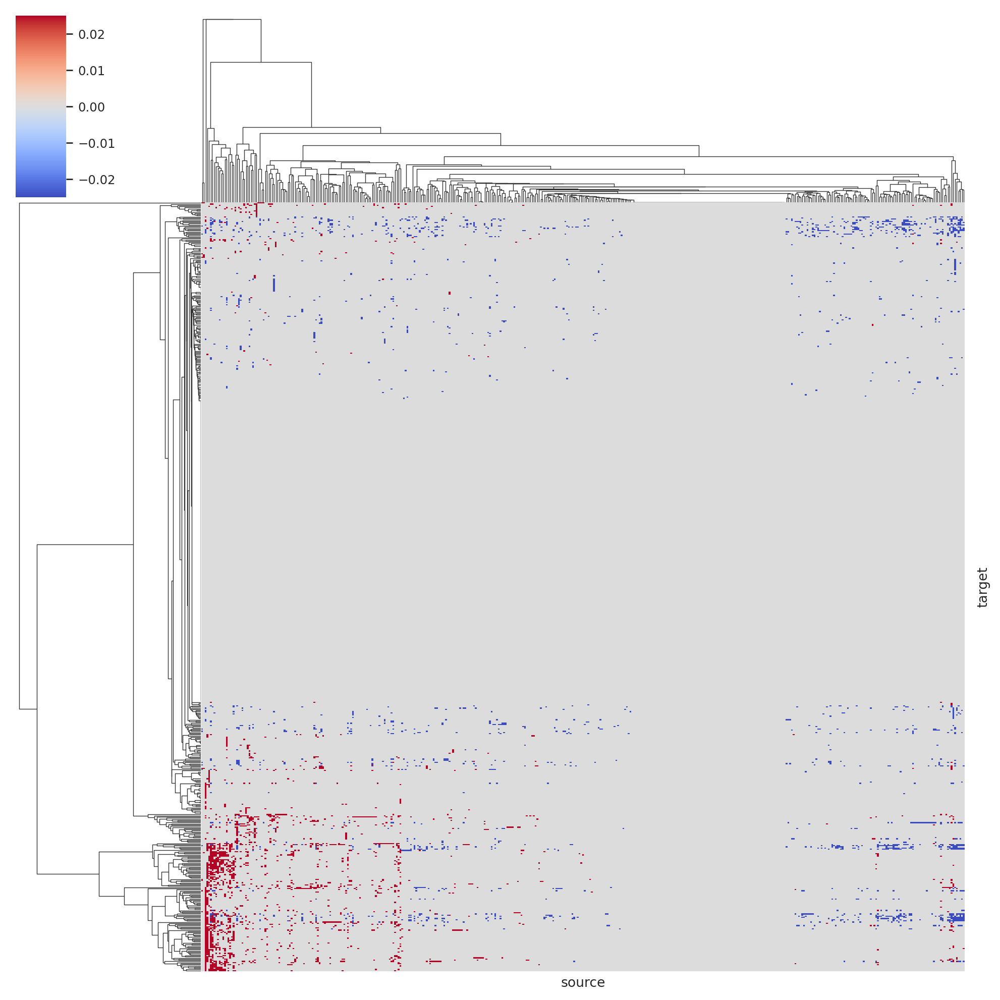

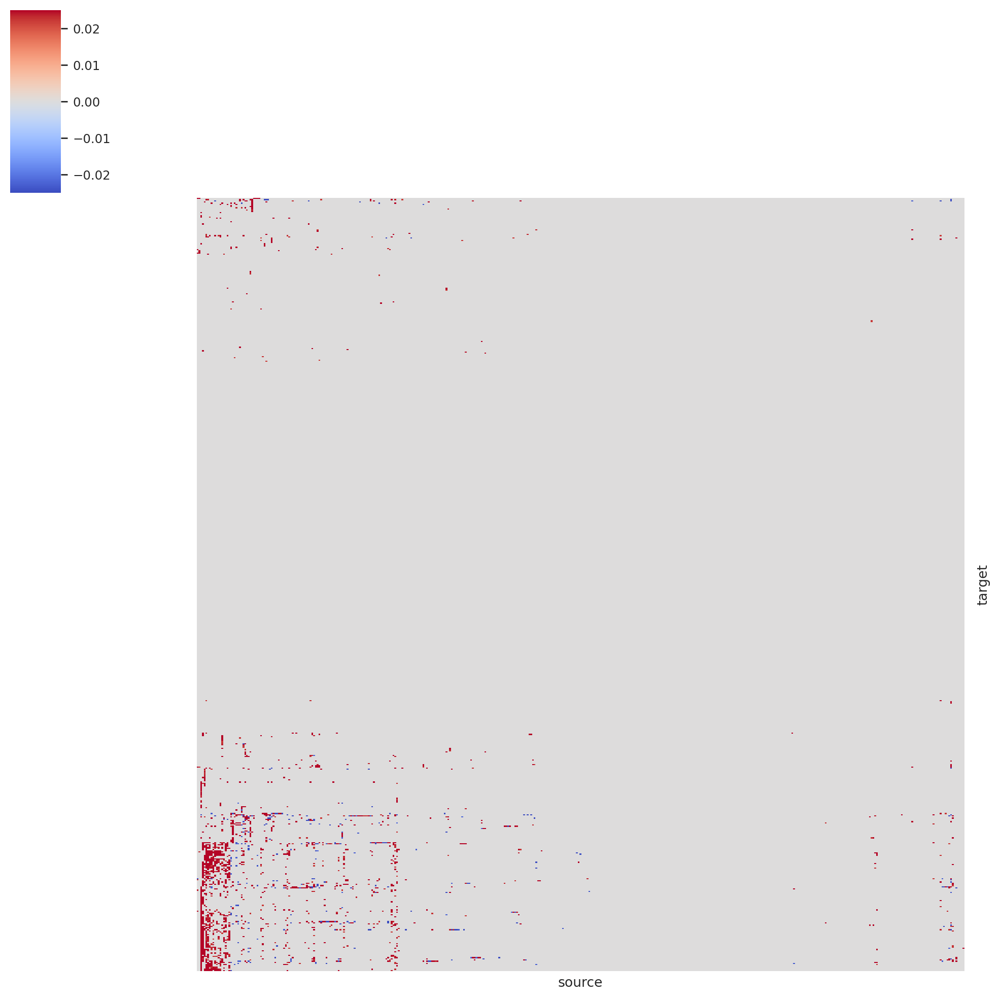

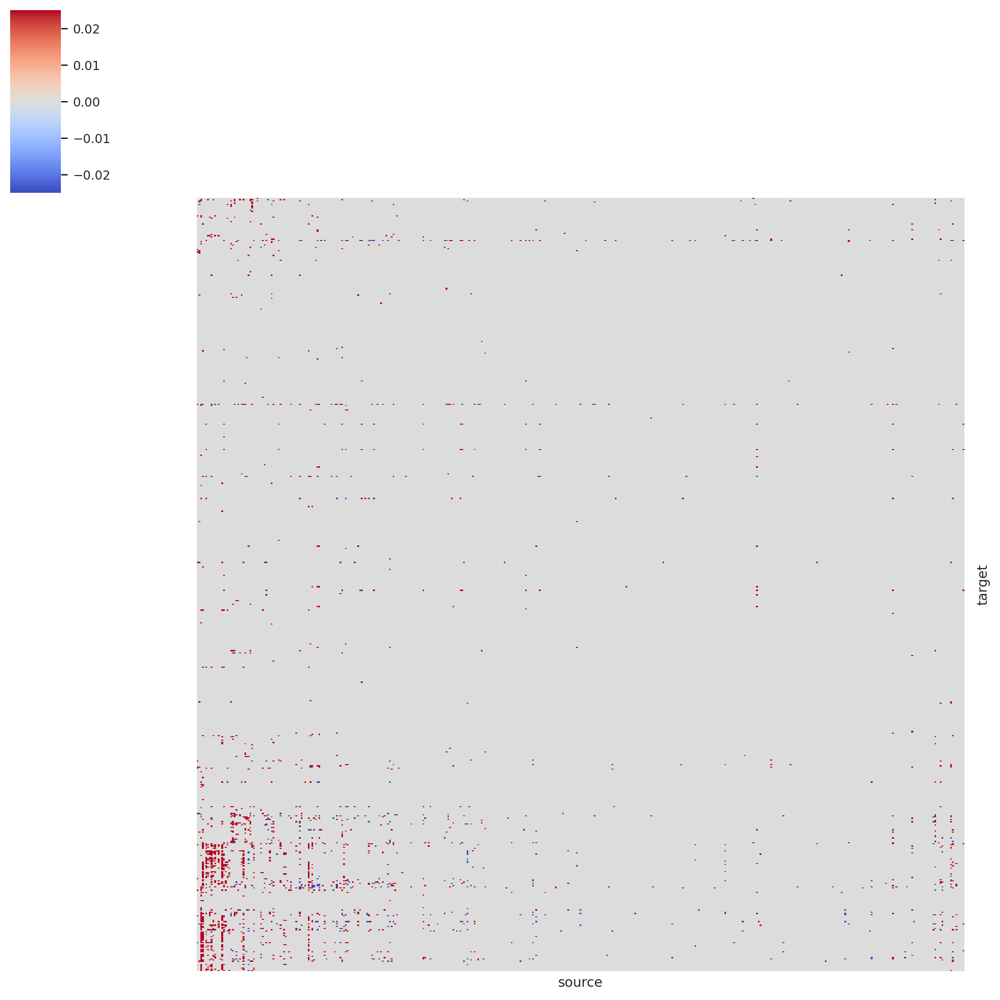

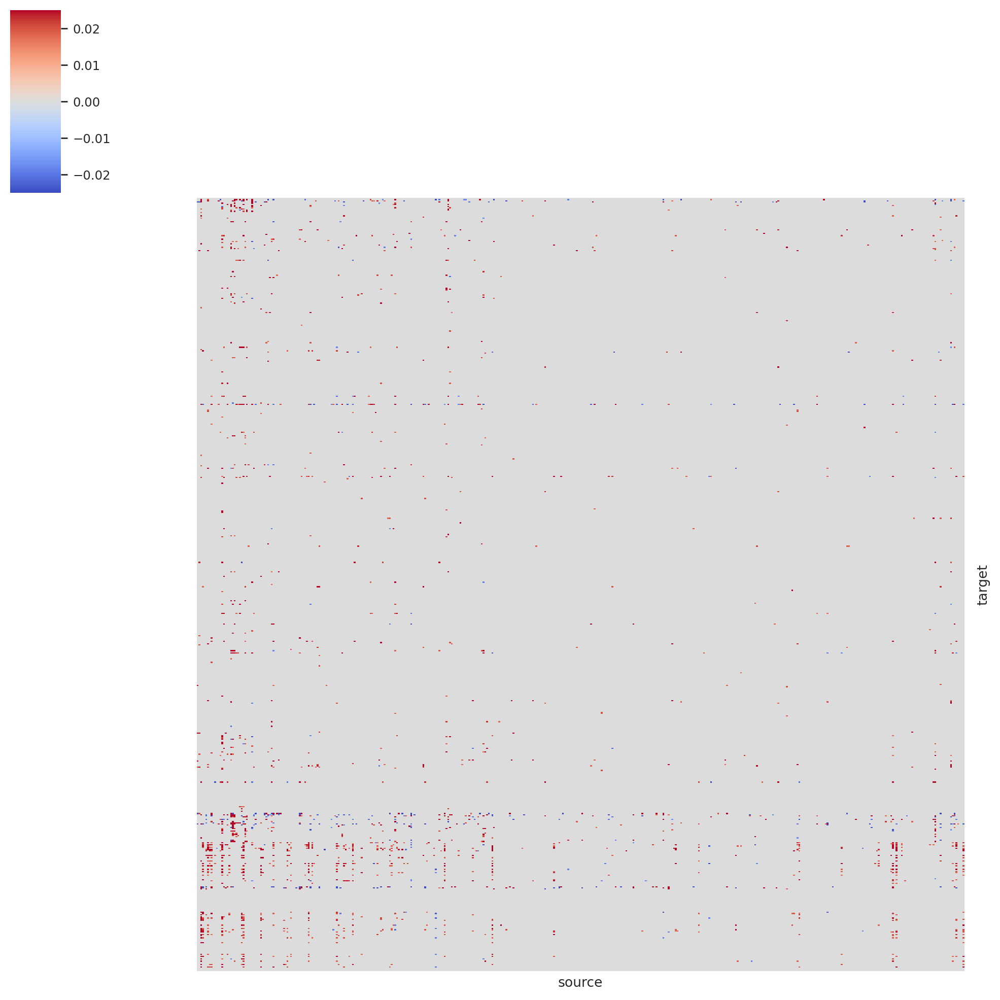

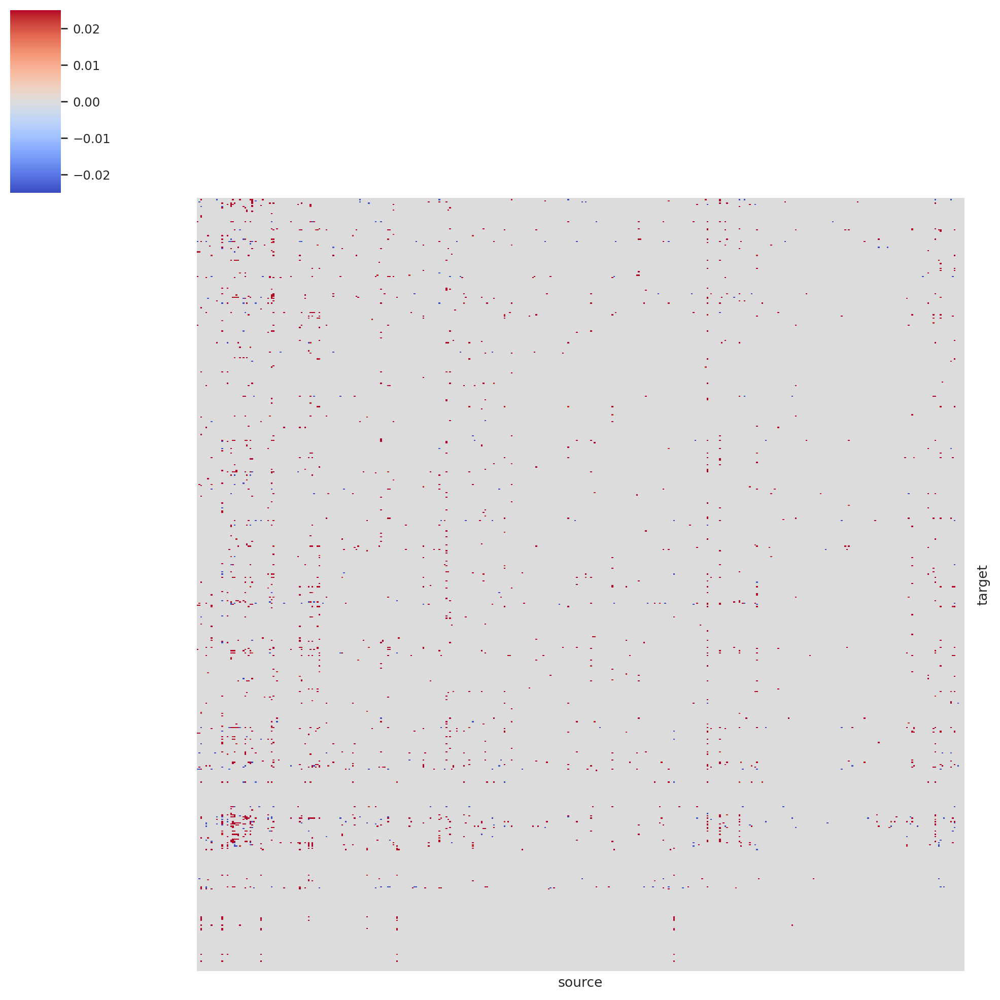

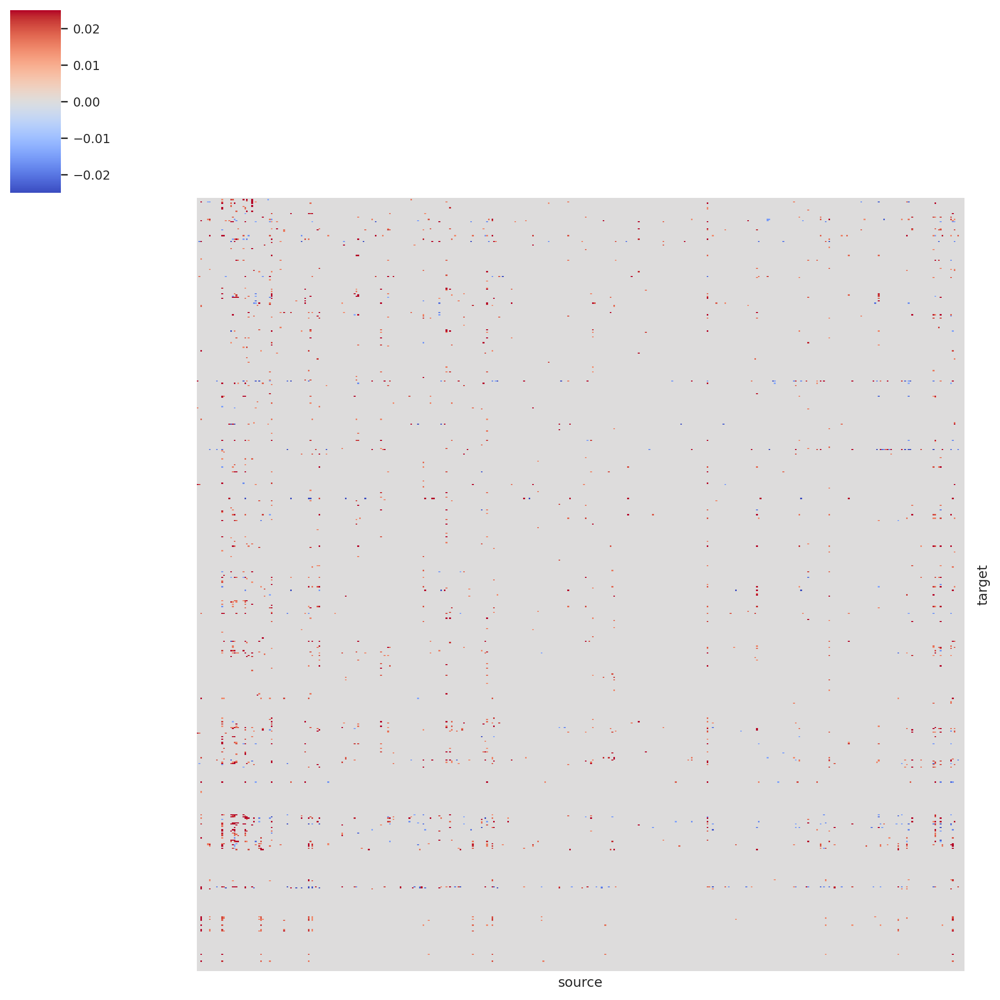

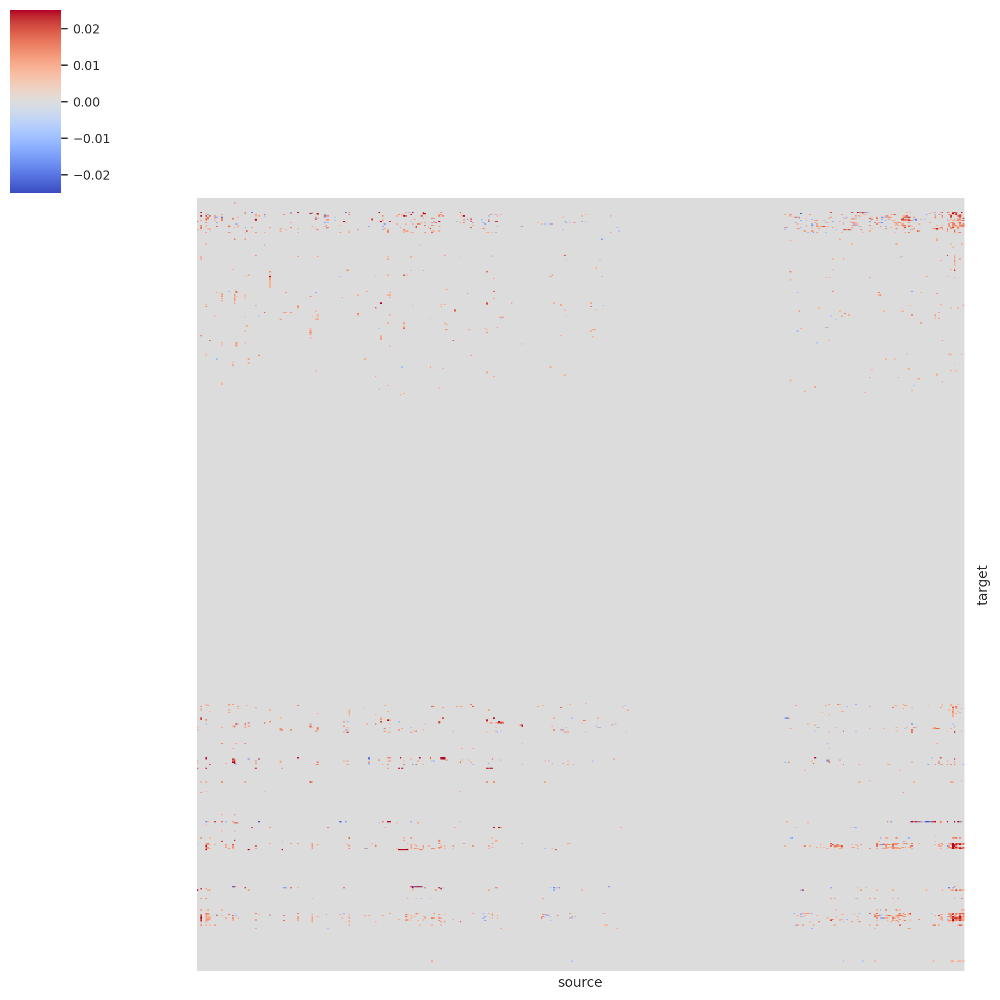

In [200]:
# define the dev stages corresponding to the timepoints list (for dataset IDs)
stages = ["0somites", "5somites", "10somites","15somites","20somites","30somites"]
stages

timepoints = ['TDR126', 'TDR127', 'TDR128', 'TDR118reseq', 'TDR125reseq', 'TDR124reseq']

# based on the histogram above, we'll define the vmax/vmin for color scale
vmax = 0.025
vmin = -0.025

# compute the linkages from the first and the last timepoints, by augmenting the "time" components
df_counts1 = df_counts_union["TDR126"]
df_counts2 = df_counts_union["TDR127"]
df_counts3 = df_counts_union["TDR128"]
df_counts4 = df_counts_union["TDR118reseq"]
df_counts5 = df_counts_union["TDR125reseq"]
df_counts6 = df_counts_union["TDR124reseq"]

# merge the two count matrices by augmenting the time
# df_counts = df_counts1*1000 + df_counts2*500 + df_counts3*100 + \
#             df_counts4*(-100) + df_counts5*(-500) + df_counts6*(-1000)
df_counts = abs(df_counts1)*1000 + abs(df_counts6)*(-1000)

g1 = sns.clustermap(df_counts, method='ward', metric='euclidean', 
                    cmap='coolwarm', standard_scale=None,
                    row_cluster=True, col_cluster=True, 
                    xticklabels=False, yticklabels=False, 
                    vmax=vmax, vmin=vmin)

# extract the row/col indices
row_linkage = g1.dendrogram_row.linkage
col_linkage = g1.dendrogram_col.linkage

# Loop over all timepoints (using the pre-computed linkages from the first timepoint)
for idx, timepoint in enumerate(timepoints):

#     # extract the GRN from the corresponding "timepoint", and "celltype"
#     df = dict_filtered_GRNs[timepoint][celltype]
    
#     # pivot the GRN into a count matrix format
#     df_counts = df.pivot(index="target", columns="source", values="coef_mean").fillna(0)
    df_counts = df_counts_union[timepoint]
    
    # plot the clustermap
    g = sns.clustermap(df_counts, method='ward', metric='euclidean', 
                       cmap='coolwarm', standard_scale=None, 
                       row_cluster=True, col_cluster=True, 
                       xticklabels=False, yticklabels=False, 
                       vmax=vmax, vmin=vmin, 
                       row_linkage=row_linkage, col_linkage=col_linkage)
    
    # hide the dendrograms
    g.ax_row_dendrogram.set_visible(False)
    g.ax_col_dendrogram.set_visible(False)
    
    # extract the dev stage
    stage=stages[idx]
    # save the plot
    g.savefig(figpath + f"GRN_heatmap_{celltype}_{stage}_coolwarm_linkages.pdf") # celltype is defined above where we computed df_counts_union
    g.savefig(figpath + f"GRN_heatmap_{celltype}_{stage}_coolwarm_linkages.png")
# # Since sns.clustermap uses its own figure by default, we adjust our approach slightly:
# plt.close(g1.fig)  # Close the first plot's figure to prevent it from showing twice

# # Display all heatmaps side by side with consistent clustering
plt.show()

### Check the GRNs between the first and the last timepoints (augmented)

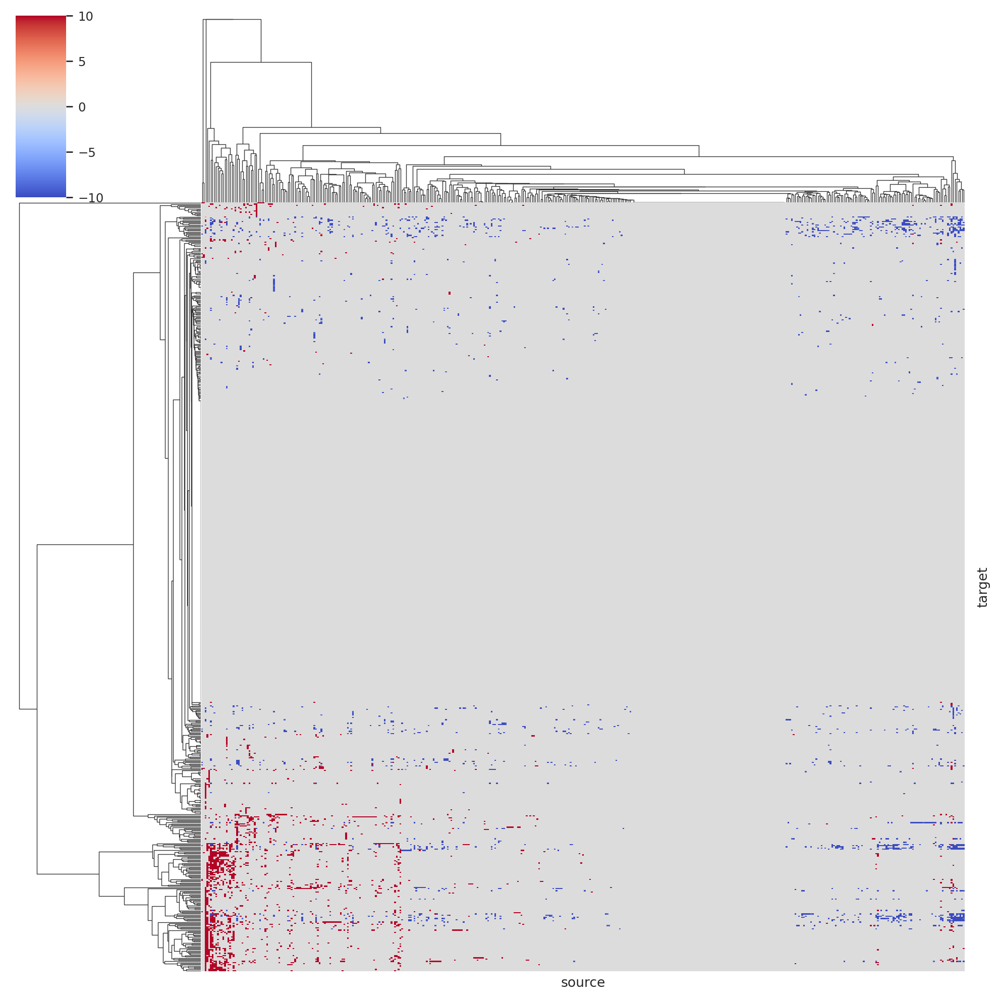

In [427]:
# compute the linkages from the first and the last timepoints, by augmenting the "time" components
df_counts1 = df_counts_union["TDR126"]
df_counts2 = df_counts_union["TDR127"]
df_counts3 = df_counts_union["TDR128"]
df_counts4 = df_counts_union["TDR118reseq"]
df_counts5 = df_counts_union["TDR125reseq"]
df_counts6 = df_counts_union["TDR124reseq"]

df_counts = abs(df_counts1)*1000 + abs(df_counts6)*(-1000)

g1 = sns.clustermap(df_counts, method='ward', metric='euclidean', 
                    cmap='coolwarm', standard_scale=None,
                    row_cluster=True, col_cluster=True, 
                    xticklabels=False, yticklabels=False, 
                    vmax=10, vmin=-10)

plt.show()

# g1.savefig(figpath + f"GRN_heatmap_PSM_0_30somites_comparison_coolwarm_linkages.pdf") # celltype is defined above where we computed df_counts_union
# g1.savefig(figpath + f"GRN_heatmap_PSM_0_30somites_comparison_coolwarm_linkages.png")

### Sectioning the left-bottom for "decreasing over time"

In [381]:
# Assuming you have determined your cluster size and its position (last N rows and M columns)
N = 100  # The number of rows in the cluster, replace with the actual number
M = 20  # The number of columns in the cluster, replace with the actual number

# The indices of the rows and columns in the original data that make up the cluster
row_indices = g1.dendrogram_row.reordered_ind[-N:]
col_indices = g1.dendrogram_col.reordered_ind[4:M]

# Extract the data for this cluster
cluster_data = df_counts.iloc[row_indices, col_indices]

# Print or process the cluster_data as needed
print(cluster_data)

# If you want to look at the labels of the rows and columns in the cluster
row_labels = df_counts.index[row_indices]
col_labels = df_counts.columns[col_indices]

print("Row Labels in the Cluster:", row_labels)
print("Column Labels in the Cluster:", col_labels)

source          ctcf       irx7      dlx3b       en2b      irx1b     hoxd9a  \
target                                                                        
rpl13a     61.656090  40.749939  37.424450  39.278877  26.728251   0.000000   
hmgn7      47.580894  36.079109  26.007948   0.000000   0.000000  23.303440   
rpl34      44.737583  41.028522  37.681831   0.000000  23.678087  32.649239   
rps9       46.996696  47.338074  46.147125  39.159912  33.541134  43.559830   
rps16      35.415565  33.325092  31.651117  28.811543  29.394426  30.362173   
h3f3b.1     0.000000  31.275105  30.074162  30.160881  30.930714  25.949724   
rps7        0.000000  31.186552   0.000000  34.741188  26.733854   0.000000   
rpl19      43.402882  32.334435  37.432720  25.120150  27.015940   0.000000   
rack1      37.337021  28.469030  26.254421  33.964455  28.249706   0.000000   
rpl6        0.000000  25.903444  33.200405  29.393696  21.968636  31.207125   
rps4x      27.314821  33.605076  31.553249  23.35450

In [354]:
col_names = col_labels
row_names = row_labels

# subset the GRN for the portion that is upregulated in Muscle compared to NMPs
df_counts = df_counts_union["TDR126"]

df_counts_0somites_upreg = df_counts.loc[row_names, col_names]
df_counts_0somites_upreg

source,ctcf,irx7,dlx3b,en2b,irx1b,hoxd9a,rx3,noto,gbx2,eve1,meox1,xbp1,six3b,myf5,nkx2.7,rarga
target,,,,,,,,,,,,,,,,
anp32b,0.031370,0.046111,0.000000,0.045112,0.000000,0.000000,0.000000,0.030847,0.023338,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ncl,0.000000,0.039855,0.022124,0.040661,0.000000,0.022226,0.000000,0.000000,0.000000,0.000000,0.030580,0.000000,0.029772,0.000000,0.036139,0.000000
ran,0.050877,0.000000,0.000000,0.030298,0.026144,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.037625,0.000000,0.036617,0.000000
cirbpb,0.000000,0.036486,0.043237,0.032215,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.039188,0.038777,0.000000,0.000000,0.000000
npm1a,0.041407,0.050096,0.000000,0.029372,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.022979,0.025863,0.000000,0.000000,0.000000,0.000000
cfl1,0.043361,0.000000,0.039905,0.000000,0.000000,0.000000,0.026548,0.038666,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
eef1a1l1,0.000000,0.032876,0.000000,0.026449,0.000000,0.022311,0.000000,0.000000,0.024570,0.000000,0.000000,0.027885,0.027550,0.000000,0.033711,0.000000
rps18,0.000000,0.030182,0.000000,0.000000,0.000000,0.000000,0.000000,0.025329,0.000000,0.024287,0.000000,0.041196,0.022042,0.000000,0.029481,0.000000
rpl10a,0.000000,0.024723,0.000000,0.000000,0.000000,0.024884,0.000000,0.000000,0.000000,0.000000,0.022066,0.000000,0.000000,0.000000,0.024480,0.000000


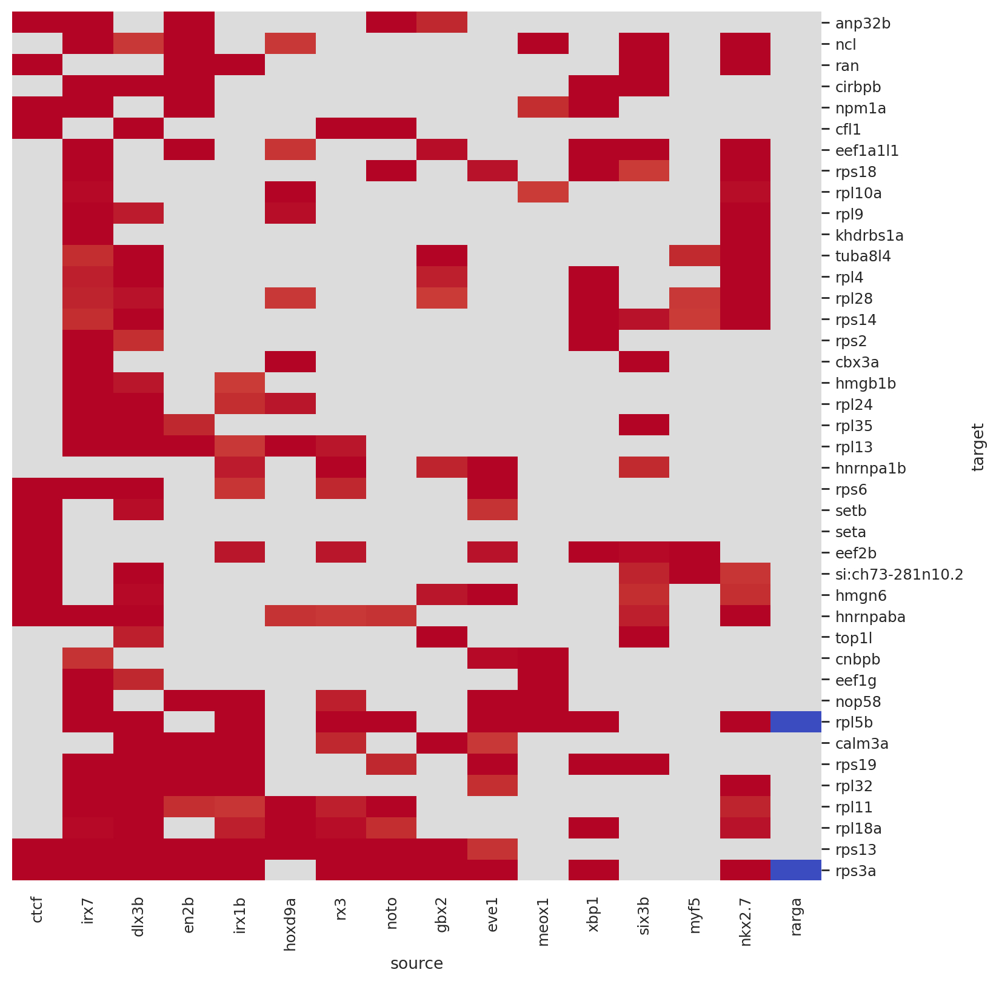

In [356]:
vmax = 0.025
vmin = -0.025

# plot the clustermap
g = sns.clustermap(df_counts_0somites_upreg, method='ward', metric='euclidean', 
                   cmap='coolwarm', standard_scale=None, 
                   row_cluster=False, col_cluster=False, 
                   xticklabels=True, yticklabels=True, 
                   vmax=vmax, vmin=vmin)

# hide the dendrograms
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)
# hide the colorbar
g.cax.set_visible(False)

celltype = "PSM"
stage = "0somites"

g.savefig(figpath + f"subGRN_heatmap_{celltype}_{stage}.pdf") # celltype is defined above where we computed df_counts_union
g.savefig(figpath + f"subGRN_heatmap_{celltype}_{stage}.png")

plt.show()

### Sectioning the right-bottom for "increasing over time"

In [428]:
# Assuming you have determined your cluster size and its position (last N rows and M columns)
N = 110  # The number of rows in the cluster, replace with the actual number
M = 15  # The number of columns in the cluster, replace with the actual number

# The indices of the rows and columns in the original data that make up the cluster
row_indices = g1.dendrogram_row.reordered_ind[-N:-105]
col_indices = g1.dendrogram_col.reordered_ind[-M:]

# Extract the data for this cluster
cluster_data = df_counts.iloc[row_indices, col_indices]

# Print or process the cluster_data as needed
print(cluster_data)

# If you want to look at the labels of the rows and columns in the cluster
row_labels = df_counts.index[row_indices]
col_labels = df_counts.columns[col_indices]

print("Row Labels in the Cluster:", row_labels)
print("Column Labels in the Cluster:", col_labels)

source       egr2a     meis2a       en2a  dmrta2  nr2f1a      irx4b  \
target                                                                
tmsb4x    0.000000 -11.570354  -9.588518     0.0     0.0   0.000000   
cirbpa  -12.485060   0.000000 -12.611969     0.0     0.0   0.000000   
serbp1a -10.062303 -10.973320   0.000000     0.0     0.0 -17.712725   
hspa8     0.000000   0.000000   0.000000     0.0     0.0   0.000000   
hmga1a    0.000000  -9.009299   0.000000     0.0     0.0 -10.916355   

source       sox1a      msx1b     sox21a     nr2f1b      sox1b    phox2bb  \
target                                                                      
tmsb4x   11.165008 -13.436086 -31.774248   0.000000 -21.626408 -20.171162   
cirbpa    0.000000 -14.659039 -28.580292 -23.534548 -22.716724 -13.515993   
serbp1a -12.184000   0.000000 -27.181572 -23.736223 -14.163760   0.000000   
hspa8   -14.656431 -12.696145 -25.036177 -15.521972 -23.911276 -12.757381   
hmga1a    0.000000 -13.155402 -25.961567

In [424]:
col_names = col_labels
row_names = row_labels

# subset the GRN for the portion that is upregulated in Muscle compared to NMPs
df_counts = df_counts_union["TDR124reseq"]

df_counts_0somites_downreg = df_counts.loc[row_names, col_names]
df_counts_0somites_downreg

source,egr2a,meis2a,en2a,dmrta2,nr2f1a,irx4b,sox1a,msx1b,sox21a,nr2f1b,sox1b,phox2bb,hoxa2b,hoxb5b,dlx4b
target,,,,,,,,,,,,,,,
tmsb4x,0.000000,0.011570,0.009589,0.0,0.0,0.000000,0.010826,0.013436,0.031774,0.000000,0.021626,0.020171,0.021274,0.012055,0.018513
cirbpa,0.012485,0.000000,0.012612,0.0,0.0,0.000000,0.000000,0.014659,0.028580,0.023535,0.022717,0.013516,0.026559,0.010971,0.015092
serbp1a,0.010062,0.010973,0.000000,0.0,0.0,-0.017713,0.012184,0.000000,0.027182,0.023736,0.014164,0.000000,0.000000,0.000000,0.000000
hspa8,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.014656,0.012696,0.025036,0.015522,0.023911,0.012757,0.021321,0.013933,0.018718
hmga1a,0.000000,0.009009,0.000000,0.0,0.0,-0.010916,0.000000,0.013155,0.025962,0.018791,0.014075,0.013411,0.024588,0.021398,0.014760


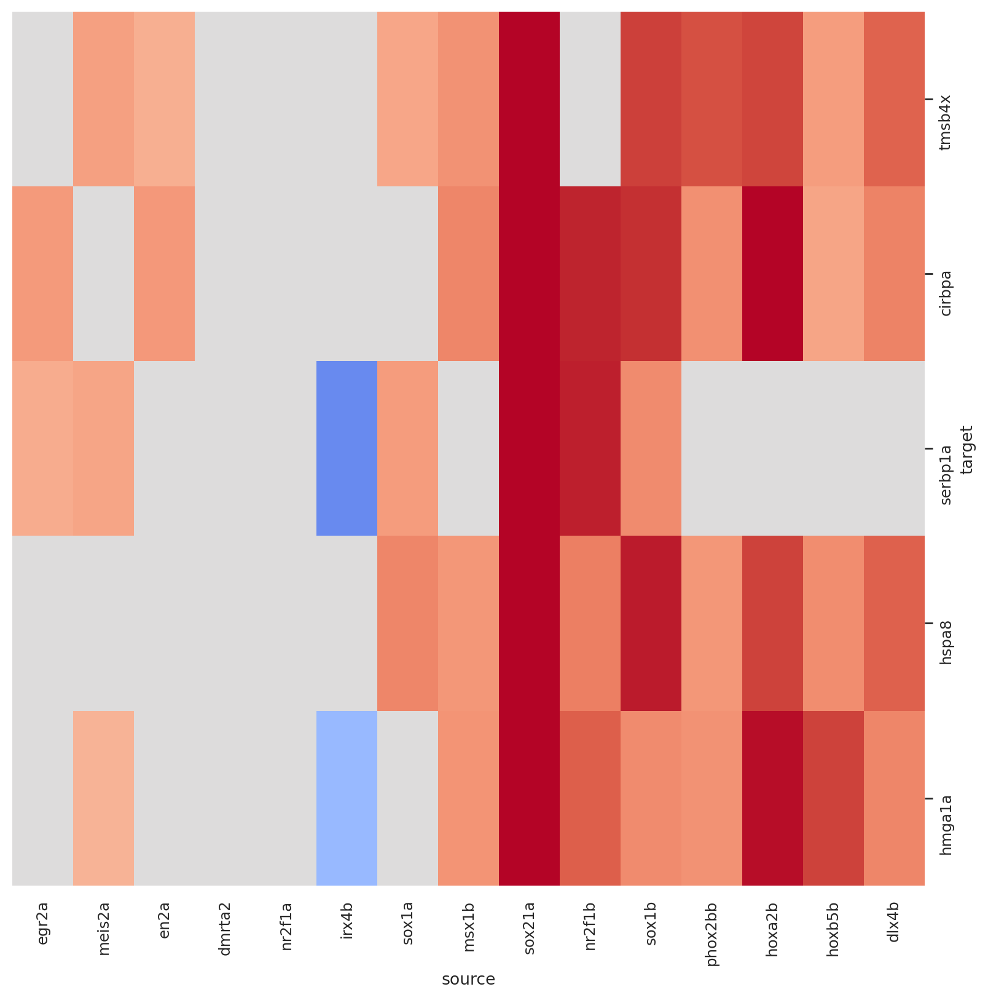

In [426]:
vmax = 0.025
vmin = -0.025

# plot the clustermap
g = sns.clustermap(df_counts_0somites_downreg, method='ward', metric='euclidean', 
                   cmap='coolwarm', standard_scale=None, 
                   row_cluster=False, col_cluster=False, 
                   xticklabels=True, yticklabels=True, 
                   vmax=vmax, vmin=vmin)

# hide the dendrograms
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)
# hide the colorbar
g.cax.set_visible(False)

celltype = "PSM"
stage = "0somites"

g.savefig(figpath + f"subGRN_heatmap_{celltype}_{stage}_downreg.pdf") # celltype is defined above where we computed df_counts_union
g.savefig(figpath + f"subGRN_heatmap_{celltype}_{stage}_downreg.png")

plt.show()

In [234]:
# get the genes 
zeros = (df_counts==0).all(axis=1)
positives = (df_counts >= 0).all(axis=1)
negatives = (df_counts <= 0).all(axis=1)
mixed = ~(positives | negatives)

# Rows with only zero numbers
rows_with_zeros_only = df_counts[zeros]

# Rows with only positive numbers
rows_with_positives_only = df_counts[positives]

# Rows with only negative numbers
rows_with_negatives_only = df_counts[negatives]

# Rows with both positive and negative numbers
rows_with_mixed_signs = df_counts[mixed]

In [235]:
rows_with_zeros_only

source,lhx4,sox11a,klf2a,lmx1ba,samd11,lhx6,jun,foxc1a,ebf3a,sox32,...,six1b,foxp2,foxi2,foxf2a,etv1,pax6a,tcf7l2,tbx1,foxn3,olig2
target,,,,,,,,,,,,,,,,,,,,,
rplp0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ncor2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
col15a1b,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tjp2b,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
morc3b,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
stk17al,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vash2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
pcdh10b,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [241]:
np.sum(np.sum(rows_with_zeros_only))

0.0

### NOTES:
- These genes are the ones that are inactive in both the first and the last timepoints, and are transiently activated in the middle.


In [238]:
rows_with_positives_only = rows_with_positives_only[~rows_with_positives_only.index.isin(rows_with_zeros_only.index)]
rows_with_positives_only

source,lhx4,sox11a,klf2a,lmx1ba,samd11,lhx6,jun,foxc1a,ebf3a,sox32,...,six1b,foxp2,foxi2,foxf2a,etv1,pax6a,tcf7l2,tbx1,foxn3,olig2
target,,,,,,,,,,,,,,,,,,,,,
eif4a1a,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31.656786,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
pdap1a,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
rpl15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
pabpn1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41.850586,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
hmgn7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
rps2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
itga5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
rsl1d1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [214]:
rows_with_negatives_only

source,lhx4,sox11a,klf2a,lmx1ba,samd11,lhx6,jun,foxc1a,ebf3a,sox32,...,six1b,foxp2,foxi2,foxf2a,etv1,pax6a,tcf7l2,tbx1,foxn3,olig2
target,,,,,,,,,,,,,,,,,,,,,
rplp0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ncor2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
col15a1b,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tjp2b,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
si:ch73-21g5.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zgc:158328,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tcf7l2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
pcdh10b,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
rows_with_negatives_only

In [215]:
rows_with_mixed_signs

source,lhx4,sox11a,klf2a,lmx1ba,samd11,lhx6,jun,foxc1a,ebf3a,sox32,...,six1b,foxp2,foxi2,foxf2a,etv1,pax6a,tcf7l2,tbx1,foxn3,olig2
target,,,,,,,,,,,,,,,,,,,,,
sox11a,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.00000,-8.909606,0.000000,25.551907,0.0,0.0,0.000000,0.000000
cirbpa,0.0,11.172564,0.0,0.0,0.0,0.0,-8.917371,0.000000,0.0,0.000000,...,0.0,0.0,0.00000,0.000000,0.000000,-11.031951,0.0,0.0,0.000000,-8.852820
cntfr,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.00000,0.000000,0.000000,6.710561,0.0,0.0,0.000000,0.000000
greb1l,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
apoc1,0.0,47.060707,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,48.252209,...,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,-69.123177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cxcl12a,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.00000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000
hsp90ab1,0.0,-12.633737,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,-8.82671,-10.833946,-8.750056,0.000000,0.0,0.0,0.000000,0.000000
rxraa,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.00000,0.000000,-22.899309,0.000000,0.0,0.0,0.000000,0.000000


In [216]:
rows_with_mixed_signs.index

Index(['sox11a', 'cirbpa', 'cntfr', 'greb1l', 'apoc1', 'histh1l', 'hmgb2a',
       'cdh6', 'tenm4', 'tmsb4x', 'eif5a2', 'hspa8', 'cdh11', 'fgfrl1a',
       'pcna', 'marcksl1a', 'nop56', 'pa2g4a', 'pax3a', 'mdkb', 'serpinh1b',
       'actb2', 'hoxc3a', 'serbp1a', 'pcdh19', 'hmgn2', 'ptmab', 'cxcl12b',
       'raraa', 'efemp2b', 'nrp2b', 'stmn1a', 'rrm2', 'aspm', 'dkc1',
       'kcnma1a', 'pabpc1a', 'actb1', 'arid3c', 'qkia', 'zgc:174855', 'nusap1',
       'sulf1', 'actc1a', 'mki67', 'prickle1b', 'nop58', 'id3', 'apoeb',
       'krt18a.1', 'calm1a', 'npm1a', 'ncl', 'ptmaa', 'hmga1a', 'mllt3',
       'hspe1', 'cxcl12a', 'hsp90ab1', 'rxraa', 'prmt1', 'bcam'],
      dtype='object', name='target')

In [106]:
# # Choose one celltype
# celltype = "PSM"

# # extract the celltype specific GRN at one timepoint
# df_sample = dict_merged_score["TDR118reseq"][dict_merged_score["TDR118reseq"].cluster==celltype]

# df_sample.sort_values("degree_centrality_all", ascending=False)

,degree_all,degree_in,degree_out,clustering_coefficient,clustering_coefficient_weighted,degree_centrality_all,degree_centrality_in,degree_centrality_out,betweenness_centrality,closeness_centrality,eigenvector_centrality,page_rank,assortative_coefficient,average_path_length,community_random_walk,module,connectivity,participation,role,cluster
meox1,94,26,68,0.045665,0.056520,0.178707,0.049430,0.129278,7736,0.049777,0.774171,0.006923,-0.147367,0.121187,4,4,6.235879,0.676730,Connector Hub,PSM
meis1b,86,16,70,0.077989,0.087777,0.163498,0.030418,0.133080,13022,0.046116,0.922707,0.003075,-0.147367,0.121187,4,0,4.534902,0.625223,Connector Hub,PSM
rxraa,61,21,40,0.130519,0.161634,0.115970,0.039924,0.076046,7808,0.045778,1.000000,0.005234,-0.147367,0.121187,4,0,2.493060,0.681760,Connector,PSM
mef2d,60,19,41,0.047925,0.055508,0.114068,0.036122,0.077947,5356,0.034146,0.362839,0.003805,-0.147367,0.121187,6,4,5.392485,0.510198,Connector Hub,PSM
meis1a,52,4,48,0.078431,0.082908,0.098859,0.007605,0.091255,3132,0.046399,0.436413,0.002108,-0.147367,0.121187,4,0,2.132735,0.675894,Connector,PSM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hand2,1,0,1,0.000000,0.000000,0.001901,0.000000,0.001901,0,30.432837,0.011654,0.001262,-0.147367,0.121187,4,2,-0.714037,0.000000,Ultra peripheral,PSM
tal1,1,0,1,0.000000,0.000000,0.001901,0.000000,0.001901,0,26.804521,0.014506,0.001262,-0.147367,0.121187,4,4,-0.511266,0.000000,Ultra peripheral,PSM
spi1b,1,0,1,0.000000,0.000000,0.001901,0.000000,0.001901,0,26.482418,0.008060,0.001262,-0.147367,0.121187,1,2,-0.714037,0.000000,Ultra peripheral,PSM
atf3,1,0,1,0.000000,0.000000,0.001901,0.000000,0.001901,0,26.040546,0.004076,0.001262,-0.147367,0.121187,4,4,-0.511266,0.000000,Ultra peripheral,PSM


In [308]:
dict_test_PSM["TDR126"]["list_top_genes"] = list_top_genes

In [309]:
# Choose one celltype
celltype = "PSM"

dict_test_PSM = {}

for timepoint in dict_merged_score.keys():
    # extract the celltype specific GRN for each timepoint
    df_sample = dict_merged_score[timepoint][dict_merged_score[timepoint].cluster==celltype]
    
    df_sample.sort_values("degree_centrality_all", ascending=False)
    
    list_top_genes = df_sample.sort_values("degree_centrality_all", ascending=False).index[0:30]
    list_top_sources = df_sample.sort_values("degree_centrality_out", ascending=False).index[0:30]
    list_top_targets = df_sample.sort_values("degree_centrality_in", ascending=False).index[0:30]
    
    # save the top 30 genes into a dict
    dict_test_PSM[timepoint] = {}
    dict_test_PSM[timepoint]["list_top_genes"] = list_top_genes
    dict_test_PSM[timepoint]["list_top_sources"] = list_top_sources
    dict_test_PSM[timepoint]["list_top_targets"] = list_top_targets
    


In [310]:
dict_test_PSM

{'TDR126': {'list_top_genes': Index(['hmga1a', 'irx7', 'cirbpa', 'rarga', 'arxb', 'rxrab', 'rarab', 'sox19a',
         'hoxb3a', 'hoxc3a', 'raraa', 'rpl13a', 'rxraa', 'hsf4', 'tbx16', 'sox3',
         'actb2', 'eef1a1l1', 'hoxd3a', 'irx3a', 'hoxb9a', 'barhl1a', 'vox',
         'zbtb16a', 'sox5', 'sox13', 'rpsa', 'cdx4', 'meis1b', 'ved'],
        dtype='object'),
  'list_top_sources': Index(['irx7', 'arxb', 'rxrab', 'sox19a', 'rarga', 'hsf4', 'sox3', 'rarab',
         'hoxb9a', 'irx3a', 'barhl1a', 'hmga1a', 'vox', 'raraa', 'rxraa',
         'nkx1.2la', 'ved', 'phox2bb', 'gsx1', 'msx1b', 'etv4', 'nr2f1b',
         'hoxd3a', 'vsx1', 'alx4a', 'sp5l', 'pnx', 'sox5', 'meis1b', 'tbx16'],
        dtype='object'),
  'list_top_targets': Index(['cirbpa', 'rpl13a', 'hoxc3a', 'actb2', 'eef1a1l1', 'hmga1a', 'zbtb16a',
         'rpsa', 'tenm4', 'col11a1a', 'rps20', 'rplp0', 'nucks1a', 'serbp1a',
         'hsp90ab1', 'apoc1', 'gdf11', 'rps12', 'rplp1', 'si:ch73-281n10.2',
         'rps2', 'ptmab', 'rp

In [115]:
list_top_genes = df_sample.sort_values("degree_centrality_all", ascending=False).index[0:30]
list_top_genes

Index(['meox1', 'meis1b', 'rxraa', 'mef2d', 'meis1a', 'hoxb3a', 'sox5',
       'tbx16', 'nr2f5', 'rxrab', 'hmga1a', 'foxp4', 'rarab', 'sox13', 'rarga',
       'raraa', 'sox6', 'cdx4', 'zbtb16a', 'robo1', 'gli2a', 'hoxd3a',
       'sox11a', 'tenm4', 'irx3a', 'lef1', 'myf5', 'myod1', 'hoxb6b',
       'efnb2b'],
      dtype='object')

In [114]:
# list_top_genes = ['meox1', 'meis1b', 'rxraa', 'mef2d', 'meis1a', 'hoxb3a', 'sox5',
#                    'tbx16', 'rxrab', 'hmga1a', 'foxp4', 'sox13', 
#                    'raraa', 'sox6', 'cdx4', 'zbtb16a', 'robo1', 'gli2a', 'hoxd3a',
#                    'sox11a', 'lef1', 'myf5', 'myod1', 'hoxb6b']

In [110]:
list_top_sources = df_sample.sort_values("degree_centrality_out", ascending=False).index[0:30]
list_top_sources

Index(['meis1b', 'meox1', 'meis1a', 'nr2f5', 'mef2d', 'rxraa', 'rxrab',
       'rarga', 'rarab', 'sox5', 'hmga1a', 'raraa', 'hoxb3a', 'sox13',
       'sox11a', 'irx3a', 'myf5', 'tbx16', 'sox3', 'myod1', 'foxp4', 'meis2a',
       'hoxd3a', 'nr2f1b', 'lef1', 'sox6', 'gbx1', 'etv4', 'irx1b', 'rfx4'],
      dtype='object')

In [109]:
list_top_targets = df_sample.sort_values("degree_centrality_in", ascending=False).index[0:30]
list_top_targets

Index(['zbtb16a', 'robo1', 'tenm4', 'meox1', 'qkia', 'efnb2b', 'apoc1',
       'kcnd2', 'cntfr', 'nucks1a', 'rxraa', 'dag1', 'cdx4', 'col18a1a',
       'gli2a', 'sox6', 'mef2d', 'foxp4', 'fbn2b', 'trps1', 'apoeb', 'tbx16',
       'gse1', 'cirbpa', 'fgfr2', 'hoxc3a', 'msgn1', 'cdon', 'nrp2b', 'agrn'],
      dtype='object')

## Extract the subgraphs - genes/TFs whose role/connections vary the most over time

- Let's cherry-pick a couple of genes to show the example of time-dependence of GRN architectures.



In [278]:
df_counts_union["TDR126"].loc["meox1",:][df_counts_union["TDR126"].loc["meox1",:]!=0]

source
meis1a    0.029791
Name: meox1, dtype: float32

In [302]:
# pick a gene (target)
goi = "meox1"

# extract the subgraph from each GRN (time), then generate the network visualization
for timepoint in df_counts_union.keys():
    df = df_counts_union[timepoint]
    df_goi = df.loc[goi,:]
    df_goi_filtered = df_goi[df_goi!=0]
    
    print(timepoint)
    print(df_goi_filtered)

TDR126
source
meis1a    0.029791
Name: meox1, dtype: float32
TDR127
source
hoxc6b    0.026575
pax7b     0.025847
meis1a    0.046156
hmga1a    0.035959
Name: meox1, dtype: float32
TDR128
source
msx1b    -0.019264
sox5      0.018303
hoxc6b    0.017825
tbx18     0.031300
raraa     0.018149
hoxb9a    0.028579
hoxb3a    0.017939
meis1a    0.022538
tbx16    -0.025569
hey1      0.029763
Name: meox1, dtype: float32
TDR118reseq
source
tfap2b     0.038306
tfap2a    -0.032740
nkx2.2a   -0.029319
irx3a     -0.022607
tbx20     -0.028025
tbx2a      0.037321
rxrab      0.059451
rarga     -0.094053
tbx18      0.066207
tbx4      -0.064452
raraa      0.066412
rarab      0.055256
tbx3a      0.033078
hmga2     -0.082957
nr2e1     -0.038571
elk3       0.041359
irx7      -0.089679
nr2f5      0.070179
hnf4g     -0.050071
etv4       0.106013
tead1b    -0.039481
tbx16     -0.105323
nkx2.7    -0.023760
hmga1a     0.089542
rxraa      0.034448
foxn3     -0.041827
Name: meox1, dtype: float32
TDR125reseq
source
ebf

## Evolution of GRNs along the celltypes

- there are several approaches to this. We can either pick one timepoint, check the GRN evolution along the NMP trajectories, 
- or, we can see how this works over certain "modules" that we identified above (temporal dynamics)



In [245]:
dict_filtered_GRNs["TDR118reseq"].keys()

dict_keys(['Adaxial_Cells', 'Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites', 'unassigned'])

In [272]:
# For loop to plot the GRNs over celltypes (dev trajectories)
# Choose one timepoint
timepoint = "TDR128" # 10-somites
# timepoints = ["TDR126", "TDR127", "TDR128", "TDR118reseq", "TDR125reseq", "TDR124reseq"]

# for all the rest of the timepoints (0-30 somites)
mesoderm_lineages = ["NMPs","PSM","Somites","Muscle"]

# Step 1. collect all sources and targets across all celltypes
all_sources = set()
all_targets = set()

for celltype in mesoderm_lineages:
    df = dict_filtered_GRNs[timepoint][celltype]
    all_sources.update(df['source'].unique())
    all_targets.update(df['target'].unique())
    
# Step 2: Recreate each df_counts DataFrame
df_counts_union_mesoderm_lin = {}

for celltype in mesoderm_lineages:
    df = dict_filtered_GRNs[timepoint][celltype]
    # Pivot the original DataFrame
    df_pivot = df.pivot(index='target', columns='source', values='coef_mean').reindex(index=all_targets, columns=all_sources).fillna(0)
    df_counts_union_mesoderm_lin[celltype] = df_pivot
    
# Assuming df_counts_union is your dictionary of adjusted count matrices
list_celltypes_meso_lin = list(df_counts_union_mesoderm_lin.keys())

In [316]:
# compute the linkages from the first and the last timepoints, by augmenting the "time" components
df_counts1 = df_counts_union_mesoderm_lin["NMPs"]
df_counts2 = df_counts_union_mesoderm_lin["PSM"]
df_counts3 = df_counts_union_mesoderm_lin["Somites"]
df_counts4 = df_counts_union_mesoderm_lin["Muscle"]

# merge the two count matrices by augmenting the time
# df_counts = df_counts1*1000 + df_counts2*500 + df_counts3*100 + \
#             df_counts4*(-100) + df_counts5*(-500) + df_counts6*(-1000)
df_counts = abs(df_counts1)*1000 + abs(df_counts2)*(1000) + abs(df_counts3)*(-1000) #+ abs(df_counts4)*(-1000)
# df_counts = df_counts1

g1 = sns.clustermap(df_counts, method='ward', metric='euclidean', 
                    cmap='coolwarm', standard_scale=None,
                    row_cluster=True, col_cluster=True, 
                    xticklabels=False, yticklabels=False, 
                    vmax=vmax, vmin=vmin)

# extract the row/col indices
row_linkage = g1.dendrogram_row.linkage
col_linkage = g1.dendrogram_col.linkage

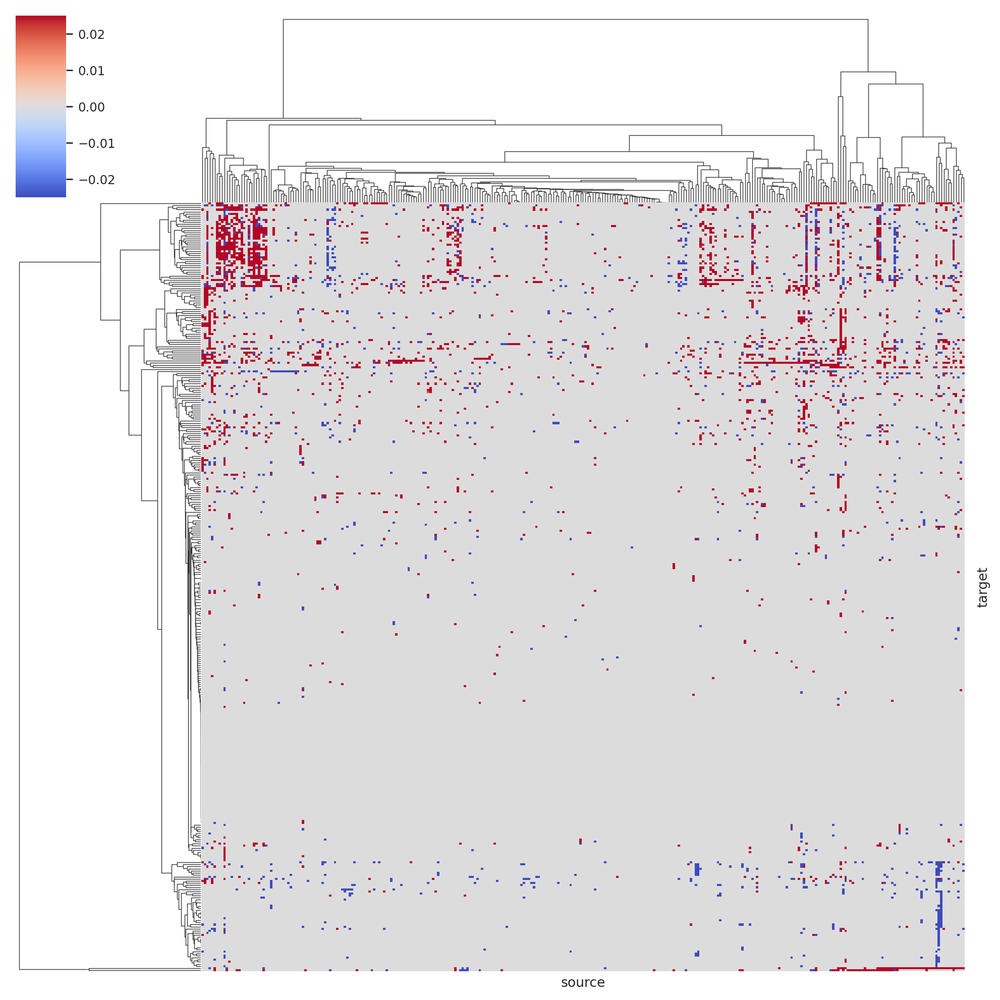

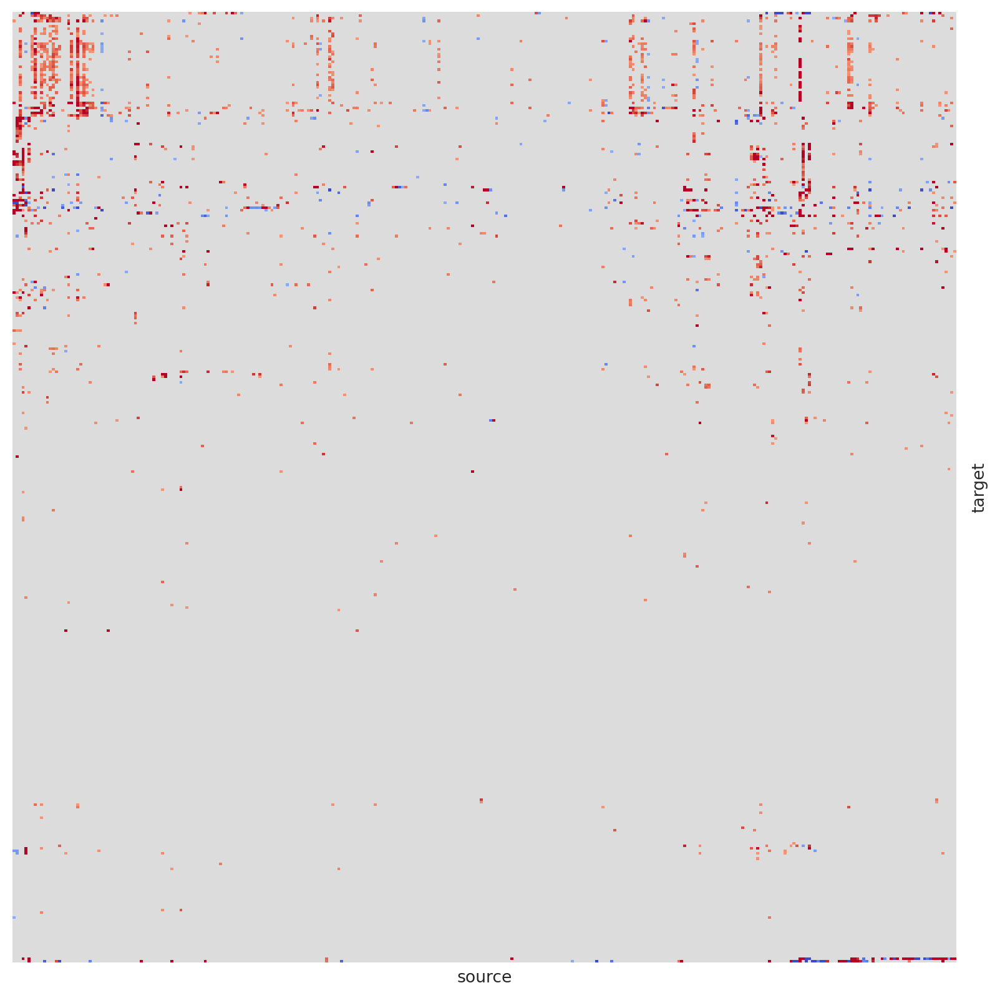

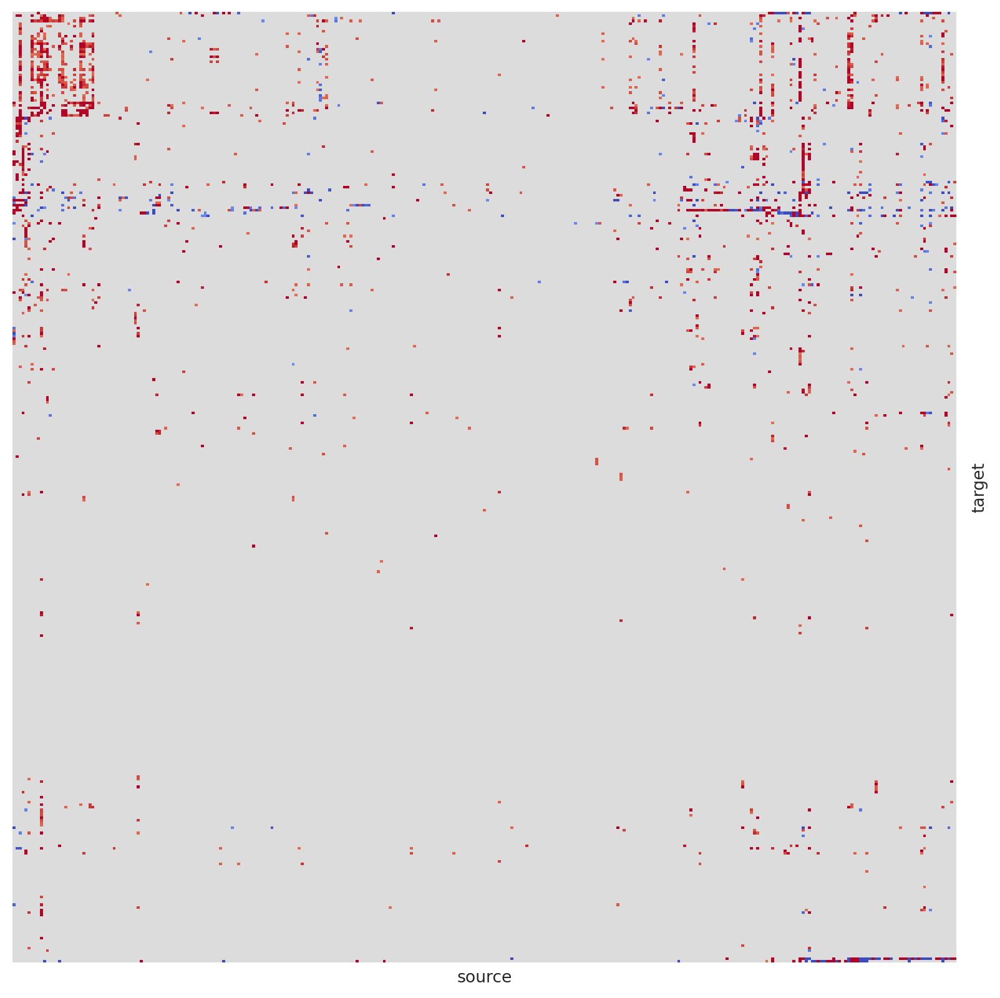

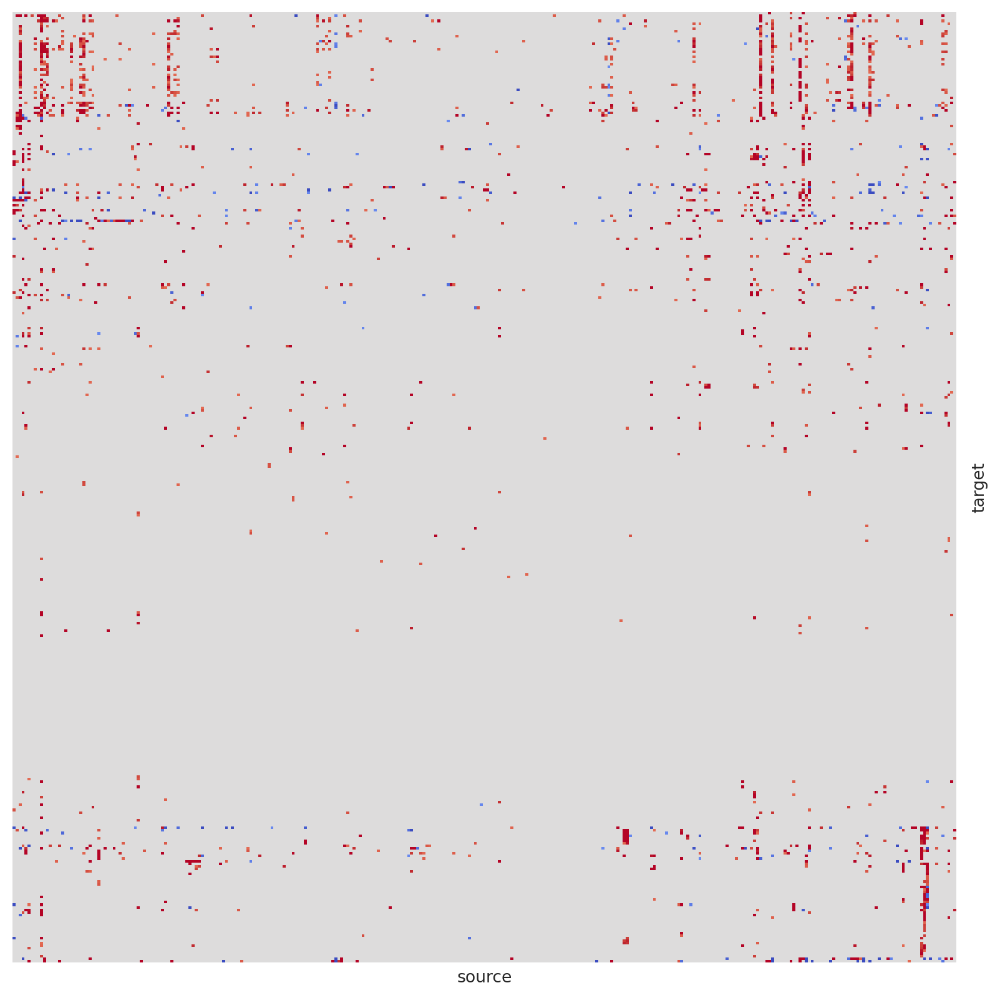

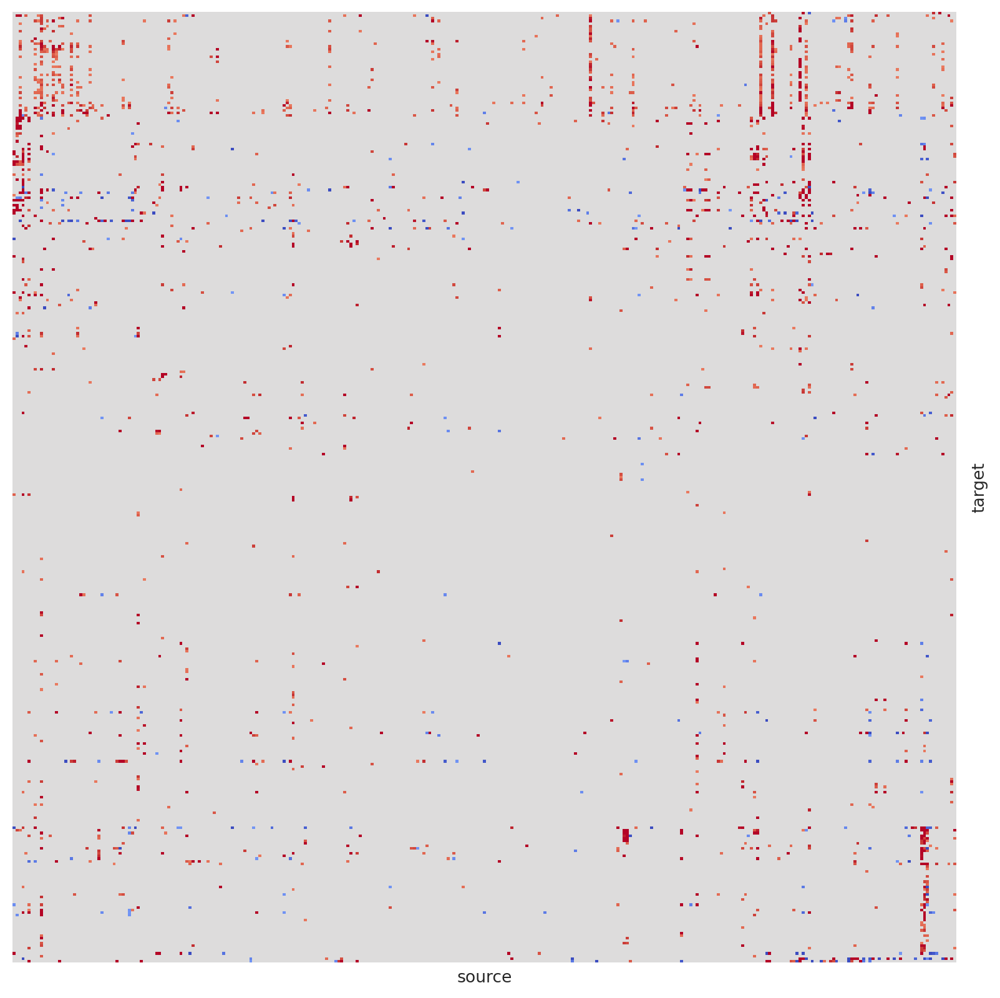

In [274]:
# define the dev stages corresponding to the timepoints list (for dataset IDs)
# stages = ["0somites", "5somites", "10somites","15somites","20somites","30somites"]
# stages
# timepoints = ['TDR126', 'TDR127', 'TDR128', 'TDR118reseq', 'TDR125reseq', 'TDR124reseq']

mesoderm_lineages = ["NMPs","PSM","Somites","Muscle"]

# based on the histogram above, we'll define the vmax/vmin for color scale
vmax = 0.025
vmin = -0.025

# compute the linkages from the first and the last timepoints, by augmenting the "time" components
df_counts1 = df_counts_union_mesoderm_lin["NMPs"]
df_counts2 = df_counts_union_mesoderm_lin["PSM"]
df_counts3 = df_counts_union_mesoderm_lin["Somites"]
df_counts4 = df_counts_union_mesoderm_lin["Muscle"]

# merge the two count matrices by augmenting the time
# df_counts = df_counts1*1000 + df_counts2*500 + df_counts3*100 + \
#             df_counts4*(-100) + df_counts5*(-500) + df_counts6*(-1000)
df_counts = abs(df_counts1)*1000 + abs(df_counts2)*(1000) + abs(df_counts3)*(-1000) #+ abs(df_counts4)*(-1000)
# df_counts = df_counts1

g1 = sns.clustermap(df_counts, method='ward', metric='euclidean', 
                    cmap='coolwarm', standard_scale=None,
                    row_cluster=True, col_cluster=True, 
                    xticklabels=False, yticklabels=False, 
                    vmax=vmax, vmin=vmin)

# extract the row/col indices
row_linkage = g1.dendrogram_row.linkage
col_linkage = g1.dendrogram_col.linkage

# Loop over all timepoints (using the pre-computed linkages from the first timepoint)
for idx, celltype in enumerate(mesoderm_lineages):

#     # extract the GRN from the corresponding "timepoint", and "celltype"
#     df = dict_filtered_GRNs[timepoint][celltype]
    
#     # pivot the GRN into a count matrix format
#     df_counts = df.pivot(index="target", columns="source", values="coef_mean").fillna(0)
    df_counts = df_counts_union_mesoderm_lin[celltype]
    
    # plot the clustermap
    g = sns.clustermap(df_counts, method='ward', metric='euclidean', 
                       cmap='coolwarm', standard_scale=None, 
                       row_cluster=True, col_cluster=True, 
                       xticklabels=False, yticklabels=False, 
                       vmax=vmax, vmin=vmin, 
                       row_linkage=row_linkage, col_linkage=col_linkage)
    
    # hide the dendrograms
    g.ax_row_dendrogram.set_visible(False)
    g.ax_col_dendrogram.set_visible(False)
    # hide the colorbar
    g.cax.set_visible(False)
    
    # extract the dev stage
#     celltype=stages[idx]
#     stage = "15somites"
#     # save the plot
    g.savefig(figpath + f"GRN_heatmap_{celltype}_{stage}_coolwarm_mesoderm.pdf") # celltype is defined above where we computed df_counts_union
    g.savefig(figpath + f"GRN_heatmap_{celltype}_{stage}_coolwarm_mesoderm.png")
# # Since sns.clustermap uses its own figure by default, we adjust our approach slightly:
# plt.close(g1.fig)  # Close the first plot's figure to prevent it from showing twice

# # Display all heatmaps side by side with consistent clustering
plt.show()

In [320]:
# Assuming you have determined your cluster size and its position (last N rows and M columns)
N = 60  # The number of rows in the cluster, replace with the actual number
M = 20  # The number of columns in the cluster, replace with the actual number

# The indices of the rows and columns in the original data that make up the cluster
row_indices = g1.dendrogram_row.reordered_ind[-N:]
col_indices = g1.dendrogram_col.reordered_ind[-M:]

# Extract the data for this cluster
cluster_data = df_counts.iloc[row_indices, col_indices]

# Print or process the cluster_data as needed
print(cluster_data)

# If you want to look at the labels of the rows and columns in the cluster
row_labels = df_counts.index[row_indices]
col_labels = df_counts.columns[col_indices]

print("Row Labels in the Cluster:", row_labels)
print("Column Labels in the Cluster:", col_labels)


source         sox21a     nr2f1b     pknox2     nr4a2b      cebpa    neurod4  \
target                                                                         
ism1         0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
histh1l      0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
myf5         0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
efnb2b       0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
zbtb18       0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
net1         0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
hsp90aa1.2   0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
efemp2b      0.000000  -2.066092   0.000000   0.000000   0.000000 -52.372772   
itga9        0.000000   0.000000 -22.592628   0.000000   0.000000   0.000000   
fgfrl1a      0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
emp2         0.000000   0.000000   0.000

In [338]:
col_names = ["nr2f5", "meis1a", "meis3"]
# row_names = ['efemp2b', 'itga9', 'fgfrl1a', 'emp2', 'tgfbi', 'kirrel3l', 'eya1',
#         'tenm4', 'pax3a', 'col18a1a', 'meis3', 'zgc:158328', #'meis1a', "cdh11",'foxp4', 'pbx1b',"fgf17","ripply1","cygb1"
#        'fgfr2', 'ebf3a', 'foxp1b',  'postnb', 'wt1a', 'comp',
#        'lfng', 'rgs3a', 'alcama', 'fsta', 'ptk2ab', 'plod2', 'ntn1a',
#        'colec12', 'bmpr1ba', 'efemp2a', 'greb1l', 'lhfpl6', 'dmrt2a',
#        'notch1b', 'hey1', 'pcdh10b', 'cited4a', 'optc', 'efnb2a',
#        'nr2f5', 'efnb3b', 'col5a2a', 'tenm3', 'abca1b', 'flrt3',
#        'ryr1b']
row_names = ['efemp2b', 'itga9', 'fgfrl1a', 'emp2', 'tgfbi', 'kirrel3l', 'eya1',
       'cdh11', 'tenm4', 'pax3a', 'col18a1a', 'meis3', 'zgc:158328', 'meis1a',
       'fgfr2', 'ebf3a', 'foxp1b', 'foxp4', 'pbx1b', 'postnb', 'wt1a', 'comp',
       'lfng', 'rgs3a', 'alcama', 'fsta', 'ptk2ab', 'plod2', 'ntn1a',
       'colec12', 'bmpr1ba', 'efemp2a', 'greb1l', 'lhfpl6', 'dmrt2a',
       'notch1b', 'hey1', 'pcdh10b', 'cited4a', 'optc', 'efnb2a', 'cygb1',
       'nr2f5', 'ripply1', 'efnb3b', 'col5a2a', 'tenm3', 'abca1b', 'flrt3',
       'ryr1b']

# subset the GRN for the portion that is upregulated in Muscle compared to NMPs
df_counts = df_counts_union_mesoderm_lin["Muscle"]

df_counts_muscle_upreg = df_counts.loc[row_names, col_names]
df_counts_muscle_upreg

source,nr2f5,meis1a,meis3
target,,,
efemp2b,0.044298,0.043579,-0.021928
itga9,0.040815,0.032270,0.052278
fgfrl1a,0.000000,0.036857,0.020826
emp2,0.046959,0.075978,0.000000
tgfbi,0.026274,0.021013,0.029074
kirrel3l,0.022392,0.035684,0.016717
eya1,0.022022,0.043875,0.000000
cdh11,0.000000,0.000000,0.000000
tenm4,0.027780,0.020735,-0.026280


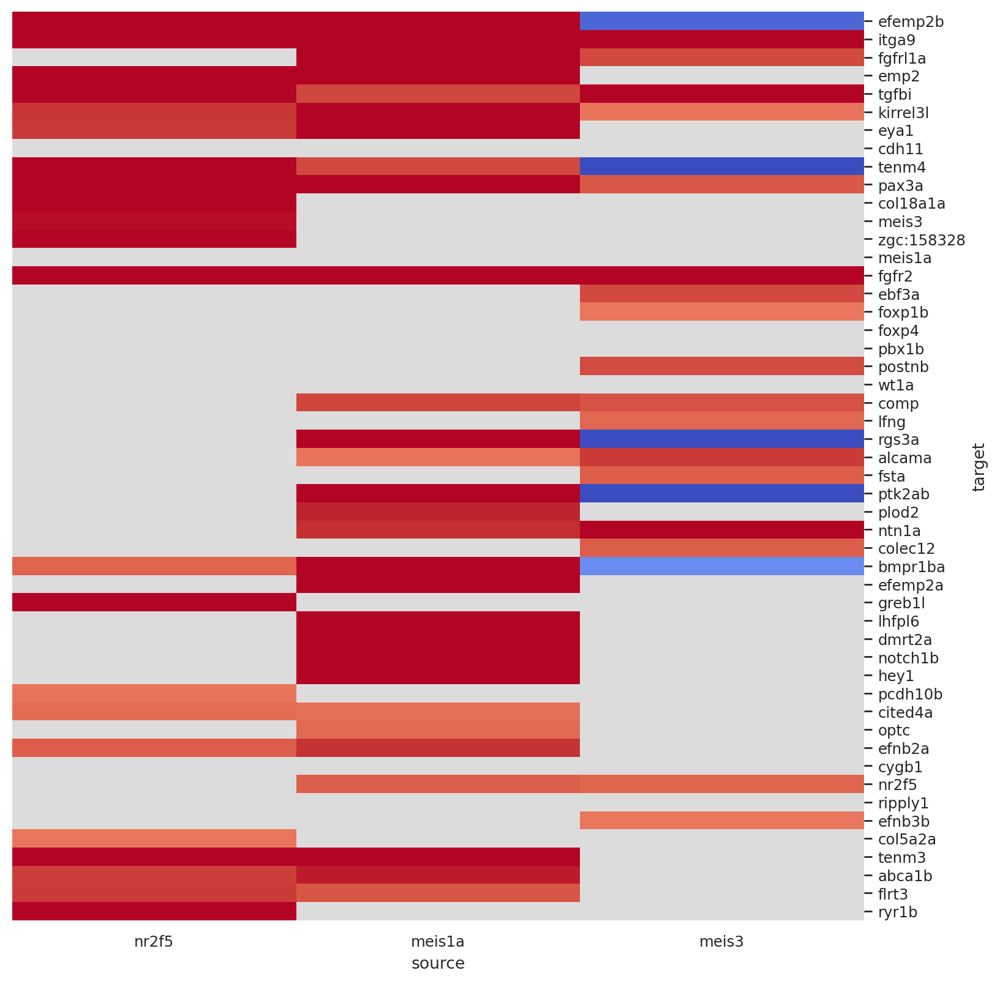

In [344]:
vmax = 0.025
vmin = -0.025

# plot the clustermap
g = sns.clustermap(df_counts_muscle_upreg, method='ward', metric='euclidean', 
                   cmap='coolwarm', standard_scale=None, 
                   row_cluster=False, col_cluster=False, 
                   xticklabels=True, yticklabels=True, 
                   vmax=vmax, vmin=vmin)

# hide the dendrograms
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)
# hide the colorbar
g.cax.set_visible(False)

celltype = "Muscle"
stage = "10somites"

g.savefig(figpath + f"subGRN_heatmap_{celltype}_{stage}.pdf") # celltype is defined above where we computed df_counts_union
g.savefig(figpath + f"subGRN_heatmap_{celltype}_{stage}.png")

plt.show()

In [333]:
df_counts.loc["efemp2b":"fgfr2",:]

source,lhx4,sox11a,klf2a,lmx1ba,jun,foxc1a,ebf3a,dmbx1a,isl2a,pax6b,...,rfx6,nr2f1b,wt1a,six1b,foxi2,foxf2a,pax6a,tcf7l2,foxn3,olig2
target,,,,,,,,,,,,,,,,,,,,,


In [325]:
df_counts.loc["efemp2b":"fgf17",:]

source,lhx4,sox11a,klf2a,lmx1ba,jun,foxc1a,ebf3a,dmbx1a,isl2a,pax6b,...,rfx6,nr2f1b,wt1a,six1b,foxi2,foxf2a,pax6a,tcf7l2,foxn3,olig2
target,,,,,,,,,,,,,,,,,,,,,


In [64]:
from scipy.cluster.hierarchy import fcluster

# Assuming `g` is the last generated clustermap object
# Row clusters
row_clusters = fcluster(g1.dendrogram_row.linkage, t=0.15, criterion='distance')
# Column clusters
col_clusters = fcluster(g1.dendrogram_col.linkage, t=0.2, criterion='distance')

# Map cluster labels to gene names for rows (targets)
row_labels = g1.data2d.index.tolist()  # Assuming g.data2d gives the clustered DataFrame
row_cluster_labels = list(zip(row_labels, row_clusters))

# Map cluster labels to gene names for columns (sources)
col_labels = g1.data2d.columns.tolist()
col_cluster_labels = list(zip(col_labels, col_clusters))

# # Print or process the cluster labels as needed
# print("Row (Target) Cluster Labels:")
# for label in row_cluster_labels:
#     print(label)

# print("\nColumn (Source) Cluster Labels:")
# for label in col_cluster_labels:
#     print(label)

In [81]:
# cluster_number
row_cluster_id = 8

# Identify the indices of rows belonging to the cluster
rows_in_cluster = np.where(row_clusters == row_cluster_id)[0]
rows_in_cluster

# Subset the dataframe using the indices
clustered_data = df_counts_union["TDR126"].iloc[rows_in_cluster,:]
clustered_data

source,lhx4,sox11a,klf2a,lmx1ba,samd11,lhx6,jun,foxc1a,ebf3a,sox32,...,six1b,foxp2,foxi2,foxf2a,etv1,pax6a,tcf7l2,tbx1,foxn3,olig2
target,,,,,,,,,,,,,,,,,,,,,
msgn1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.037771,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [87]:
clustered_data.loc[:,clustered_data.any(axis=0)]

source,foxc1a,foxd5,foxc1b,msx1b,hoxb1b,rarab,hoxb7a,irx7,dlx3b,hoxa9b,zic2a,vox,tbx16,fli1a,etv5a
target,,,,,,,,,,,,,,,
msgn1,0.037771,-0.027599,0.022292,-0.026655,0.023651,0.025317,0.056558,0.028574,0.023753,0.039545,0.022012,0.047602,0.080298,-0.059771,-0.033452


In [95]:
df_subset

df_non_zero = df_subset[df_subset.values != 0]
df_non_zero

source
foxc1a    0.037771
foxd5    -0.027599
foxc1b    0.022292
msx1b    -0.026655
hoxb1b    0.023651
rarab     0.025317
hoxb7a    0.056558
irx7      0.028574
dlx3b     0.023753
hoxa9b    0.039545
zic2a     0.022012
vox       0.047602
tbx16     0.080298
fli1a    -0.059771
etv5a    -0.033452
Name: msgn1, dtype: float32

In [97]:
# Let's check how the GRN changes over time for one gene
timepoints

# gene_of_interest: goi
goi = "msgn1"

for timepoint in timepoints:
    df_counts = df_counts_union[timepoint]
    df_subset = df_counts.loc[goi,:]
    df_non_zero = df_subset[df_subset.values != 0]
    
    print(timepoint)
    print(df_non_zero)

TDR126
source
foxc1a    0.037771
foxd5    -0.027599
foxc1b    0.022292
msx1b    -0.026655
hoxb1b    0.023651
rarab     0.025317
hoxb7a    0.056558
irx7      0.028574
dlx3b     0.023753
hoxa9b    0.039545
zic2a     0.022012
vox       0.047602
tbx16     0.080298
fli1a    -0.059771
etv5a    -0.033452
Name: msgn1, dtype: float32
TDR127
source
egr2b     0.022179
foxd5    -0.025826
hoxc3a   -0.040655
alx4a     0.021797
her9      0.023238
rarab     0.038612
hoxb7a    0.056612
hoxb3a   -0.025189
hoxd9a    0.021835
dlx3b     0.023147
vox       0.031904
tbx16     0.115298
hmga1a    0.043015
rxraa     0.039571
Name: msgn1, dtype: float32
TDR128
source
isl2a     -0.030620
foxd5     -0.027677
msx1b     -0.043984
hoxb1b     0.025747
hoxc6b     0.036088
hoxa10b   -0.017589
pbx3b     -0.019358
tbx18     -0.026502
hoxc1a     0.018877
alx4a     -0.018162
nr3c2     -0.025774
vent       0.038285
eve1      -0.023913
tlx3b      0.028204
emx3      -0.017701
hoxb7a     0.079788
hoxb3a    -0.035572
lef1       

## Step 1. compute Jaccard Coefficient between two GRNs

- Note: Jaccard Coeff is a metric to compute the similarity between two sets (intersection/union). If it's closer to 1, it means that the two sets are identical, and if it's closer to 0, that means the two sets are very different.



In [169]:
def calculate_jaccard_coefficient(grn1, grn2):
    """
    Calculates the Jaccard coefficient for two gene regulatory networks (GRNs).
    
    Parameters:
    - grn1: A pandas DataFrame representing the first GRN, with columns 'source', 'target', etc.
    - grn2: A pandas DataFrame representing the second GRN, similar to grn1.
    
    Returns:
    - The Jaccard coefficient as a float.
    """
    
    # Create sets of unique (source, target) tuples for each GRN
    set_grn1 = set(zip(grn1['source'], grn1['target']))
    set_grn2 = set(zip(grn2['source'], grn2['target']))
    
    # Calculate intersection and union sizes
    intersection_size = len(set_grn1.intersection(set_grn2))
    union_size = len(set_grn1.union(set_grn2))
    
    # Calculate Jaccard coefficient
    jaccard_coefficient = intersection_size / union_size if union_size > 0 else 0
    
    return jaccard_coefficient

# Example usage
# Replace these with your actual GRN dataframes
grn1_data = {'source': ['GeneA', 'GeneB', 'GeneC'], 'target': ['GeneD', 'GeneE', 'GeneF']}
grn2_data = {'source': ['GeneA', 'GeneX', 'GeneC'], 'target': ['GeneD', 'GeneY', 'GeneZ']}

grn1 = pd.DataFrame(grn1_data)
grn2 = pd.DataFrame(grn2_data)

jaccard_coefficient = calculate_jaccard_coefficient(grn1, grn2)
print(f"Jaccard Coefficient: {jaccard_coefficient}")

Jaccard Coefficient: 0.2


### Jaccard Coeff. between two different celltypes (same timepoints)

In [172]:
# get the list of celltypes
celltypes = dict_filtered_GRNs["TDR126"].keys()
celltypes = [ct for ct in celltypes if ct !="unassigned"]
celltypes


# for each timepoint, compute the Jaccard Coefficient between two celltypes


['Differentiating_Neurons',
 'Endoderm',
 'Epidermal',
 'Lateral_Mesoderm',
 'Muscle',
 'NMPs',
 'Neural_Anterior',
 'Neural_Crest',
 'Neural_Posterior',
 'Notochord',
 'PSM',
 'Somites']

In [181]:
def calculate_jaccard_between_celltypes(dict_filtered_GRNs, timepoint, celltypes):
    """
    Calculates the Jaccard coefficients between the GRNs of all combinations of cell types for a specified time point.
    
    Parameters:
    - dict_filtered_GRNs: Master dictionary with keys for timepoints and nested keys for celltypes.
    - timepoint: The specific time point to analyze.
    - celltypes: List of cell types to consider for combinations.
    
    Returns:
    - A dictionary of Jaccard coefficients with cell type pairs as keys.
    """
    jaccard_coefficients = {}
    for celltype1, celltype2 in combinations(celltypes, 2):
        if celltype1 in dict_filtered_GRNs[timepoint] and celltype2 in dict_filtered_GRNs[timepoint]:
            grn1 = dict_filtered_GRNs[timepoint][celltype1]
            grn2 = dict_filtered_GRNs[timepoint][celltype2]
            coefficient = calculate_jaccard_coefficient(grn1, grn2)
            jaccard_coefficients[(celltype1, celltype2)] = coefficient
        else:
            print(f"One or both cell types {celltype1}, {celltype2} not found in time point {timepoint}.")
    return jaccard_coefficients


In [182]:
# Example usage
timepoint = "TDR126"  # replace with your actual time point
celltypes = ['Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites']

jaccard_results = calculate_jaccard_between_celltypes(dict_filtered_GRNs, timepoint, celltypes)


# Printing the results
for celltype_pair, coefficient in jaccard_results.items():
    print(f"{celltype_pair}: Jaccard Coefficient = {coefficient}")

('Differentiating_Neurons', 'Endoderm'): Jaccard Coefficient = 0.33155792276964047
('Differentiating_Neurons', 'Epidermal'): Jaccard Coefficient = 0.287001287001287
('Differentiating_Neurons', 'Lateral_Mesoderm'): Jaccard Coefficient = 0.2903225806451613
('Differentiating_Neurons', 'Muscle'): Jaccard Coefficient = 0.24339446689462232
('Differentiating_Neurons', 'NMPs'): Jaccard Coefficient = 0.23954136969321352
('Differentiating_Neurons', 'Neural_Anterior'): Jaccard Coefficient = 0.3110455588331695
('Differentiating_Neurons', 'Neural_Crest'): Jaccard Coefficient = 0.3188262446422684
('Differentiating_Neurons', 'Neural_Posterior'): Jaccard Coefficient = 0.31795716639209226
('Differentiating_Neurons', 'Notochord'): Jaccard Coefficient = 0.3136288998357964
('Differentiating_Neurons', 'PSM'): Jaccard Coefficient = 0.2519561815336463
('Differentiating_Neurons', 'Somites'): Jaccard Coefficient = 0.2936610608020699
('Endoderm', 'Epidermal'): Jaccard Coefficient = 0.3665869490946361
('Endoderm

In [184]:
# create a master dict for Jaccard coeff.
dict_Jaccard_master = {}

# Loop over all timepoints
for timepoint in dict_filtered_GRNs.keys():
    
#     timepoint = "TDR126"  # replace with your actual time point
    # get the list of celltypes
    celltypes = dict_filtered_GRNs[timepoint].keys()
    celltypes = [ct for ct in celltypes if ct !="unassigned"] # exclude the "unassigned"
    print(celltypes)
    #celltypes = ['Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites']

    jaccard_results = calculate_jaccard_between_celltypes(dict_filtered_GRNs, timepoint, celltypes)
    dict_master_Jaccard[timepoint] = jaccard_results

# # Printing the results
# for celltype_pair, coefficient in jaccard_results.items():
#     print(f"{celltype_pair}: Jaccard Coefficient = {coefficient}")

# dict_master_Jaccard

['Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites']
['Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites']
['Adaxial_Cells', 'Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites']
['Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites']
['Adaxial_Cells', 'Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Muscle', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites']
['Adaxial_Cells', 'Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', '

In [189]:
dict_filtered_GRNs.keys()

dict_keys(['TDR126', 'TDR127', 'TDR119reseq', 'TDR125reseq', 'TDR124reseq', 'TDR118reseq', 'TDR128'])

Text(0, 0.5, 'frequency')

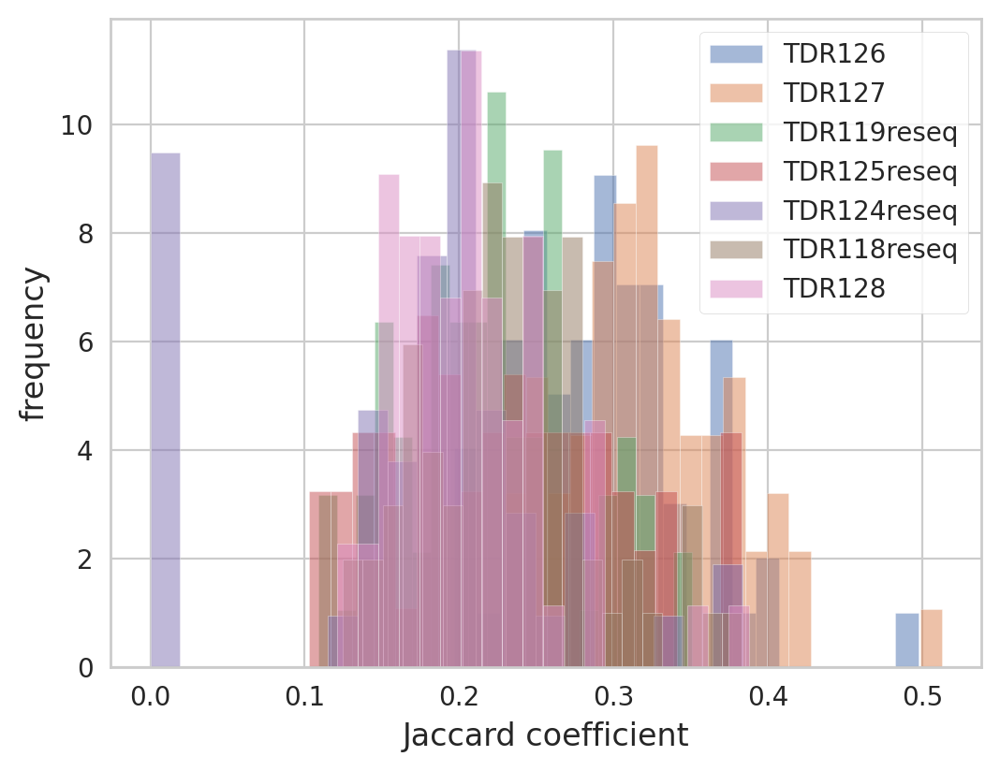

In [226]:
timepoints = dict_filtered_GRNs.keys()

for timepoint in dict_filtered_GRNs.keys():
    jaccard_results = dict_master_Jaccard[timepoint]
    plt.hist(jaccard_results.values(), alpha = 0.5, density=True, bins=20)
    
plt.legend(timepoints)
plt.xlabel("Jaccard coefficient")
plt.ylabel("frequency")

The above histogram shows the variability of GRNs between two celltypes within each timepoint.

### Jaccard coefficients between biological replicates (same celltypes)

this will serve as the upper limit of Jaccard Coefficients

In [196]:
# Check the GRN reproducibility between two biological replicates (TDR118reseq and TDR119reseq)
timepoints = ["TDR118reseq", "TDR119reseq"]
celltypes = dict_filtered_GRNs["TDR118reseq"].keys()

# define an empty dictionary
jaccard_coefficients = {celltype: {} for celltype in celltypes}

for celltype in celltypes:
    for time1, time2 in combinations(timepoints, 2):
        if celltype in dict_filtered_GRNs[time1] and celltype in dict_filtered_GRNs[time2]:
            grn1 = dict_filtered_GRNs[time1][celltype]
            grn2 = dict_filtered_GRNs[time2][celltype]
            coefficient = calculate_jaccard_coefficient(grn1, grn2)
            jaccard_coefficients[celltype] = coefficient
        else:
            print(f"Cell type {celltype} not found in both time points {time1} and {time2}.")

jaccard_coefficients

{'Adaxial_Cells': 0.23228589032655575,
 'Differentiating_Neurons': 0.225114854517611,
 'Endoderm': 0.24727159338946056,
 'Epidermal': 0.23647604327666152,
 'Lateral_Mesoderm': 0.2634238787113076,
 'Muscle': 0.21212121212121213,
 'NMPs': 0.2198841110094541,
 'Neural_Anterior': 0.2376237623762376,
 'Neural_Crest': 0.2476606363069245,
 'Neural_Posterior': 0.2511729746637473,
 'Notochord': 0.15942028985507245,
 'PSM': 0.24262193227710468,
 'Somites': 0.22737035900583,
 'unassigned': 0.06213489113117366}

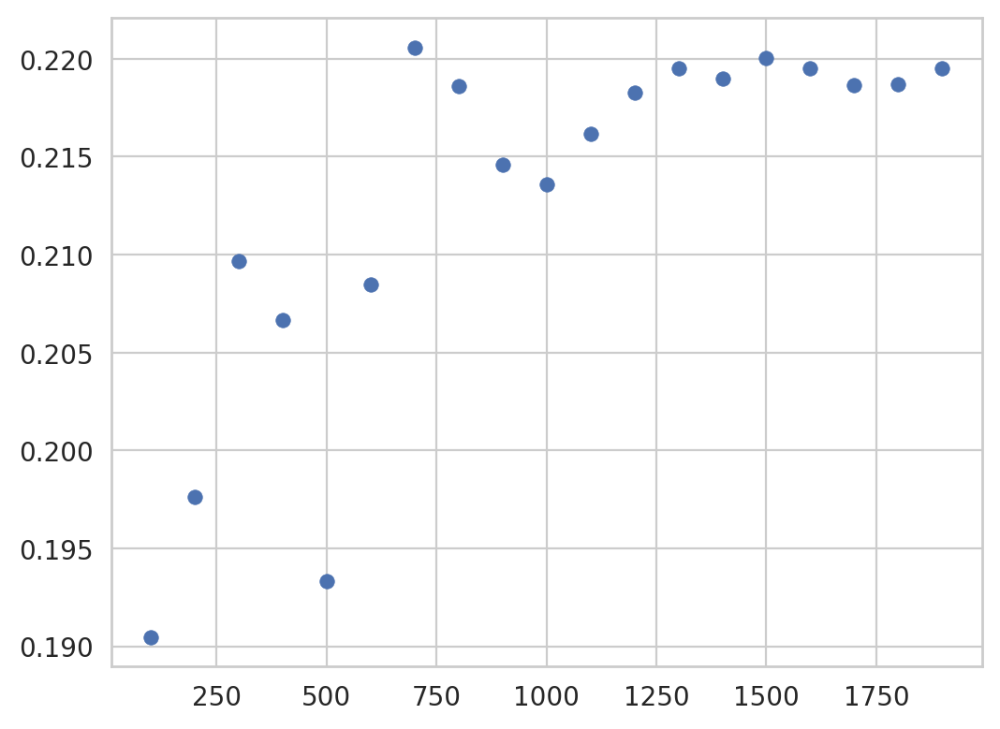

In [212]:
# let's explore how reproducible the two GRNs from two biological replicates are (by playing with the number of edges, the default is 2000)

# extract the GRNs from the two biological replicatges
celltype = "NMPs"
grn1 = dict_filtered_GRNs["TDR118reseq"][celltype]
grn2 = dict_filtered_GRNs["TDR119reseq"][celltype]

list_Jacc_coeff = []

# filter for top N (N<=2000)
for N_threshold in range(100,2000,100):
    grn1_filt = grn1.iloc[0:N_threshold,:]
    grn2_filt = grn2.iloc[0:N_threshold,:]
    coefficient = calculate_jaccard_coefficient(grn1_filt, grn2_filt)
    list_Jacc_coeff.append(coefficient)

plt.scatter(range(100,2000,100), list_Jacc_coeff)

In [207]:
grn1.iloc[0:100,:]

,source,target,coef_mean,coef_abs,p,-logp
151278,hmga1a,rrm2,0.133519,0.133519,9.928235e-25,24.003128
88512,tbx16,itm2cb,0.112350,0.112350,8.840085e-23,22.053544
23255,msx1b,cdh6,0.099967,0.099967,1.139175e-15,14.943410
171694,sox5,sox6,0.090497,0.090497,4.448988e-12,11.351739
201185,lef1,zbtb16a,0.084267,0.084267,1.856435e-19,18.731320
...,...,...,...,...,...,...
113562,hmga1a,ncl,0.041040,0.041040,1.113681e-18,17.953239
153130,esrrga,rxraa,0.040668,0.040668,2.749920e-11,10.560680
25994,sox5,chrd,-0.040590,0.040590,5.363330e-11,10.270565
80385,esrrga,hoxc3a,0.040473,0.040473,7.010946e-12,11.154223


In [213]:
set_grn1 = set(zip(grn1['source'], grn1['target']))
set_grn2 = set(zip(grn2['source'], grn2['target']))

intersection_size = len(set_grn1.intersection(set_grn2))
union_size = len(set_grn1.union(set_grn2))

intersection = set_grn1.intersection(set_grn2)
union = set_grn1.union(set_grn2)


In [216]:
grn1

,source,target,coef_mean,coef_abs,p,-logp
151278,hmga1a,rrm2,0.133519,0.133519,9.928235e-25,24.003128
88512,tbx16,itm2cb,0.112350,0.112350,8.840085e-23,22.053544
23255,msx1b,cdh6,0.099967,0.099967,1.139175e-15,14.943410
171694,sox5,sox6,0.090497,0.090497,4.448988e-12,11.351739
201185,lef1,zbtb16a,0.084267,0.084267,1.856435e-19,18.731320
...,...,...,...,...,...,...
53178,nkx6.1,epha4b,0.013449,0.013449,6.345565e-04,3.197530
122676,meox1,nrp2b,0.013447,0.013447,2.707338e-11,10.567458
29674,pknox2,cntfr,0.013445,0.013445,9.276150e-08,7.032632
140259,esr2a,prickle1a,0.013426,0.013426,6.250123e-08,7.204111


In [219]:
# Create a column in grn1 to mark whether each row is in the intersection
grn1['is_in_intersection'] = grn1.apply(lambda row: (row['source'], row['target']) in intersection, axis=1)
grn2['is_in_intersection'] = grn2.apply(lambda row: (row['source'], row['target']) in intersection, axis=1)

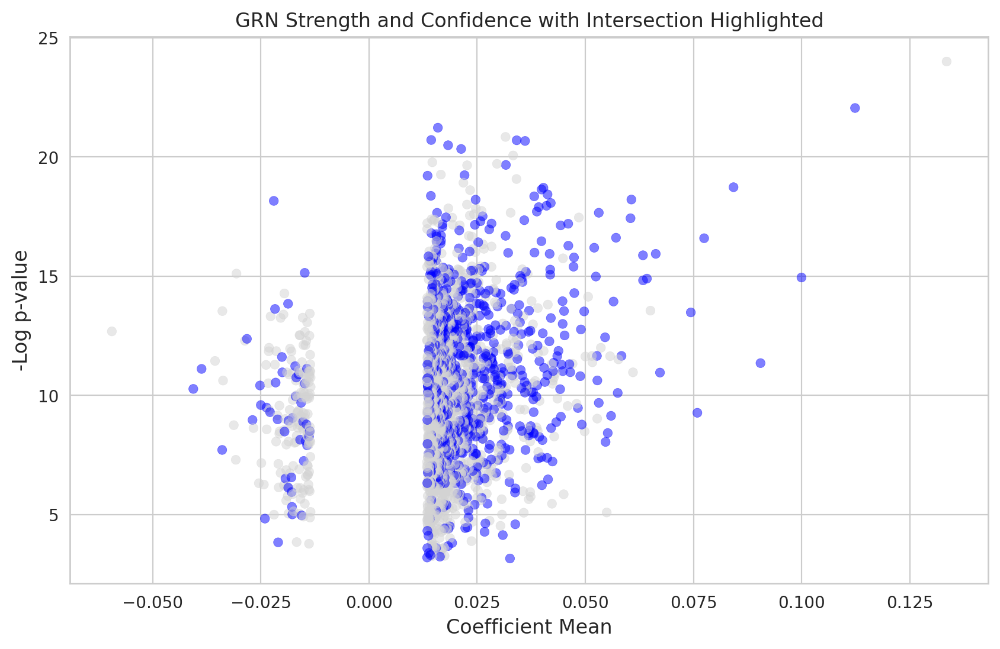

In [221]:
# Plotting
# Colors: 'blue' for points in the intersection, 'lightgray' otherwise
colors = grn1['is_in_intersection'].map({True: 'blue', False: 'lightgray'})

plt.figure(figsize=(10, 6))
plt.scatter(grn1["coef_mean"], grn1["-logp"], c=colors, alpha=0.5)  # Assuming the column is "logp" and you want its negative
plt.xlabel('Coefficient Mean')
plt.ylabel('-Log p-value')
plt.title('GRN Strength and Confidence with Intersection Highlighted')
plt.show()

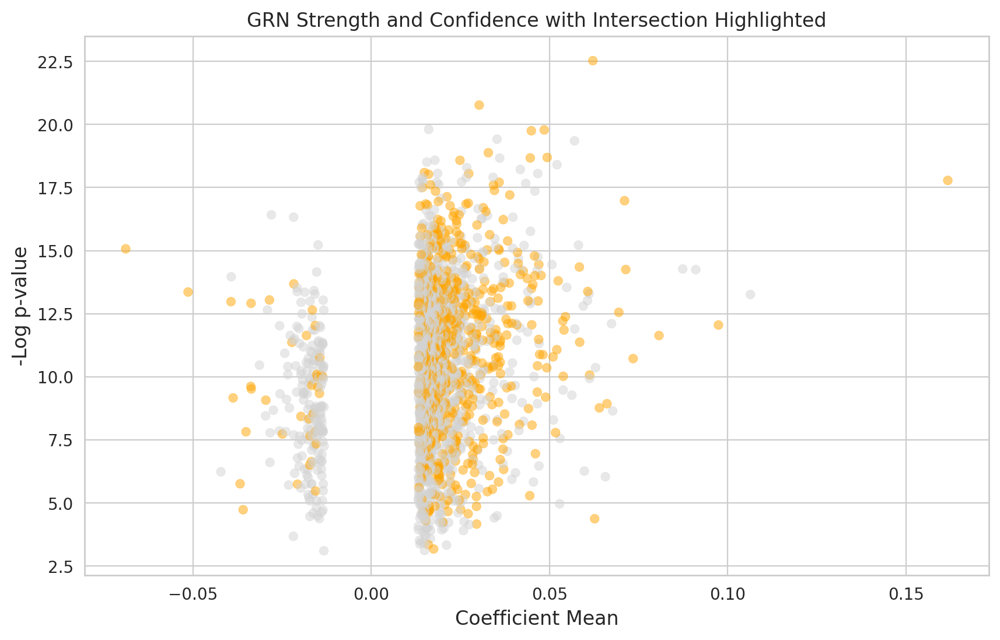

In [222]:
# Plotting
# Colors: 'blue' for points in the intersection, 'lightgray' otherwise
colors = grn2['is_in_intersection'].map({True: 'orange', False: 'lightgray'})

plt.figure(figsize=(10, 6))
plt.scatter(grn2["coef_mean"], grn2["-logp"], c=colors, alpha=0.5)  # Assuming the column is "logp" and you want its negative
plt.xlabel('Coefficient Mean')
plt.ylabel('-Log p-value')
plt.title('GRN Strength and Confidence with Intersection Highlighted')
plt.show()

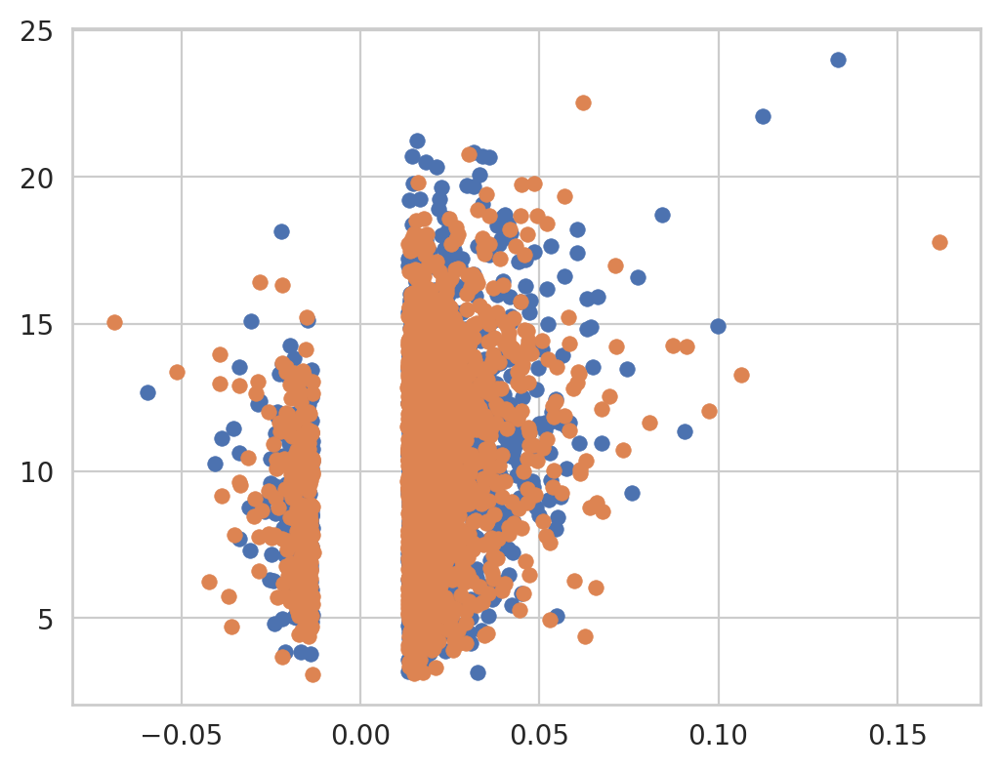

In [218]:
# Check in the volcano plot - intersection and union
plt.scatter(grn1["coef_mean"], grn1["-logp"])
plt.scatter(grn2["coef_mean"], grn2["-logp"])

In [ ]:
def calculate_jaccard_for_celltype_across_timepoints(dict_filtered_GRNs, celltypes):
    """
    Calculates the Jaccard coefficients between the GRNs of each cell type for all combinations of time points.
    
    Parameters:
    - dict_filtered_GRNs: Master dictionary with keys for timepoints and nested keys for celltypes.
    - celltypes: List of cell types to calculate the Jaccard coefficients for.
    
    Returns:
    - A dictionary of dictionaries, with each sub-dictionary containing Jaccard coefficients for combinations of time points for a specific cell type.
    """
    jaccard_coefficients = {celltype: {} for celltype in celltypes}
    timepoints = list(dict_filtered_GRNs.keys())
    
    for celltype in celltypes:
        for time1, time2 in combinations(timepoints, 2):
            if celltype in dict_filtered_GRNs[time1] and celltype in dict_filtered_GRNs[time2]:
                grn1 = pd.DataFrame(dict_filtered_GRNs[time1][celltype])
                grn2 = pd.DataFrame(dict_filtered_GRNs[time2][celltype])
                coefficient = calculate_jaccard_coefficient(grn1, grn2)
                jaccard_coefficients[celltype][(time1, time2)] = coefficient
            else:
                print(f"Cell type {celltype} not found in both time points {time1} and {time2}.")
    
    return jaccard_coefficients

In [ ]:
# def calculate_jaccard_for_celltypes(dict_filtered_GRNs, time1, time2):
#     """
#     Calculates the Jaccard coefficients between the GRNs of each cell type for two specified time points.
    
#     Parameters:
#     - dict_filtered_GRNs: Master dictionary with keys for timepoints and nested keys for celltypes.
#     - time1, time2: The two time points to compare.
    
#     Returns:
#     - A dictionary of Jaccard coefficients with cell types as keys.
#     """
#     jaccard_coefficients = {}
#     for celltype in dict_filtered_GRNs[time1].keys():
#         if celltype in dict_filtered_GRNs[time2]:
#             grn1 = pd.DataFrame(dict_filtered_GRNs[time1][celltype])
#             grn2 = pd.DataFrame(dict_filtered_GRNs[time2][celltype])
#             jaccard_coefficients[celltype] = calculate_jaccard_coefficient(grn1, grn2)
#         else:
#             print(f"Cell type {celltype} not found in both time points.")
#     return jaccard_coefficients

In [171]:
dict_filtered_GRNs["TDR126"].keys()

# assess the Jaccard Coeff. between two different celltypes (same timepoints)


dict_keys(['Differentiating_Neurons', 'Endoderm', 'Epidermal', 'Lateral_Mesoderm', 'Muscle', 'NMPs', 'Neural_Anterior', 'Neural_Crest', 'Neural_Posterior', 'Notochord', 'PSM', 'Somites', 'unassigned'])

## Step 2. visualize the network metrics (degree distributions) across time/pseudotime

- (1) across pseudotime
- (2) across time


### Step 2-1. Real-time

In [ ]:
# plt.scatter(df1_sorted[0:20].degree_centrality_all, df1_sorted[0:20].index)
# plt.scatter(df2_sorted[0:20].degree_centrality_all, df2_sorted[0:20].index)

# plt.title(celltype)
# plt.xlabel("degree_centrality_all")
# plt.ylabel("gene names")
# plt.show()

In [148]:
figpath

'/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/zebrahub-multiome-analysis/figures/EDA_GRN_dynamics_timepoints/'

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 38 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'M', 'N', 'P', 'a', 'b', 'c', 'd', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'underscore', 'v', 'x', 'y', 'z', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 27, 48, 49, 51, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 89, 91, 92, 93]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 43 glyphs after
INFO:fontTo

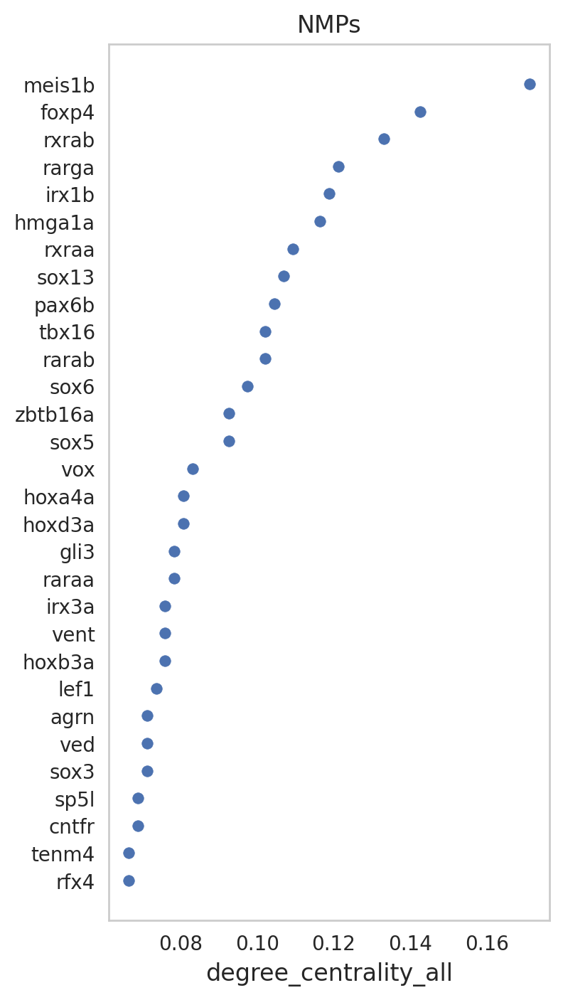

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 37 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'M', 'P', 'S', 'a', 'b', 'c', 'd', 'e', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'underscore', 'x', 'y', 'z', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 48, 51, 54, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 91, 92, 93]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 42 glyphs after
INFO:fontTools.subse

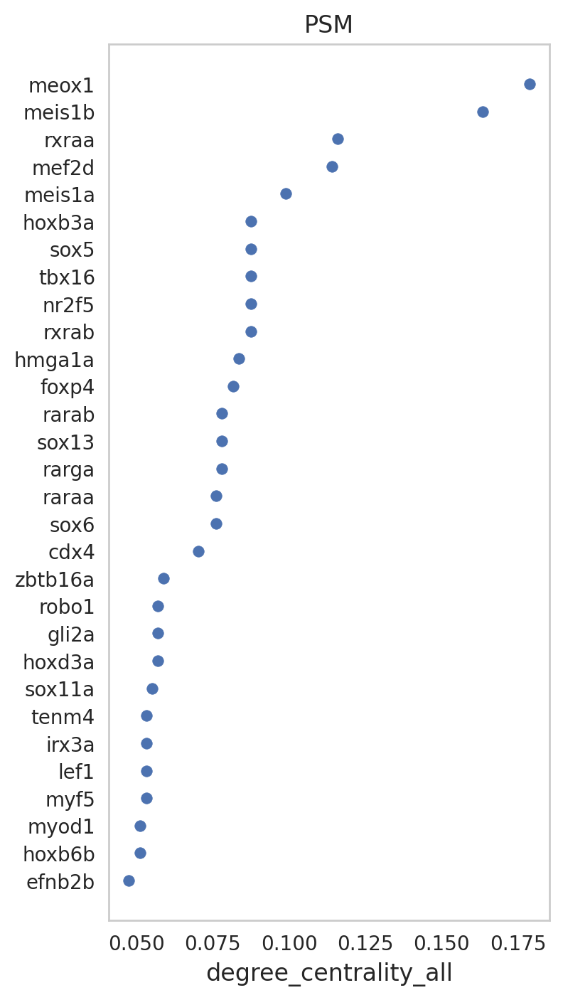

In [258]:
df1 = dict_merged_score["TDR118reseq"]
u
# choose a degree metric to use
degree_metric = "degree_centrality_all"

merged_score1 = df1[df1.cluster=="NMPs"]
merged_score1 = merged_score1.sort_values(degree_metric, ascending=False)

merged_score2 = df1[df1.cluster=="PSM"]
merged_score2 = merged_score2.sort_values(degree_metric, ascending=False)


plt.figure(figsize=(4,8))
plt.scatter(merged_score1[0:30].degree_centrality_all, merged_score1[0:30].index)
plt.xlabel("degree_centrality_all")
plt.title("NMPs")
plt.grid(False)
plt.gca().invert_yaxis()
plt.savefig(figpath + "GRN_degree_centrality_all_NMPs_top30.pdf")
plt.savefig(figpath + "GRN_degree_centrality_all_NMPs_top30.png")
plt.show()

plt.figure(figsize=(4,8))
plt.scatter(merged_score2[0:30].degree_centrality_all, merged_score2[0:30].index)
plt.xlabel("degree_centrality_all")
plt.title("PSM")
plt.grid(False)
plt.gca().invert_yaxis()
plt.savefig(figpath + "GRN_degree_centrality_all_PSM_top30.pdf")
plt.savefig(figpath + "GRN_degree_centrality_all_PSM_top30.png")
plt.show()

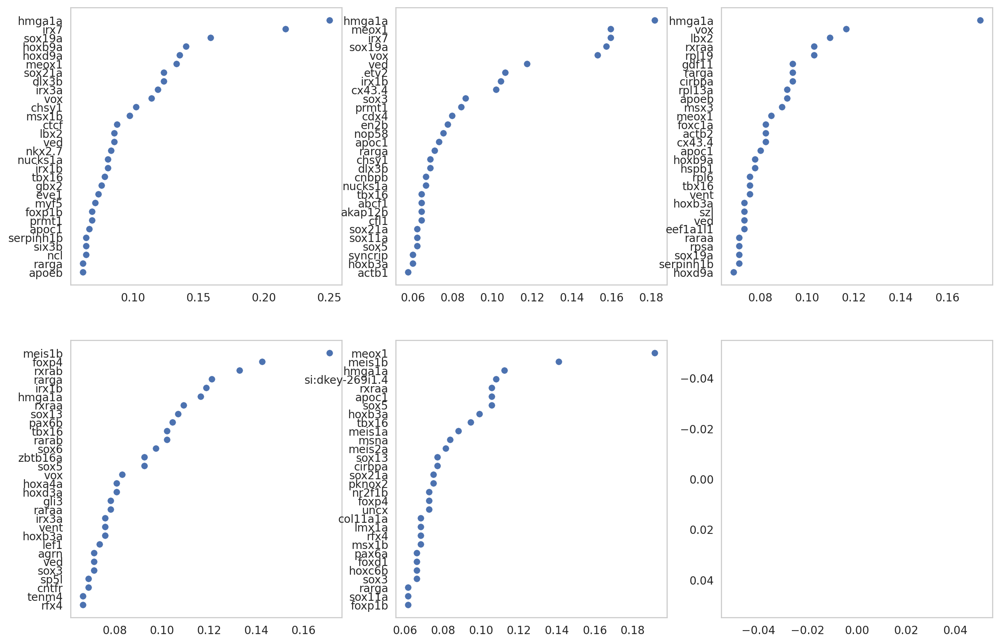

In [168]:
# Check the top 30 degree_centrality_all genes for one "celltype" over time
list_timepoints = ["TDR126", "TDR127", "TDR128", "TDR118reseq", "TDR125reseq", "TDR124reseq"]

# define a celltype
celltype = "NMPs"

# choose a degree metric to use
degree_metric = "degree_centrality_all"

fig, axs = plt.subplots(2, 3, figsize=(15, 10)) # Adjust the figsize as needed
axs = axs.flatten() # Flatten the array of axes for easy indexing

for index, timepoint in enumerate(list_timepoints):
    df = dict_merged_score[timepoint]
    # extract the merged score for that specific celltype
    merged_score = df[df.cluster==celltype]
    # subset for the celltype of interest
    df = merged_score[merged_score.cluster == celltype]
    df_sorted = df.sort_values(degree_metric, ascending=False)
    
    axs[index].scatter(df_sorted[0:30].degree_centrality_all, df_sorted[0:30].index)
    axs[index].invert_yaxis()
    axs[index].grid(False)
#     axs[index].xlabel("degree_centrality_all")
#     axs[index].ylabel("genes")
    

In [228]:
# Assuming dict_merged_score is defined and contains the dataframes for each timepoint

list_timepoints = ["TDR126", "TDR127", "TDR128", "TDR118reseq", "TDR125reseq", "TDR124reseq"]
celltype = "PSM"
degree_metric = "degree_centrality_all"

# Initialize a set to keep track of the union of top 30 genes across all timepoints
top_genes_union = set()

# Iterate over each timepoint to process the data and collect top genes
for timepoint in list_timepoints:
    df = dict_merged_score[timepoint]
    # Extract rows for the specific celltype
    df_celltype = df[df.cluster == celltype]
    # Sort by degree_metric and take the top 30
    df_sorted = df_celltype.sort_values(degree_metric, ascending=False).head(30)
    # Update the set with top genes from this timepoint
    top_genes_union.update(df_sorted.index)
    
# Convert the set of genes to a list to use as DataFrame index
top_genes_union_list = list(top_genes_union)


# Correctly create a new DataFrame with the genes as rows and timepoints as columns
genes_timepoints_df = pd.DataFrame(index=top_genes_union_list, columns=list_timepoints)

# Populate the new DataFrame with degree_metric values
for timepoint in list_timepoints:
    df = dict_merged_score[timepoint]
    df_celltype = df[df.cluster == celltype]
    # Iterate over genes in the union set
    for gene in top_genes_union:
        if gene in df_celltype.index:
            # Correctly access the gene's metric using `.at` for scalar value
            genes_timepoints_df.at[gene, timepoint] = df_celltype.at[gene, degree_metric]

# Replace NaN with 0 or any other placeholder as required
genes_timepoints_df.fillna(0, inplace=True)

print(genes_timepoints_df)

             TDR126    TDR127    TDR128  TDR118reseq  TDR125reseq  TDR124reseq
irx7       0.124464  0.090909  0.021739     0.034221     0.000000     0.098824
serpinh1b  0.019313  0.025000  0.076087     0.026616     0.037578     0.004706
ptmab      0.042918  0.018182  0.028261     0.009506     0.022965     0.087059
fthl27     0.000000  0.000000  0.000000     0.000000     0.000000     0.072941
pax3a      0.015021  0.034091  0.013043     0.015209     0.066806     0.061176
...             ...       ...       ...          ...          ...          ...
foxp4      0.053648  0.040909  0.013043     0.081749     0.066806     0.000000
pcna       0.000000  0.052273  0.036957     0.000000     0.000000     0.098824
myog       0.000000  0.000000  0.010870     0.005703     0.085595     0.032941
fn1a       0.008584  0.031818  0.063043     0.009506     0.004175     0.000000
fth1a      0.000000  0.000000  0.000000     0.000000     0.000000     0.082353

[102 rows x 6 columns]


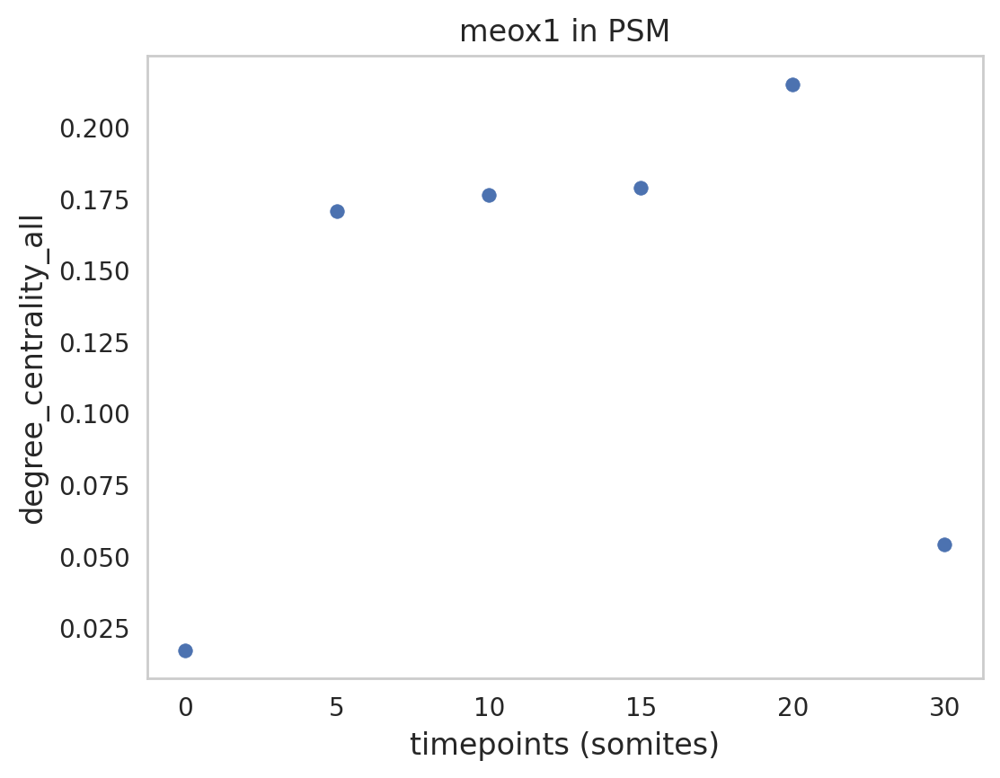

In [242]:
# pick a gene
gene = "meox1"
# pick a celltype
celltype = "PSM"

plt.scatter(genes_timepoints_df.columns, genes_timepoints_df.loc["meox1",:])
plt.xlabel("timepoints (somites)")
plt.ylabel("degree_centrality_all")
plt.title(gene+ " in " + celltype)
plt.xticks(ticks = genes_timepoints_df.columns, labels=[0,5,10,15,20,30])
# plt.show()
plt.grid(False)

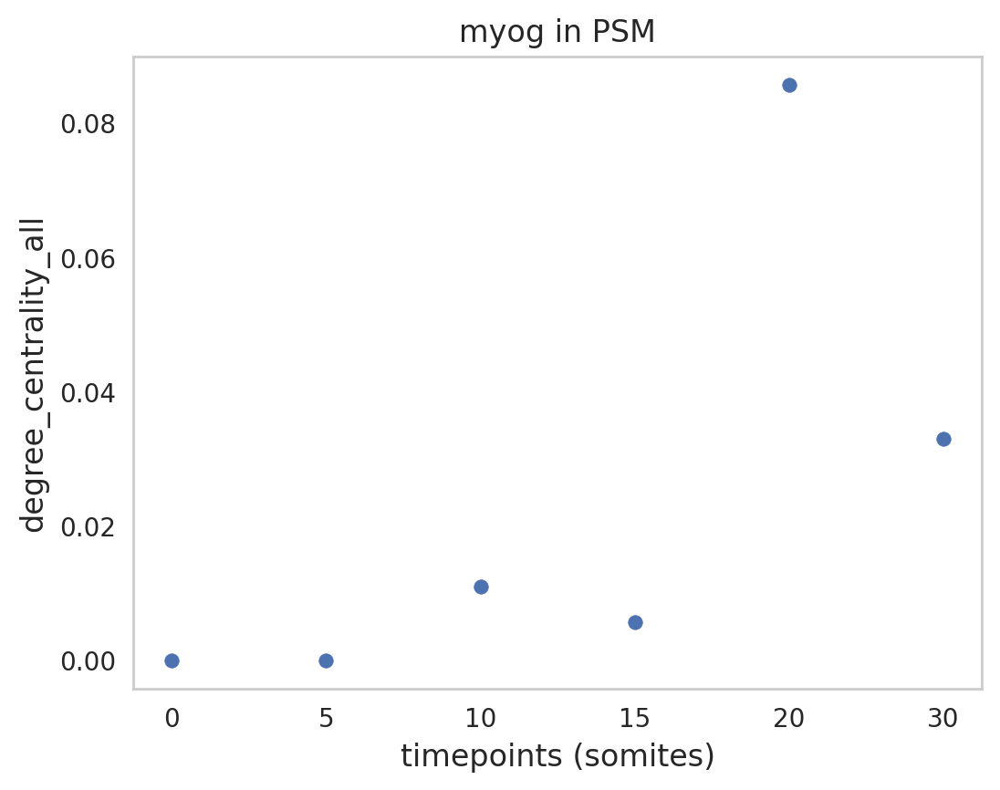

In [243]:
# pick a gene
gene = "myog"
# pick a celltype
celltype = "PSM"

plt.scatter(genes_timepoints_df.columns, genes_timepoints_df.loc[gene,:])
plt.xlabel("timepoints (somites)")
plt.ylabel("degree_centrality_all")
plt.title(gene+ " in " + celltype)
plt.xticks(ticks = genes_timepoints_df.columns, labels=[0,5,10,15,20,30])
# plt.show()
plt.grid(False)

In [252]:
genes_timepoints_df.sort_values("TDR126", ascending=False)[0:20]

,TDR126,TDR127,TDR128,TDR118reseq,TDR125reseq,TDR124reseq
hmga1a,0.130901,0.204545,0.176087,0.083650,0.100209,0.190588
irx7,0.124464,0.090909,0.021739,0.034221,0.000000,0.098824
cirbpa,0.100858,0.047727,0.071739,0.032319,0.054280,0.103529
rarga,0.094421,0.070455,0.093478,0.077947,0.060543,0.000000
arxb,0.092275,0.004545,0.002174,0.001901,0.008351,0.037647
rxrab,0.087983,0.000000,0.000000,0.087452,0.000000,0.000000
rarab,0.085837,0.056818,0.000000,0.077947,0.000000,0.000000
sox19a,0.081545,0.165909,0.065217,0.000000,0.000000,0.000000
hoxb3a,0.079399,0.059091,0.078261,0.087452,0.104384,0.049412
hoxc3a,0.079399,0.072727,0.054348,0.047529,0.039666,0.023529


INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 39 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'C', 'D', 'E', 'G', 'R', 'T', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'q', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'x', 'y', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 38, 39, 40, 42, 53, 55, 68, 69, 70, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 84, 85, 86, 87, 91, 92]
INFO:fontTools.subset:Closed glyph list over 'GSUB': 44 glyphs after
INFO:fo

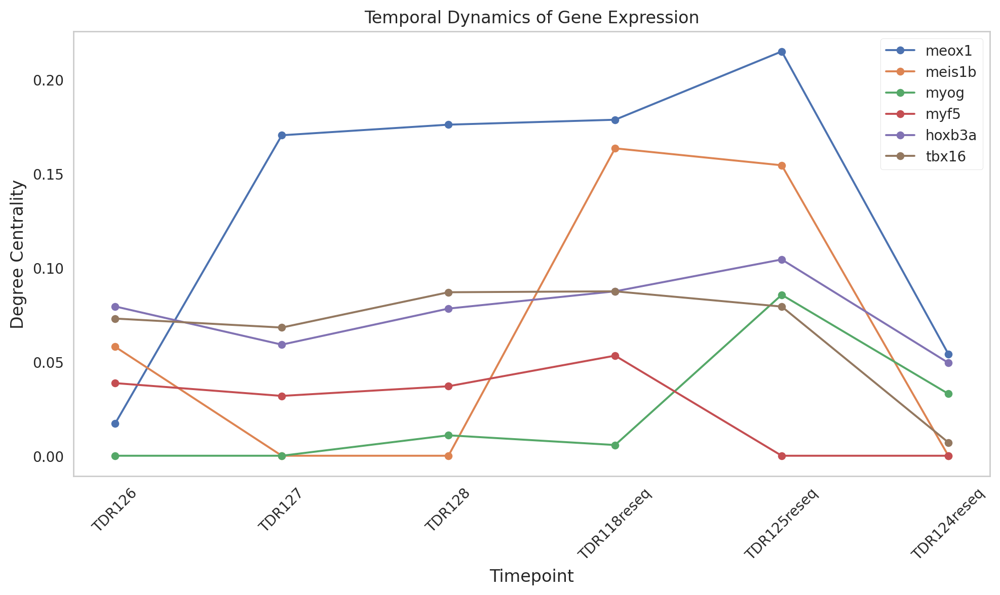

In [261]:
# Let's say the genes of interest are "GeneA" and "GeneB"
genes_of_interest = ["meox1", "meis1b","myog","myf5","hoxb3a","tbx16"]

# Select the data for these genes
data_to_plot = genes_timepoints_df.loc[genes_of_interest]

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))  # You can adjust the figure size as needed

# Loop through each gene to plot its dynamics
for gene in genes_of_interest:
    ax.plot(data_to_plot.columns, data_to_plot.loc[gene], marker='o', linestyle='-', label=gene)

ax.set_xlabel('Timepoint')  # Set the x-axis label
ax.set_ylabel('Degree Centrality')  # Adjust the y-axis label based on your metric
ax.set_title('Temporal Dynamics of Gene Expression')  # Set the plot title
ax.legend()  # Show the legend
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.grid(False)  # Optionally add a grid for easier visualization
plt.tight_layout()  # Adjust layout to not cut off labels
plt.savefig(figpath+"degree_centrality_dynamics_PSM_geneset.pdf")
plt.savefig(figpath+"degree_centrality_dynamics_PSM_geneset.png")
plt.show()

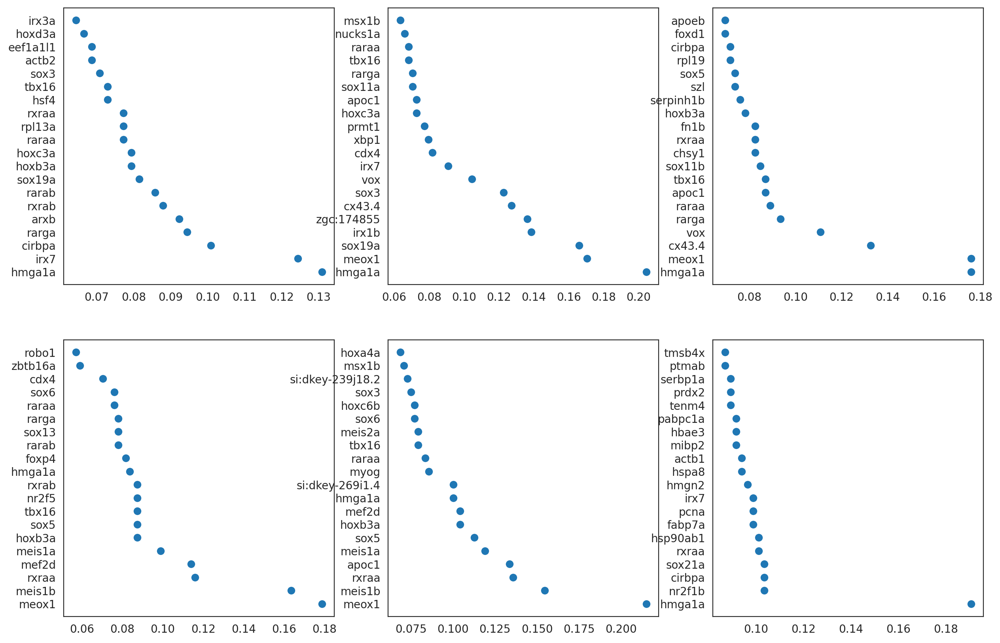

In [123]:
list_timepoints = ["TDR126", "TDR127", "TDR128", "TDR118reseq", "TDR125reseq", "TDR124reseq"]

# define a celltype
celltype = "PSM"

# choose a degree metric to use
degree_metric = "degree_centrality_all"

fig, axs = plt.subplots(2, 3, figsize=(15, 10)) # Adjust the figsize as needed
axs = axs.flatten() # Flatten the array of axes for easy indexing

for index, timepoint in enumerate(list_timepoints):
    df = dict_merged_score[timepoint]
    # extract the merged score for that specific celltype
    merged_score = df[df.cluster==celltype]
    # subset for the celltype of interest
    df = merged_score[merged_score.cluster == celltype]
    df_sorted = df.sort_values(degree_metric, ascending=False)
    
    axs[index].scatter(df_sorted[0:20].degree_centrality_all, df_sorted[0:20].index)

In [103]:
dict_merged_score["TDR124reseq"][dict_merged_score["TDR124reseq"].cluster=="NMPs"]

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster


### Step 2-2. pseudotime

In [92]:
list_celltypes = ["Neural_Crest", "Neural_Anterior", "Neural_Posterior", "NMPs",
                  "PSM", "Somites", "Muscle"]

### network visualization using networkX

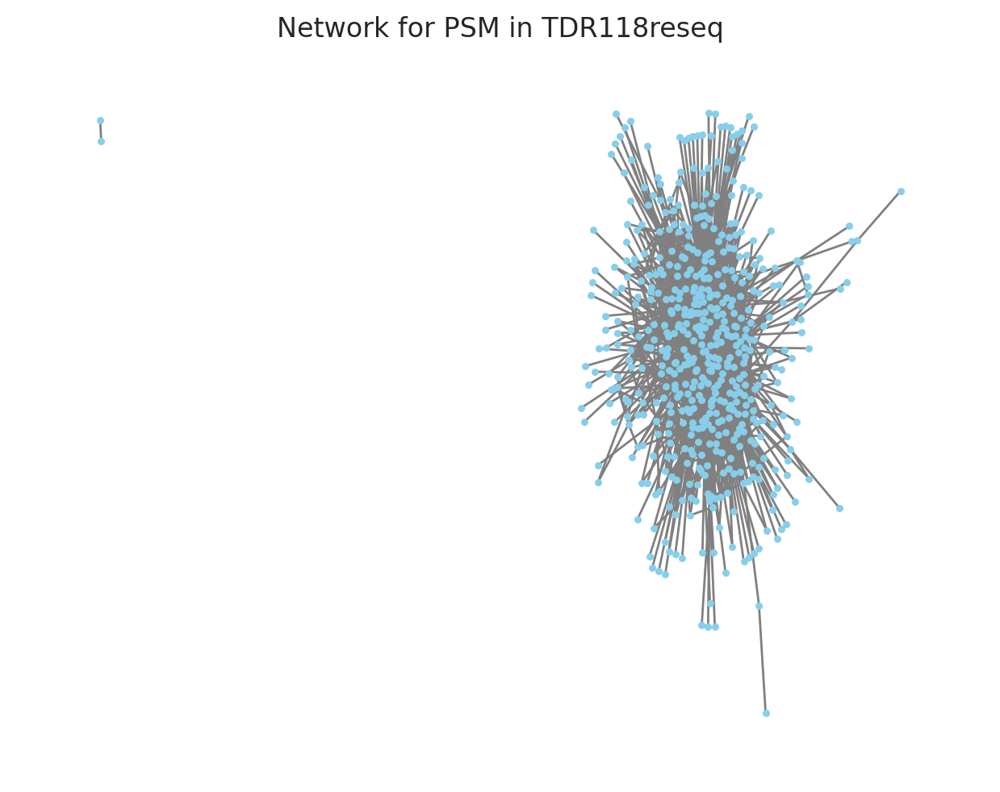

In [113]:
import networkx as nx

dataset = "TDR118reseq"
celltype = "PSM"
df = dict_filtered_GRNs[dataset][celltype]

G = nx.from_pandas_edgelist(df, "source", "target", ["coef_mean"])

# basic visualization
nx.draw(G, with_labels=False, node_color='skyblue', node_size=5, edge_color='gray')
plt.title(f'Network for {celltype} in {dataset}')
plt.show()


In [78]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import community as community_louvain  # Ensure this import works

In [79]:
import community as community_louvain
import matplotlib.cm as cm
import networkx as nx

# # define the df (a GRN[time, celltype])
# dataset = "TDR118reseq"
# celltype = "PSM"
# df = dict_filtered_GRNs[dataset][celltype]

# Construct the network
G = nx.from_pandas_edgelist(df, 'source', 'target', ['coef_mean'])

# Apply community detection
partition = community_louvain.best_partition(G)

# Visualization
# Generate position layout
pos = nx.spring_layout(G)
# Draw
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, node_color=[partition[node] for node in G.nodes()], node_size=20, cmap=cmap)
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()

AttributeError: module 'community' has no attribute 'best_partition'

In [82]:
# # Create a cluster map
# cg = sns.clustermap(df_counts, method='average', metric='euclidean')

# # Row and column dendrogram order
# row_order = cg.dendrogram_row.reordered_ind
# column_order = cg.dendrogram_col.reordered_ind

# # Extracted clustered data based on dendrogram order
# clustered_df = df.iloc[row_order, column_order]

# # If you specifically want the linkage matrix to use with other functions (e.g., scipy)
# row_linkage = cg.dendrogram_row.linkage
# col_linkage = cg.dendrogram_col.linkage

In [114]:
df[df.target=="her1"]

,source,target,coef_mean,coef_abs,p,-logp
74639,meox1,her1,0.023598,0.023598,1.007401e-13,12.996798


In [115]:
df[df.source=="meox1"]

,source,target,coef_mean,coef_abs,p,-logp
59580,meox1,fgfrl1a,0.074868,0.074868,6.806737e-20,19.167061
149311,meox1,ripply1,0.069788,0.069788,7.959315e-23,22.099124
185662,meox1,tjp2b,0.066201,0.066201,4.060328e-19,18.391439
61229,meox1,fn1b,0.065459,0.065459,8.537546e-25,24.068667
181189,meox1,tbx6,0.059878,0.059878,1.372281e-16,15.862557
...,...,...,...,...,...,...
189852,meox1,top2a,0.023520,0.023520,8.422064e-10,9.074581
9319,meox1,arid3c,0.023317,0.023317,6.734967e-12,11.171665
200063,meox1,wnt5b,-0.023018,0.023018,1.229025e-12,11.910439
50828,meox1,emp2,0.022875,0.022875,1.388294e-15,14.857519


In [29]:
df = dict_filtered_GRNs["TDR126"]["NMPs"]

df.sort_values("coef_mean", ascending=False)

,source,target,coef_mean,coef_abs,p,-logp
177180,mafba,rpl15,0.249518,0.249518,1.314674e-12,11.881182
177179,tfap2c,rpl15,0.208459,0.208459,5.448771e-07,6.263701
177182,tfap2a,rpl15,0.133075,0.133075,2.322824e-06,5.633984
216633,rarga,szl,0.115479,0.115479,3.012064e-15,14.521136
95813,hoxc6b,hoxc3a,0.113092,0.113092,4.276631e-14,13.368898
...,...,...,...,...,...,...
216631,foxd3,szl,-0.045867,0.045867,9.998328e-11,10.000073
216656,tfap2a,szl,-0.046079,0.046079,6.311174e-11,10.199890
181472,nhlh2,rps26l,-0.048648,0.048648,1.969883e-13,12.705559
9921,sox11a,apoeb,-0.049435,0.049435,1.105811e-05,4.956319


In [30]:
dataset = "TDR118reseq"
celltype = "PSM"
df = dict_filtered_GRNs[dataset][celltype]



,source,target,coef_mean,coef_abs,p,-logp
177180,mafba,rpl15,0.249518,0.249518,1.314674e-12,11.881182
177179,tfap2c,rpl15,0.208459,0.208459,5.448771e-07,6.263701
177182,tfap2a,rpl15,0.133075,0.133075,2.322824e-06,5.633984
216633,rarga,szl,0.115479,0.115479,3.012064e-15,14.521136
95813,hoxc6b,hoxc3a,0.113092,0.113092,4.276631e-14,13.368898
9715,hmga1a,apoc1,0.105511,0.105511,2.077027e-13,12.682558
177181,mafbb,rpl15,0.099729,0.099729,5.823586e-11,10.234809
168428,hmga1a,ran,0.097424,0.097424,9.941714e-16,15.002539
9905,hmga1a,apoeb,0.097076,0.097076,6.235668e-13,12.205117
15663,nr5a2,bcam,0.093842,0.093842,5.340970e-22,21.272380


In [61]:
df.value_counts("source")[0:30]

source
irx7       91
hmga1a     85
sox19a     67
hoxb9a     59
hoxd9a     57
meox1      56
sox21a     52
irx3a      50
dlx3b      50
vox        44
ctcf       37
lbx2       36
nkx2.7     35
irx1b      34
gbx2       32
eve1       31
ved        31
myf5       30
foxp1b     29
six3b      27
rarga      25
foxc1a     24
sox5       23
xbp1       23
hoxb1b     21
pnx        21
hoxb10a    20
etv2       19
raraa      18
sox1b      18
dtype: int64

In [31]:
ct = "PSM"

GRN_19hpf.merged_score[GRN_19hpf.merged_score["cluster"]==ct].sort_values("degree_centrality_all", ascending=False)

,degree_all,degree_in,degree_out,clustering_coefficient,clustering_coefficient_weighted,degree_centrality_all,degree_centrality_in,degree_centrality_out,betweenness_centrality,closeness_centrality,eigenvector_centrality,page_rank,assortative_coefficient,average_path_length,community_random_walk,module,connectivity,participation,role,cluster
meox1,66,10,56,0.047115,0.058276,0.141631,0.021459,0.120172,2006,0.110970,1.000000,0.004245,-0.244645,0.068915,2,0,3.531464,0.681657,Connector Hub,PSM
meis1b,66,17,49,0.092166,0.105778,0.141631,0.036481,0.105150,6910,0.119120,0.717997,0.003852,-0.244645,0.068915,2,6,3.621357,0.630385,Connector Hub,PSM
apoc1,63,63,0,0.014337,0.019224,0.135193,0.135193,0.000000,0,NaN,0.771168,0.021658,-0.244645,0.068915,5,3,5.477357,0.690854,Connector Hub,PSM
hmga1a,61,30,31,0.093443,0.119594,0.130901,0.064378,0.066524,4550,0.063072,0.959630,0.007888,-0.244645,0.068915,4,5,4.384768,0.567589,Connector Hub,PSM
rxraa,53,15,38,0.111702,0.131984,0.113734,0.032189,0.081545,8084,0.097898,0.922249,0.004217,-0.244645,0.068915,2,0,2.538473,0.679688,Connector Hub,PSM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hand2,1,0,1,0.000000,0.000000,0.002146,0.000000,0.002146,0,79.635835,0.008655,0.001426,-0.244645,0.068915,24,6,-0.840113,0.000000,Ultra peripheral,PSM
tp73,1,0,1,0.000000,0.000000,0.002146,0.000000,0.002146,0,0.088650,0.017790,0.001426,-0.244645,0.068915,2,6,-0.840113,0.000000,Ultra peripheral,PSM
dlx4a,1,0,1,0.000000,0.000000,0.002146,0.000000,0.002146,0,75.111678,0.005264,0.001426,-0.244645,0.068915,22,5,-0.839126,0.000000,Ultra peripheral,PSM
tp63,1,0,1,0.000000,0.000000,0.002146,0.000000,0.002146,0,0.057291,0.008221,0.001426,-0.244645,0.068915,21,5,-0.839126,0.000000,Ultra peripheral,PSM


In [32]:
ct = "PSM"

GRN_19hpf.merged_score[GRN_19hpf.merged_score["cluster"]==ct].sort_values("degree_centrality_all", ascending=False)

,degree_all,degree_in,degree_out,clustering_coefficient,clustering_coefficient_weighted,degree_centrality_all,degree_centrality_in,degree_centrality_out,betweenness_centrality,closeness_centrality,eigenvector_centrality,page_rank,assortative_coefficient,average_path_length,community_random_walk,module,connectivity,participation,role,cluster
meox1,66,10,56,0.047115,0.058276,0.141631,0.021459,0.120172,2006,0.110970,1.000000,0.004245,-0.244645,0.068915,2,0,3.531464,0.681657,Connector Hub,PSM
meis1b,66,17,49,0.092166,0.105778,0.141631,0.036481,0.105150,6910,0.119120,0.717997,0.003852,-0.244645,0.068915,2,6,3.621357,0.630385,Connector Hub,PSM
apoc1,63,63,0,0.014337,0.019224,0.135193,0.135193,0.000000,0,NaN,0.771168,0.021658,-0.244645,0.068915,5,3,5.477357,0.690854,Connector Hub,PSM
hmga1a,61,30,31,0.093443,0.119594,0.130901,0.064378,0.066524,4550,0.063072,0.959630,0.007888,-0.244645,0.068915,4,5,4.384768,0.567589,Connector Hub,PSM
rxraa,53,15,38,0.111702,0.131984,0.113734,0.032189,0.081545,8084,0.097898,0.922249,0.004217,-0.244645,0.068915,2,0,2.538473,0.679688,Connector Hub,PSM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hand2,1,0,1,0.000000,0.000000,0.002146,0.000000,0.002146,0,79.635835,0.008655,0.001426,-0.244645,0.068915,24,6,-0.840113,0.000000,Ultra peripheral,PSM
tp73,1,0,1,0.000000,0.000000,0.002146,0.000000,0.002146,0,0.088650,0.017790,0.001426,-0.244645,0.068915,2,6,-0.840113,0.000000,Ultra peripheral,PSM
dlx4a,1,0,1,0.000000,0.000000,0.002146,0.000000,0.002146,0,75.111678,0.005264,0.001426,-0.244645,0.068915,22,5,-0.839126,0.000000,Ultra peripheral,PSM
tp63,1,0,1,0.000000,0.000000,0.002146,0.000000,0.002146,0,0.057291,0.008221,0.001426,-0.244645,0.068915,21,5,-0.839126,0.000000,Ultra peripheral,PSM


In [34]:
ct = "PSM"

GRN_24hpf.merged_score[GRN_24hpf.merged_score["cluster"]==ct].sort_values("degree_centrality_all", ascending=False)

,degree_all,degree_in,degree_out,clustering_coefficient,clustering_coefficient_weighted,degree_centrality_all,degree_centrality_in,degree_centrality_out,betweenness_centrality,closeness_centrality,eigenvector_centrality,page_rank,assortative_coefficient,average_path_length,community_random_walk,module,connectivity,participation,role,cluster
hmga1a,86,65,21,0.083447,0.093731,0.231183,0.174731,0.056452,1221,3.084511,1.000000,0.016021,-0.04954,0.020356,2,3,4.712182,0.681179,Connector Hub,PSM
actb1,70,70,0,0.014907,0.020163,0.188172,0.188172,0.000000,0,NaN,0.491866,0.018411,-0.04954,0.020356,2,0,5.587235,0.729388,Connector Hub,PSM
hsp90ab1,68,68,0,0.021071,0.028409,0.182796,0.182796,0.000000,0,NaN,0.632795,0.017102,-0.04954,0.020356,2,4,3.411550,0.643599,Connector Hub,PSM
ptmab,67,67,0,0.007237,0.008942,0.180108,0.180108,0.000000,0,NaN,0.594568,0.011915,-0.04954,0.020356,2,4,2.929332,0.687458,Connector Hub,PSM
hmgn2,61,61,0,0.026230,0.039394,0.163978,0.163978,0.000000,0,NaN,0.695886,0.009717,-0.04954,0.020356,2,4,2.808778,0.654125,Connector Hub,PSM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cygb1,1,1,0,0.000000,0.000000,0.002688,0.002688,0.000000,0,NaN,0.002228,0.001820,-0.04954,0.020356,2,0,-0.676481,0.000000,Ultra peripheral,PSM
traf4a,1,1,0,0.000000,0.000000,0.002688,0.002688,0.000000,0,NaN,0.001738,0.001756,-0.04954,0.020356,1,0,-0.676481,0.000000,Ultra peripheral,PSM
colec12,1,1,0,0.000000,0.000000,0.002688,0.002688,0.000000,0,NaN,0.002641,0.001740,-0.04954,0.020356,2,0,-0.676481,0.000000,Ultra peripheral,PSM
slc6a8,1,1,0,0.000000,0.000000,0.002688,0.002688,0.000000,0,NaN,0.002183,0.001757,-0.04954,0.020356,1,0,-0.676481,0.000000,Ultra peripheral,PSM


In [35]:
# check the genes that appear/disappear over time within the GRNs
ct = "PSM"

# extract the GRNs for specific cell-types
df1 = dict_GRN_16hpf[ct]
df2 = dict_GRN_19hpf[ct]
df3 = dict_GRN_24hpf[ct]

# Extracting unique genes from each dataframe
genes_16hpf = set(df1['source']).union(set(df1['target']))
genes_19hpf = set(df2['source']).union(set(df2['target']))
genes_24hpf = set(df3['source']).union(set(df3['target']))


In [37]:
# Finding genes that appear or disappear
genes_appeared = (genes_19hpf.union(genes_24hpf)).difference(genes_16hpf)
genes_disappeared = genes_16hpf.difference(genes_19hpf.union(genes_24hpf))

print("Genes appeared:", genes_appeared)
print("Genes disappeared:", genes_disappeared)

Genes appeared: {'ldb3a', 'morc3b', 'atp2a1', 'adamts3', 'ap2m1a', 'hs3st3b1a', 'bcas2', 'hoxc9a', 'hoxb8a', 'dbx1a', 'ipo7', 'mcm6', 'traf4a', 'fosl2', 'gadd45gb.1', 'foxa3', 'tmem88b', 'atoh1a', 'bsx', 'nusap1', 'hand2', 'efhd1', 'fsta', 'myl1', 'phlda2', 'isl1l', 'tmsb', 'myo1cb', 'dld', 'otpb', 'tbr1a', 'col11a1b', 'mfap2', 'ackr3b', 'si:ch73-21g5.7', 'cd63', 'spi2', 'lbx1b', 'slc6a8', 'bhlhe40', 'tp53', 'gfi1aa', 'sox1b', 'pdap1a', 'nkx6.2', 'noto', 'sfrp5', 'klf2a', 'rpsa', 'ppfia4', 'ek1', 'lrrc17', 'pmp22a', 'nkx6.3', 'glcci1a', 'ncam1b', 'pitx3', 'cdh6', 'mitfa', 'fosab', 'cdh15', 'elavl3', 'limch1a', 'nr5a1b', 'dlx2a', 'neurod6b', 'tbx21', 'neo1a', 'actc1b', 'hoxa13a', 'bhlhe23', 'foxa', 'colec12', 'rdh10a', 'grhl2b', 'sox14', 'nr4a2a', 'mylpfa', 'her15.2', 'foxg1d', 'mafb', 'prrx1b', 'mycn', 'midn', 'slc25a37', 'alas2', 'musk', 'ccng1', 'her7', 'col1a1a', 'nkx1.2lb', 'eif5a2', 'znrf3', 'col1a2', 'postnb', 'kpna2', 'sec61a1l', 'jam2a', 'emx2', 'ryr1b', 'hbae1.3', 'pax8', 'otx

## dimensionality reduction for GRN (GRN[time, celltype])

- here, we will use the GRN[0somites, NMPs] to see how its dim.reduction (UMAP) looks like.



In [48]:
# create an adata object for a GRN (time,celltype)
adata = sc.AnnData(X=sp.csc_matrix(df_counts.values))
adata

adata.obs_names = df_counts.index
adata.var_names = df_counts.columns
adata

AnnData object with n_obs × n_vars = 229 × 219

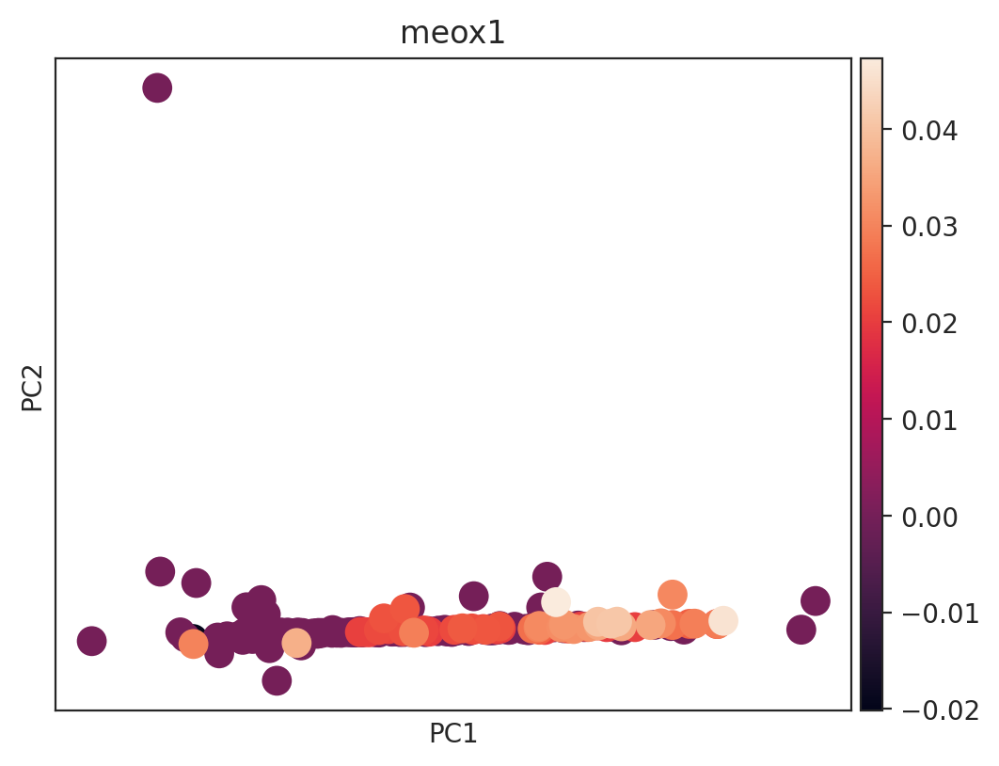

In [49]:
sc.tl.pca(adata)
sc.pl.pca(adata, color="meox1")

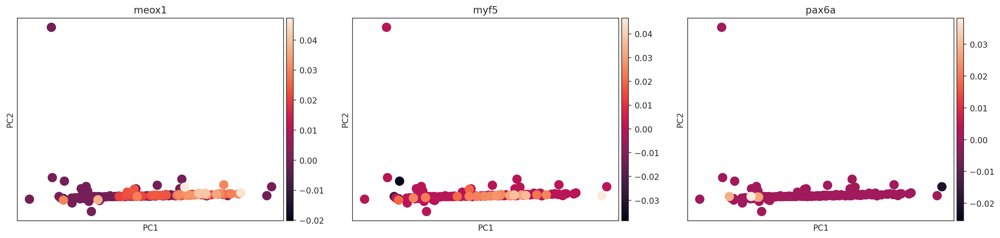

In [63]:
sc.pl.pca(adata, color=["meox1","myf5","pax6a"])

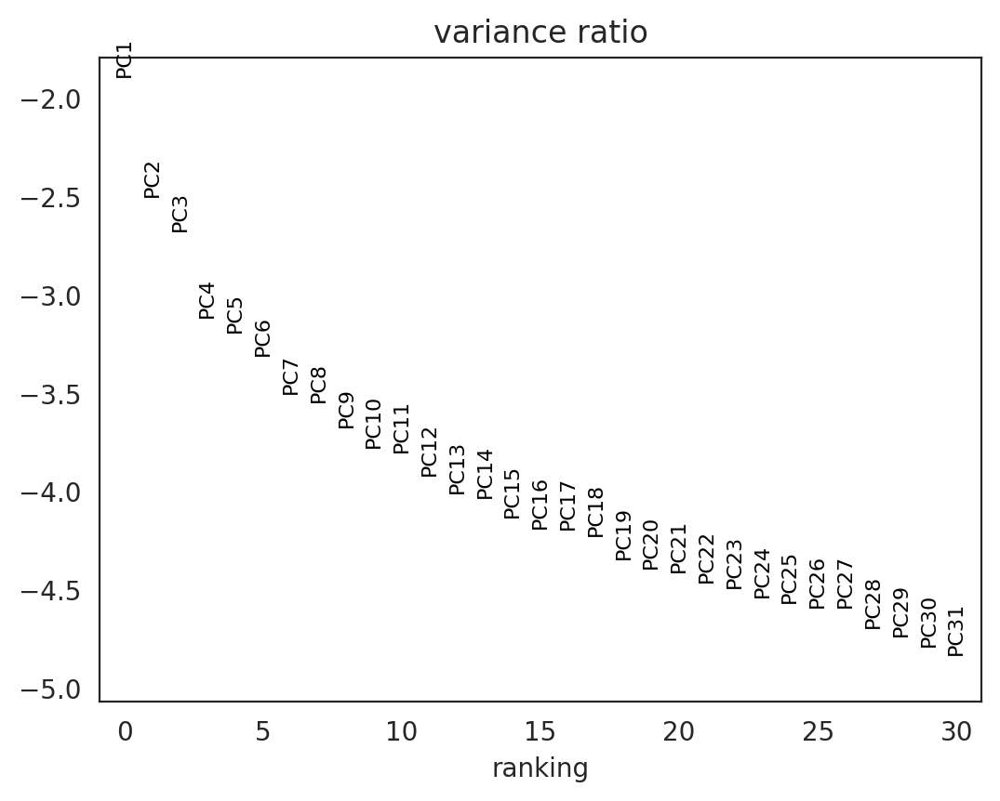

In [52]:
sc.pl.pca_variance_ratio(adata, log=True)

In [54]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
# sc.tl.paga(adata)
# sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
# sc.tl.umap(adata, init_pos='paga')

sc.tl.umap(adata)

In [57]:
df_counts

source,alx4a,arxb,ascl1a,barhl1a,barhl2,bcl11ab,cdx4,creb5b,ctcf,dbx1a,...,ved,vent,vox,xbp1,zbtb18,zgc:101100,zic1,zic2a,zic2b,zic3
target,,,,,,,,,,,,,,,,,,,,,
abcf1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.026139,0.000000,...,0.0,0.000000,0.000000,0.022522,0.0,0.0,0.000000,0.0,0.000000,0.0
actb1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.025302,...,0.0,0.000000,0.020913,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0
actb2,0.0,0.0,0.0,0.0,0.0,0.0,0.030564,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.023308,0.0,0.042496,0.0
akap12b,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0
aldoaa,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wnt5b,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.025416,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0
ywhae1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0
zbtb16a,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.039421,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0


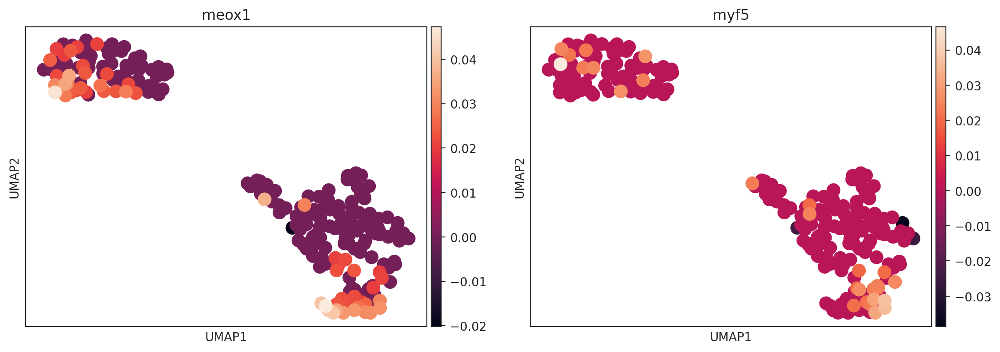

In [64]:
sc.pl.umap(adata, color=["meox1","myf5"])

In [65]:
adata.write_h5ad("/hpc/projects/data.science/yangjoon.kim/zebrahub_multiome/data/processed_data/03_celloracle_celltype_GRNs/GRN_0somites_NMPs.h5ad")

## network visualization using networkx

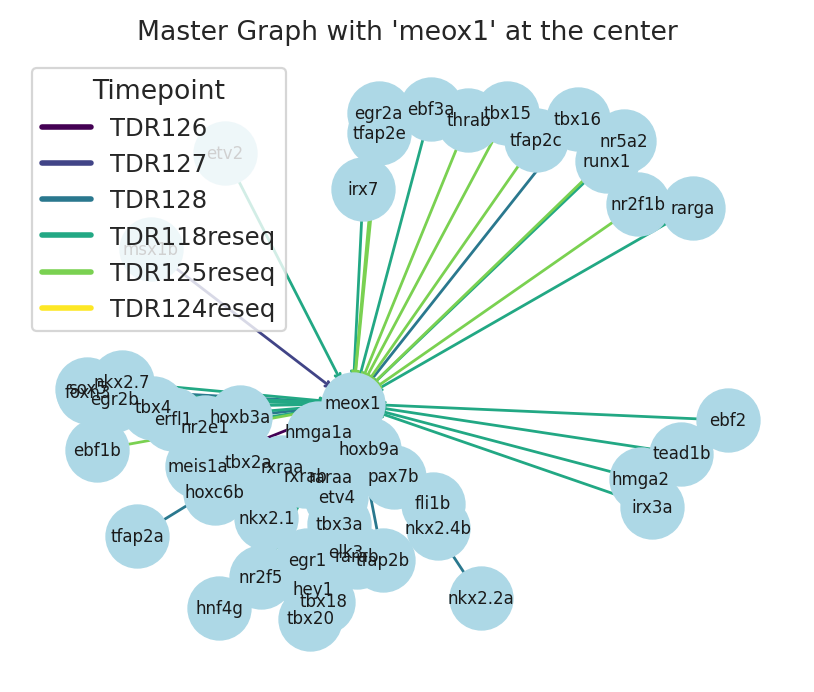

In [303]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np

# Assuming 'df_counts_union' is a dictionary with your DataFrames for each timepoint
# And 'goi' is your gene of interest

# Initialize the master graph
master_graph = nx.DiGraph()

# Generate a colormap with as many colors as there are timepoints
colormap = plt.cm.viridis  # Use the viridis colormap
color_list = [colormap(i) for i in np.linspace(0, 1, len(df_counts_union))]

# List to hold edge color data
edge_colors = []

# Add 'meox1' as a central node
master_graph.add_node('meox1')

# Add edges to the graph, pointing towards 'meox1'
for idx, (timepoint, df) in enumerate(df_counts_union.items()):
    df_goi = df.loc[goi, :]
    df_goi_filtered = df_goi[df_goi != 0]
    for target, weight in df_goi_filtered.iteritems():
        master_graph.add_edge(target, 'meox1', weight=weight, color=color_list[idx])
        edge_colors.append(color_list[idx])

# Calculate positions with 'meox1' at the center
pos = nx.spring_layout(master_graph)
pos['meox1'] = np.array([0, 0])  # Position 'meox1' at the center of the layout

# Draw the network
plt.figure(figsize=(5, 4))
nx.draw_networkx_nodes(master_graph, pos, node_color='lightblue', node_size=500)
nx.draw_networkx_edges(master_graph, pos, edge_color=edge_colors, arrowstyle='->', arrowsize=5)
nx.draw_networkx_labels(master_graph, pos, font_size=6, font_family='sans-serif')

# Create a legend for the timepoints
legend_elements = [plt.Line2D([0], [0], color=color, lw=2, label=timepoint)
                   for color, timepoint in zip(color_list, df_counts_union.keys())]
plt.legend(handles=legend_elements, title="Timepoint")

plt.title("Master Graph with 'meox1' at the center")
plt.axis('off')
plt.show()

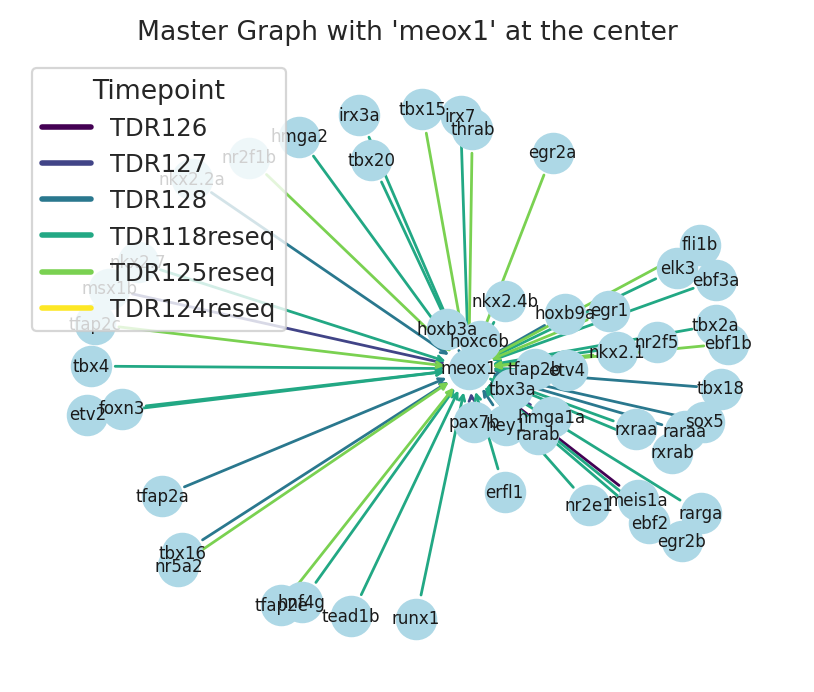

In [304]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np

# Assuming 'df_counts_union' is a dictionary with your DataFrames for each timepoint
# And 'goi' is your gene of interest

# Initialize the master graph
master_graph = nx.DiGraph()

# Generate a colormap with as many colors as there are timepoints
colormap = plt.cm.viridis  # Use the viridis colormap
color_list = [colormap(i) for i in np.linspace(0, 1, len(df_counts_union))]

# List to hold edge color data
edge_colors = []

# Add 'meox1' as a central node
master_graph.add_node('meox1')

# Add edges to the graph, pointing towards 'meox1'
for idx, (timepoint, df) in enumerate(df_counts_union.items()):
    df_goi = df.loc[goi, :]
    df_goi_filtered = df_goi[df_goi != 0]
    for target, weight in df_goi_filtered.iteritems():
        master_graph.add_edge(target, 'meox1', weight=weight, color=color_list[idx])
        edge_colors.append(color_list[idx])

# Calculate positions with 'meox1' at the center
pos = nx.spring_layout(master_graph)
pos['meox1'] = np.array([0, 0])  # Position 'meox1' at the center of the layout

# Draw the network
plt.figure(figsize=(5, 4))
nx.draw_networkx_nodes(master_graph, pos, node_color='lightblue', node_size=200)
nx.draw_networkx_edges(master_graph, pos, edge_color=edge_colors, arrowstyle='->', arrowsize=5)
nx.draw_networkx_labels(master_graph, pos, font_size=6, font_family='sans-serif')

# Create a legend for the timepoints
legend_elements = [plt.Line2D([0], [0], color=color, lw=2, label=timepoint)
                   for color, timepoint in zip(color_list, df_counts_union.keys())]
plt.legend(handles=legend_elements, title="Timepoint")

plt.title("Master Graph with 'meox1' at the center")
plt.axis('off')
plt.show()

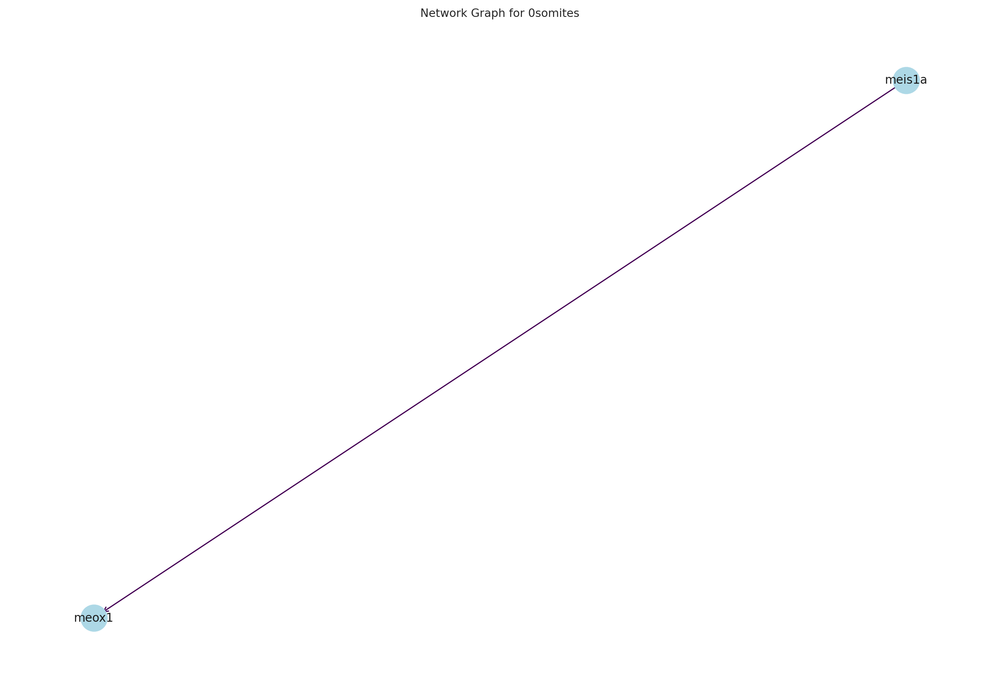

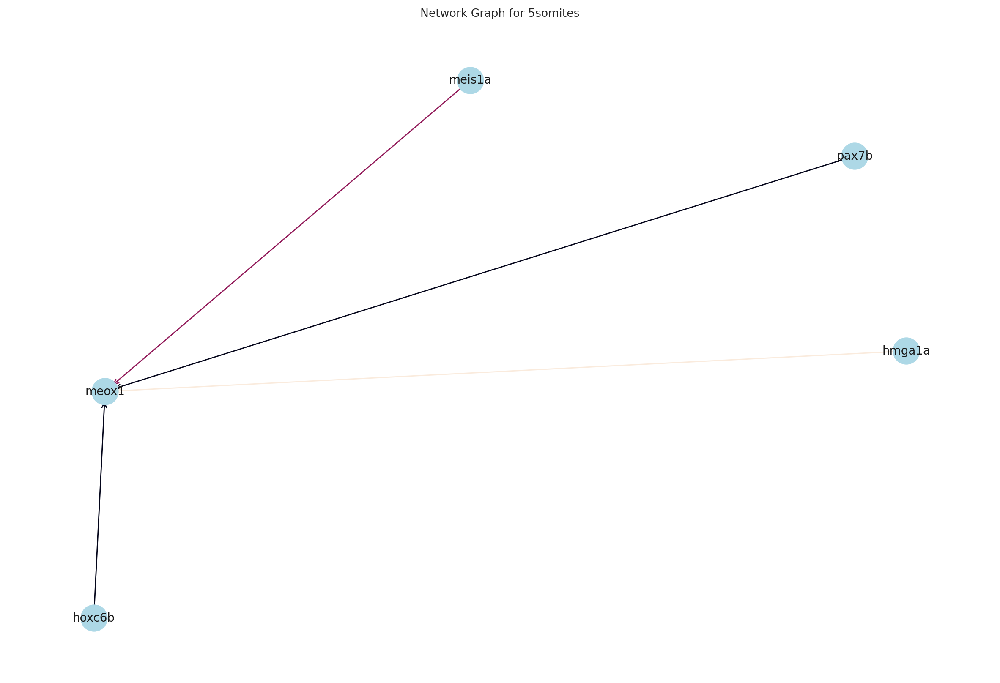

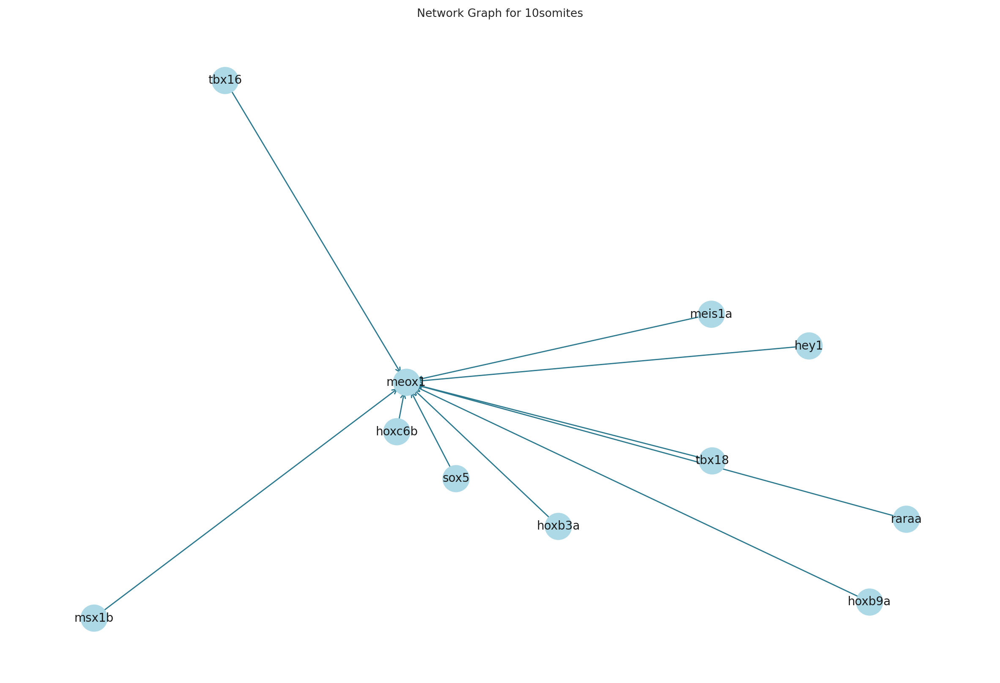

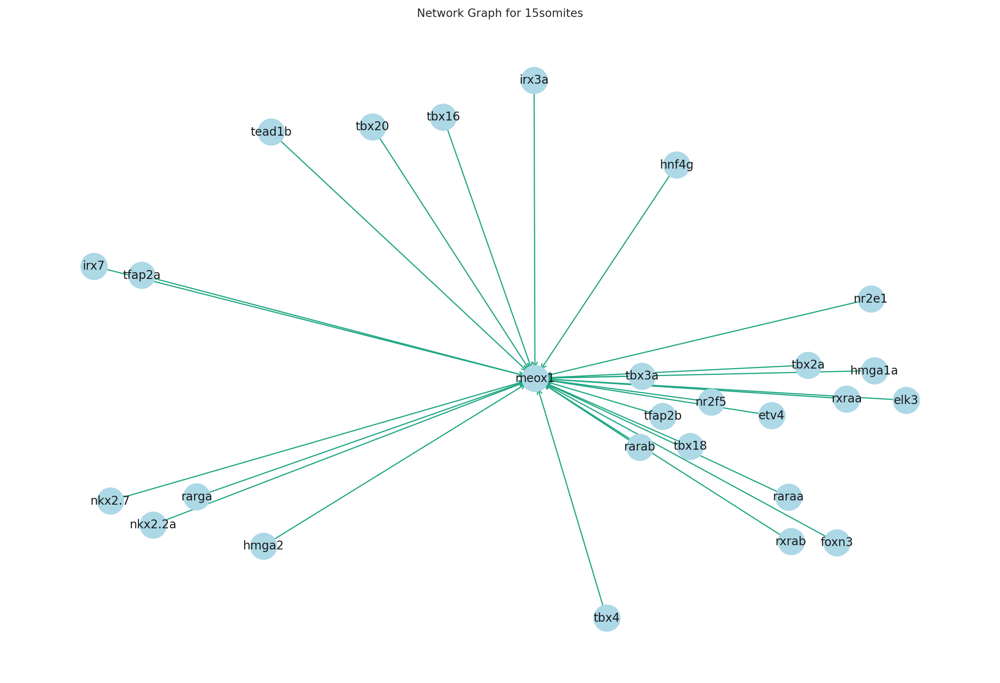

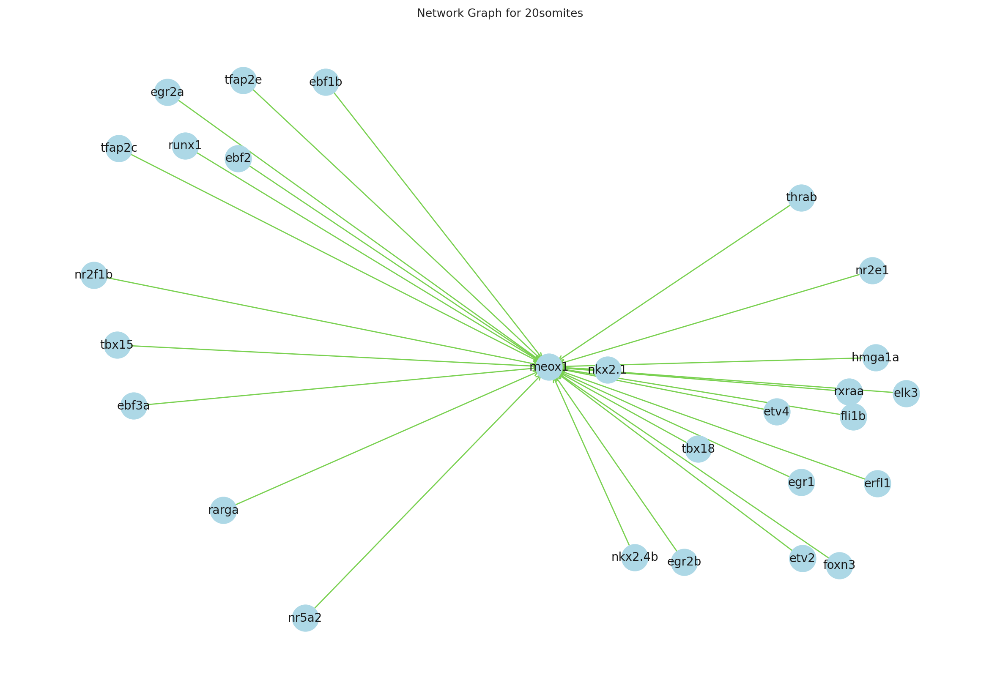

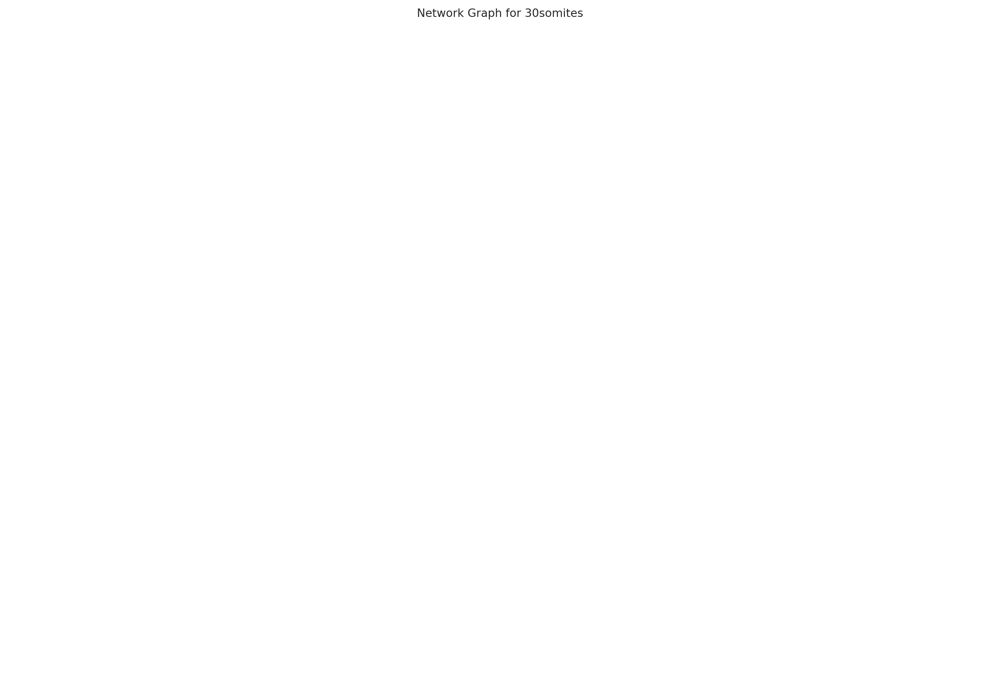

In [293]:
import matplotlib.pyplot as plt
import networkx as nx

# Assuming 'df_counts_union' is a dictionary with your DataFrames for each timepoint
# And 'goi' is your gene of interest
# Also assuming 'master_graph' is your previously created master graph
# And 'pos' is the dictionary of positions for each node in the master graph

# First, let's make a copy of the master graph's positions for reuse
master_positions = pos.copy()

stages = ['0somites', '5somites', '10somites', '15somites', '20somites', '30somites']

# Now let's create and plot a separate graph for each timepoint
for idx, (timepoint, df) in enumerate(df_counts_union.items()):
    
    stage = stages[idx]
    
    # Initialize a new graph for the timepoint
    G_timepoint = nx.DiGraph()
    
    # Add nodes and edges for this timepoint
    df_goi = df.loc[goi, :]
    df_goi_filtered = df_goi[df_goi != 0]
    for target, weight in df_goi_filtered.iteritems():
        G_timepoint.add_edge(target, 'meox1', weight=weight, color=color_list[idx])
    
    # Now plot using the master positions
    plt.figure(figsize=(15, 10))
    nx.draw_networkx_nodes(G_timepoint, master_positions, node_color='lightblue', node_size=500)
    nx.draw_networkx_edges(G_timepoint, master_positions, edge_color=color_list[idx], arrowstyle='->', arrowsize=10)
    nx.draw_networkx_labels(G_timepoint, master_positions, font_size=10, font_family='sans-serif')
    
    plt.title(f"Network Graph for {stage}")
    plt.axis('off')
    plt.savefig(figpath+f"subgraph_target_meox1_{stage}.pdf")
    plt.show()

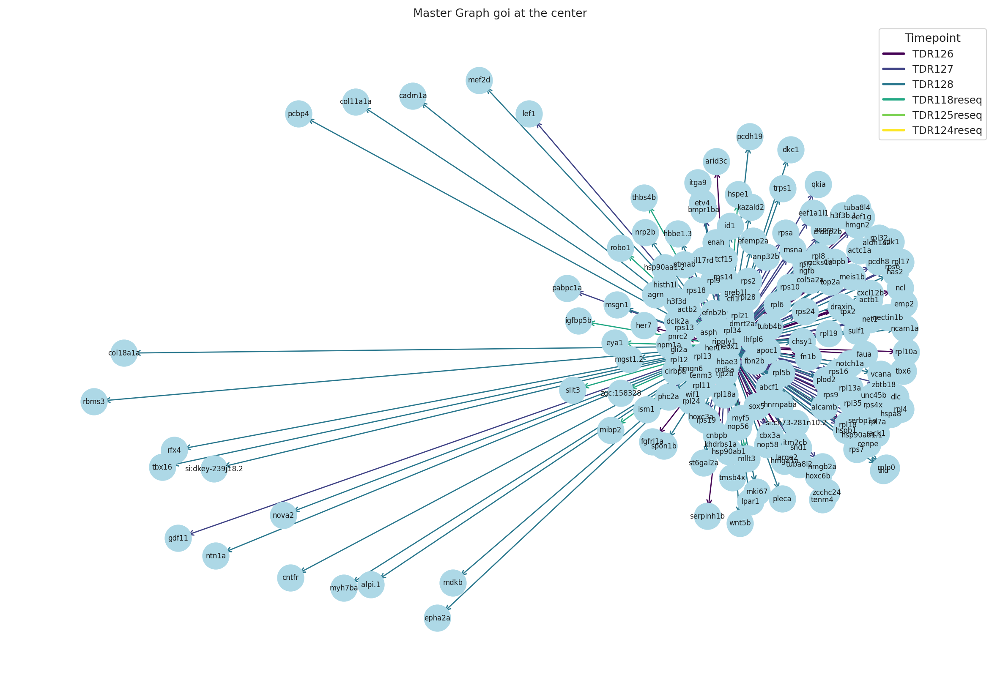

In [312]:
# Assuming 'df_counts_union' is a dictionary with your DataFrames for each timepoint
# And 'goi' is your gene of interest
goi="meox1"

# Initialize the master graph
master_graph = nx.DiGraph()

# Generate a colormap with as many colors as there are timepoints
colormap = plt.cm.viridis  # Use the viridis colormap
color_list = [colormap(i) for i in np.linspace(0, 1, len(df_counts_union))]

# List to hold edge color data
edge_colors = []

# Add 'meox1' as a central node
master_graph.add_node(goi)

# Add edges to the graph, pointing towards goi (source, columns)
for idx, (timepoint, df) in enumerate(df_counts_union.items()):
    df_goi = df.loc[:, goi]
    df_goi_filtered = df_goi[df_goi != 0]
    for target, weight in df_goi_filtered.iteritems():
        master_graph.add_edge(target, goi, weight=weight, color=color_list[idx])
        edge_colors.append(color_list[idx])

# Calculate positions with 'meox1' at the center
pos = nx.spring_layout(master_graph)
pos[goi] = np.array([0, 0])  # Position 'meox1' at the center of the layout

# Draw the network
plt.figure(figsize=(15, 10))
nx.draw_networkx_nodes(master_graph, pos, node_color='lightblue', node_size=500)
nx.draw_networkx_edges(master_graph, pos, edge_color=edge_colors, arrowstyle='<-', arrowsize=10)
nx.draw_networkx_labels(master_graph, pos, font_size=6, font_family='sans-serif')

# Create a legend for the timepoints
legend_elements = [plt.Line2D([0], [0], color=color, lw=2, label=timepoint)
                   for color, timepoint in zip(color_list, df_counts_union.keys())]
plt.legend(handles=legend_elements, title="Timepoint")

plt.title("Master Graph goi at the center")
plt.axis('off')
plt.show()

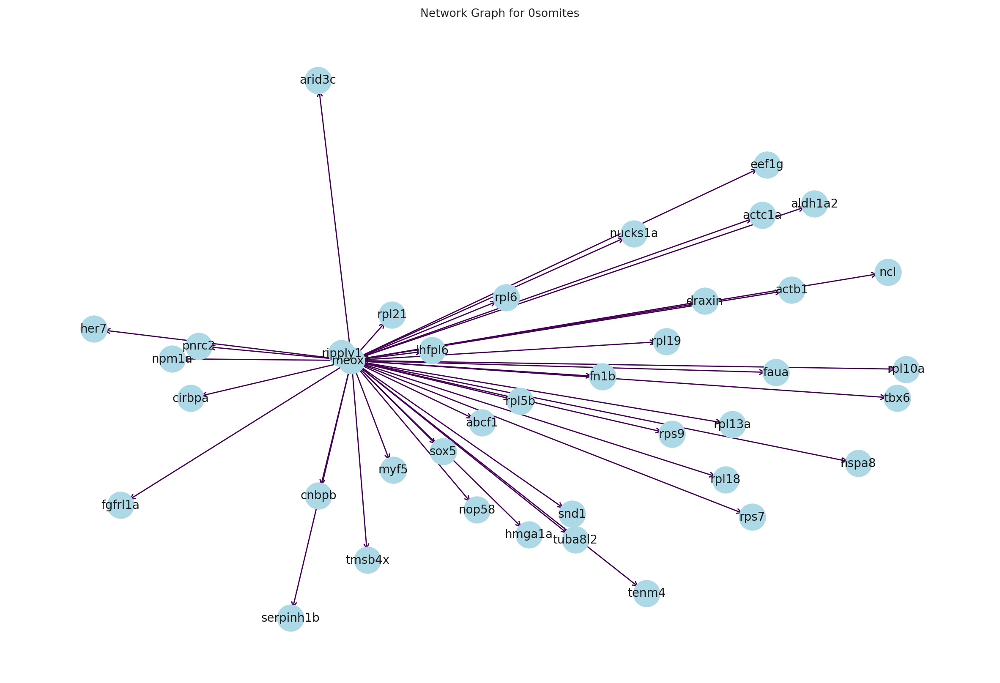

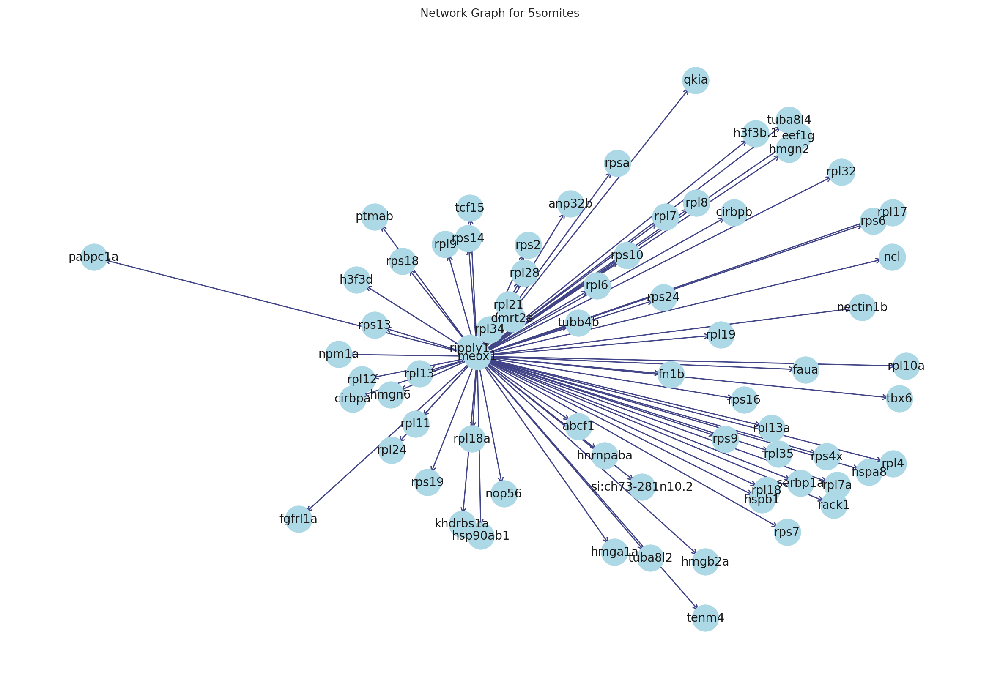

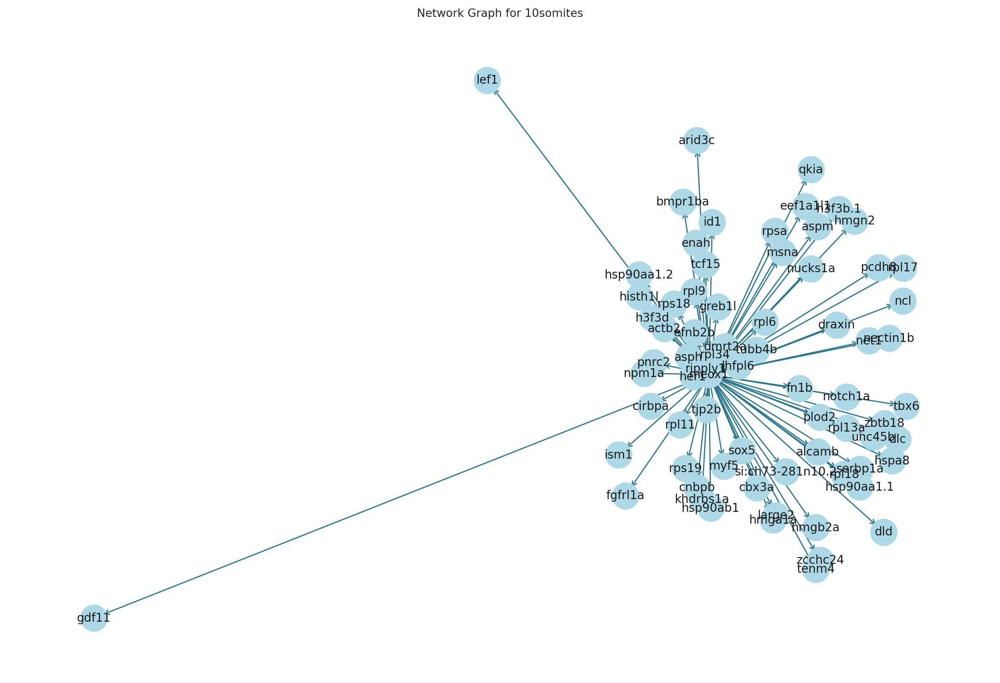

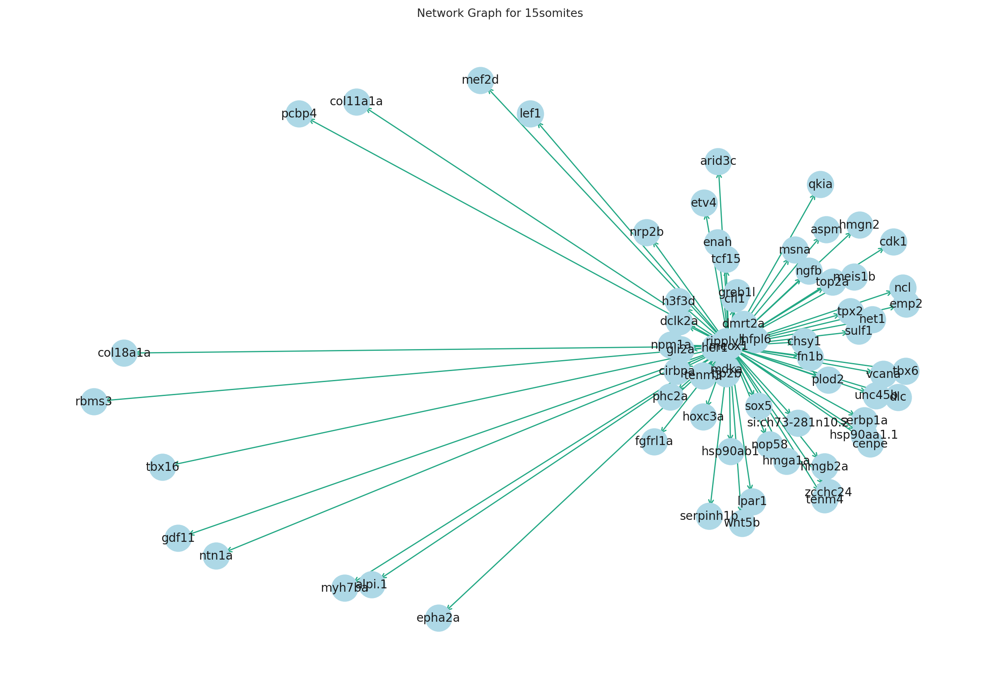

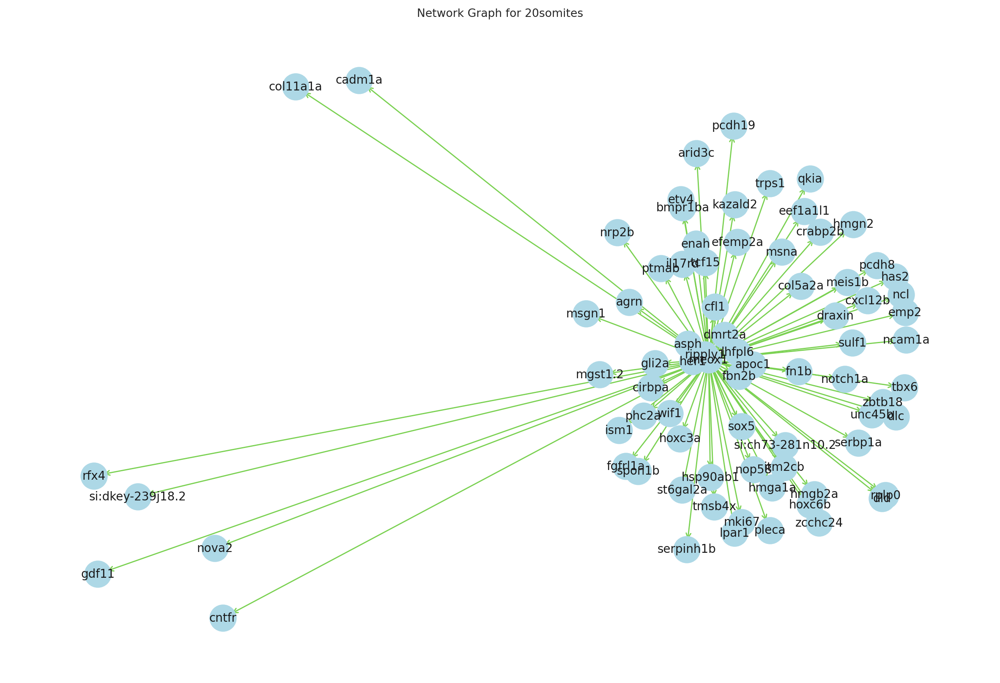

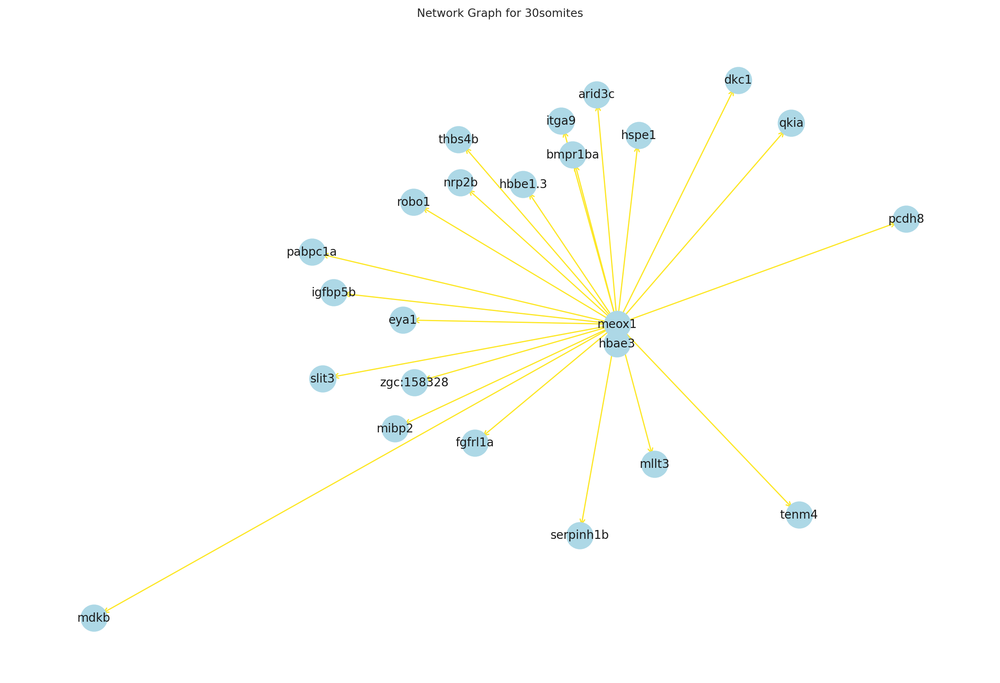

In [314]:
import matplotlib.pyplot as plt
import networkx as nx

# Assuming 'df_counts_union' is a dictionary with your DataFrames for each timepoint
# And 'goi' is your gene of interest
# Also assuming 'master_graph' is your previously created master graph
# And 'pos' is the dictionary of positions for each node in the master graph

# First, let's make a copy of the master graph's positions for reuse
master_positions = pos.copy()

stages = ['0somites', '5somites', '10somites', '15somites', '20somites', '30somites']

# Now let's create and plot a separate graph for each timepoint
for idx, (timepoint, df) in enumerate(df_counts_union.items()):
    
    stage = stages[idx]
    
    # Initialize a new graph for the timepoint
    G_timepoint = nx.DiGraph()
    
    # Add nodes and edges for this timepoint
    df_goi = df.loc[:, goi]
    df_goi_filtered = df_goi[df_goi != 0]
    for target, weight in df_goi_filtered.iteritems():
        G_timepoint.add_edge(target, goi, weight=weight, color=color_list[idx])
    
    # Now plot using the master positions
    plt.figure(figsize=(15, 10))
    nx.draw_networkx_nodes(G_timepoint, master_positions, node_color='lightblue', node_size=500)
    nx.draw_networkx_edges(G_timepoint, master_positions, edge_color=color_list[idx], arrowstyle='<-', arrowsize=10)
    nx.draw_networkx_labels(G_timepoint, master_positions, font_size=10, font_family='sans-serif')
    
    plt.title(f"Network Graph for {stage}")
    plt.axis('off')
    plt.savefig(figpath+f"subgraph_source_{goi}_{stage}.pdf")
    plt.show()